## Alunos:
### 49063 Ruben Santos
### 50185 Gonçalo Fonseca

## 1. Understand the problem

O objetivo do conjunto de dados CIFAR-10 é desenvolver e avaliar modelos de machine learning para classificação de imagens.
Mais especificamente, a tarefa é treinar um modelo que possa classificar com precisão cada imagem em uma das 10 classes possíveis, que incluem:

- avião 
- automóvel 
- pássaro
- gato
- veado
- cao
- sapo
- cavalo
- navio
- caminhao

### Import libraries and get the data

In [1]:
import numpy as np
import numpy.random as rnd
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import itertools
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.metrics import roc_curve
from sklearn.metrics import precision_recall_curve

import keras.datasets.cifar10 as cifar10
from sklearn.neural_network import MLPClassifier
from skimage import color

from sklearn.preprocessing import StandardScaler

from sklearn.svm import SVC
from sklearn.linear_model import SGDClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression

from sklearn.model_selection import train_test_split

from sklearn.decomposition import PCA
from os import cpu_count
N_JOBS = cpu_count() -1 if cpu_count() != 1 else 1


(Xtrain, ytrain), (Xtest, ytest) = cifar10.load_data()

# Dimensoes
print("Training set:", Xtrain.shape,  ytrain.shape)
print("Training Types:", Xtrain.dtype,  ytrain.dtype)

print("\nTest set:    ", Xtest.shape,  ytest.shape)
print("Test Types:    ", Xtest.dtype,  ytest.dtype)

Training set: (50000, 32, 32, 3) (50000, 1)
Training Types: uint8 uint8

Test set:     (10000, 32, 32, 3) (10000, 1)
Test Types:     uint8 uint8


Para importar os dados para o projeto, foram utilizados os dados do conjunto CIFAR10. Este conjunto de dados contém um total de 60000 imagens, rotuladas em 10 diferentes classes ('airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck'), em que cada imagem é uma imagem colorida de 32 por 32 pixeis. 

Este dataset encontra-se dividido em 50000 imagens de treino, e 10000 imagens de teste. 
Neste caso, os dados apenas estão divididos em dados de treino e de teste, em que é necessário ter em atenção que o desempenho do modelo no conjunto de teste pode ser otimista, uma vez que o modelo foi treinado e ajustado em todo o conjunto de treino, sem um conjunto de validação para ajustar os hiperparâmetros. O que muitas vezes é feito é dividir os dados em dados de treino, validação e teste, em que o conjunto de treino é utilizado para ajustar os parâmetros do modelo, enquanto o conjunto de validação é utilizado para ajustar os hiperparâmetros, como a taxa de aprendizagem. Por fim, o conjunto de teste é utilizado para avaliar o desempenho final do modelo.

### Data Preparation

In [2]:
# Existem 10 classes - ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']
np.unique(ytrain)

array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9], dtype=uint8)

c:\Users\ruben\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


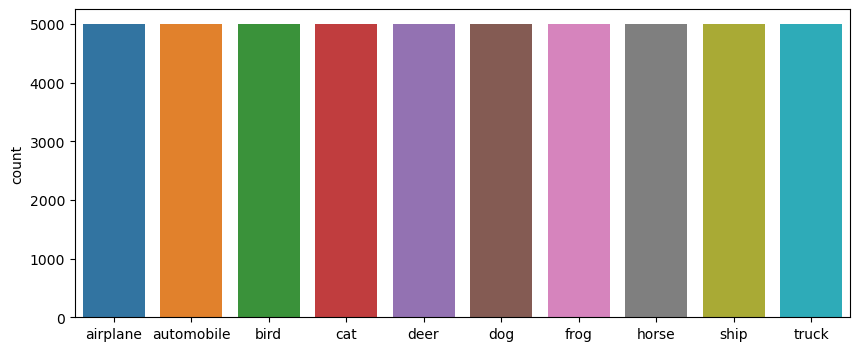

In [3]:
# Dimensoes por categoria
classes = ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']
plt.figure(figsize=(10,4))
p = sns.countplot(ytrain.flatten())
p.set(xticklabels=classes)
plt.show()


É possível observar que, para cada classe do conjunto de treino, existem 5000 instâncias. Logo não é necessario fazer um balanceamento dos dados, uma vez que já estão balanceados.

De seguida, verifica-se se existem alguns dados com valores nulos (NaN).

In [4]:
np.isnan(Xtrain).any()

False

In [5]:
np.isnan(Xtest).any()

False

Não há valores NaN no nosso conjunto de dados, tendo todas as categorias têm a mesma quantidade de dados.
Por essa razão, não é necessário pré-processar os dados para lidar com valores NaN.

De seguida, verificou-se um exemplo de uma imagem do dataset.

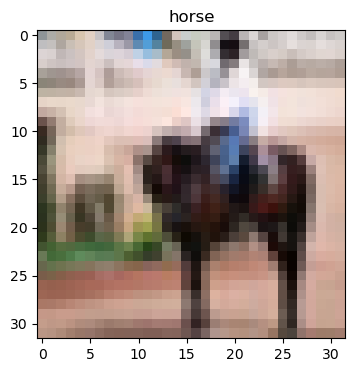

In [6]:
# Sample
n = 11
plt.figure(figsize=(4,4))
plt.imshow(Xtrain[n], cmap="gray")
plt.title(f"{classes[ytrain[n][0]]}")
plt.show()

Neste caso foi selecionao aleatóriamente uma amostra e obteve-se a imagem de um cavalo, com as dimensões de 32 por 32. 

#### Visualize the data

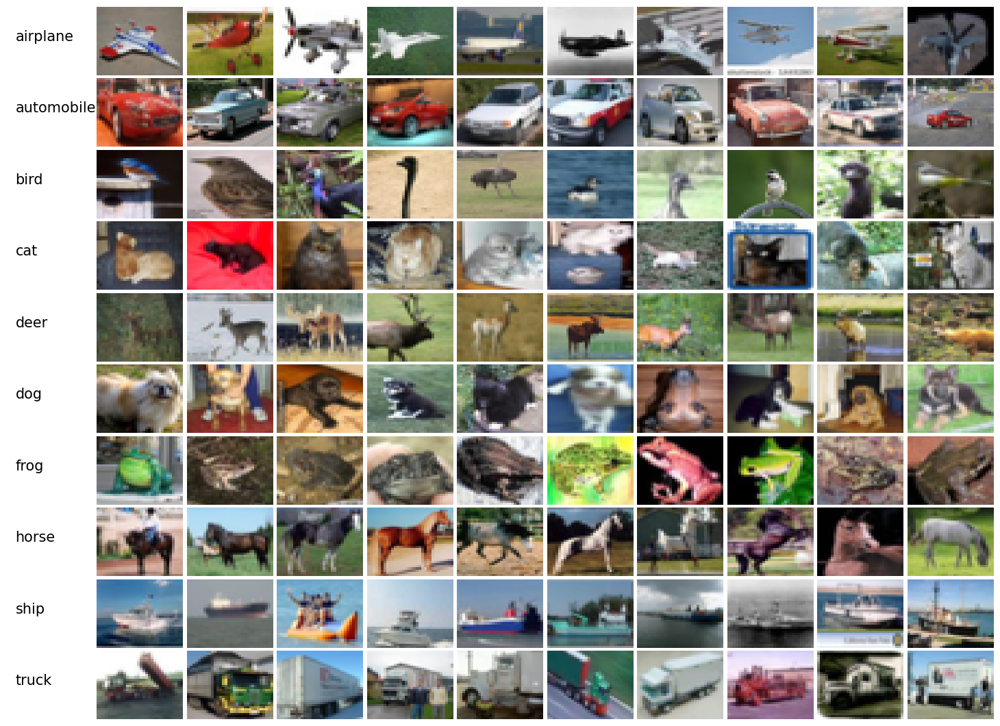

In [7]:
m = []
for i in range(0,11):
  numero = []
  n = 0
  for j in range(len(ytrain)):
    x = ytrain[j]
    if len(numero) == 11:
      break
    # print(x)
    if i == x:
      numero.append(j)

  m.append(numero)


fig, axes = plt.subplots(10,11, figsize=(18,13))
# fig.tight_layout()
fig.subplots_adjust(hspace=0.05, wspace=0.05, top=0.9, bottom=0.1, left=0.1, right=0.9)

for i in range(10):
  
  for j in range(11):
    index = m[i][j]
    img = Xtrain[index]      
    label = ytrain[index]   

    if j == 0:
      axes[i][j].annotate(f"{classes[label[0]]}", xy=(0.5, 0.5), xytext=(0.1, 0.5), color='black', fontsize=15)

      axes[i][j].axis('off')
    else:

      axes[i][j].imshow(img, aspect='auto')
      # axes[i][j].set_title(f"{classes[label[0]]}")
      axes[i][j].axis('off')
       

Acima, encontra-se um plot com 10 imagens por cada classe, selecionadas aleatóriamente, para visualizar um conjunto mais amplo de imagens.

#### Transform data into array from 1-col matrix
De seguida, tranformaram-se os dados num array com uma matriz de 1 coluna. Faz-se isto para quando o modelo for treinado os dados estejam de treino e de teste (array de 32x32x3, onde cada valor esta entre 0 e 255, que representa a intensidade de cor do pixel) estejam no formato correto.

In [8]:
# Passar de matriz para um lista
print(Xtrain.shape,  ytrain.shape, Xtest.shape,  ytest.shape)
ytrain = ytrain.squeeze()
ytest = ytest.squeeze()
print(Xtrain.shape,  ytrain.shape, Xtest.shape,  ytest.shape)

(50000, 32, 32, 3) (50000, 1) (10000, 32, 32, 3) (10000, 1)
(50000, 32, 32, 3) (50000,) (10000, 32, 32, 3) (10000,)


#### Randomize train data and sort test data

Baralha-se os dados de treino para que o modelo não aprenda uma tendência de ordem dos dados.
Ainda, os dados de teste são ordenados pois pode ser útil para garantir que os dados de teste estejam numa ordem que permita uma avaliação mais fácil e consistente do modelo.

In [9]:
idx = rnd.permutation(Xtrain.shape[0])
Xtrain = Xtrain[idx]
ytrain = ytrain[idx]

idx = np.argsort(ytest)
Xtest = Xtest[idx]
ytest = ytest[idx]

#### Convert images to grayscale

Estamos a converter as imagens em escala de cinzentos para melhorar o desempenho da classificação. Esperamos que o desempenho seja pior do que com imagens coloridas porque existem algumas imagens que seriam mais fáceis de classificar de acordo com a cor. Por exemplo, esperamos que o modelo identifique o azul à volta do navio ou do avião para melhor os disfarçar dos outros

In [10]:
XtrainG = np.zeros((Xtrain.shape[0], 32, 32))
for i in range(Xtrain.shape[0]):
    XtrainG[i] = color.rgb2gray(Xtrain[i])

XtestG = np.zeros((Xtest.shape[0], 32, 32))
for i in range(Xtest.shape[0]):
    XtestG[i] = color.rgb2gray(Xtest[i])


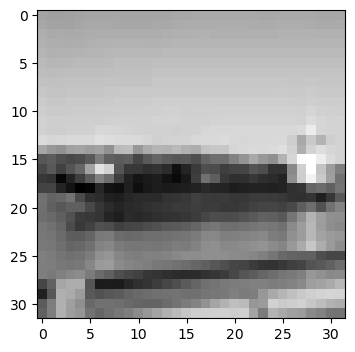

In [11]:
n = 11
plt.figure(figsize=(4,4))
plt.imshow(XtrainG[n], cmap="gray")
plt.show()

#### Convert images to vectors

Depois de convertidas as imagens para greyscale, é necessário converter para vetores. Esta necessidade surge pois só com os vetores é que os dados sejam processados por algoritmos de aprendizagem automática, que existem que as entradas sejam vetores numéricos. Ou seja, neste caso as imagens são basicamente matrizes de pixels, onde cada pixel é uma combinação de valores de cores. 

In [12]:
XtrainG = XtrainG.reshape((XtrainG.shape[0], XtrainG.shape[1] ** 2)) * 1.0
XtestG = XtestG.reshape((XtestG.shape[0], XtestG.shape[1] ** 2)) * 1.0

print(XtrainG.shape, ytrain.shape)
print(XtestG.shape, ytest.shape)

(50000, 1024) (50000,)
(10000, 1024) (10000,)


#### Different means and variances of each of the data dimensions

De seguida, calcula-se a média e a variância nos dados de treino a preto e branco.

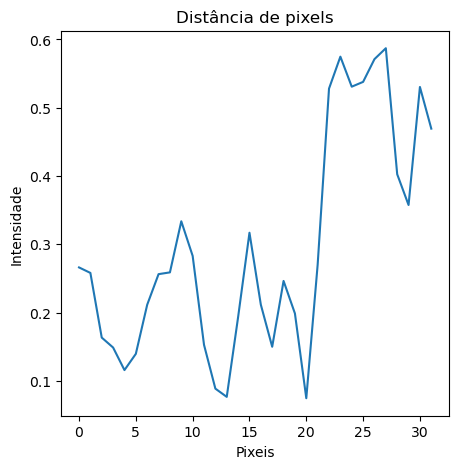

In [13]:
fig = plt.figure(figsize=(5,5))
plt.plot(XtrainG[0].reshape(32,32)[0])
plt.title("Distância de pixels")
plt.xlabel("Pixeis")
plt.ylabel("Intensidade")
plt.show()


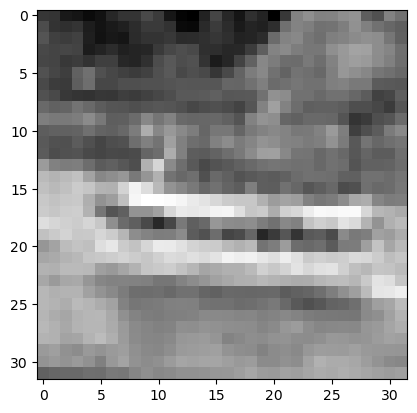

In [14]:
plt.imshow(XtrainG[0].reshape(32,32), cmap="gray")

Potencial problema: No seguintes graficos das medias e desvios padroes das imagens de treino e teste, é possível observar que as médias e desvios padrões são diferentes para cada dimensão dos dados. Isto pode ser um problema porque muitos algoritmos de aprendizagem automática assumem que os dados têm a mesma média e desvio padrão para cada dimensão. 

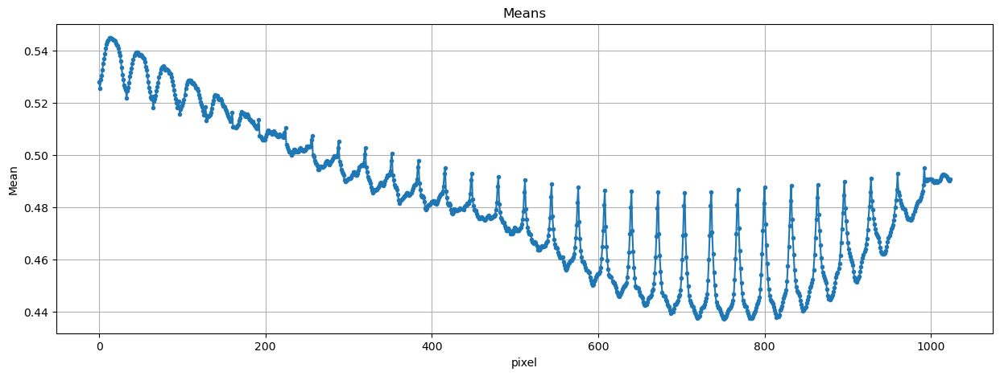

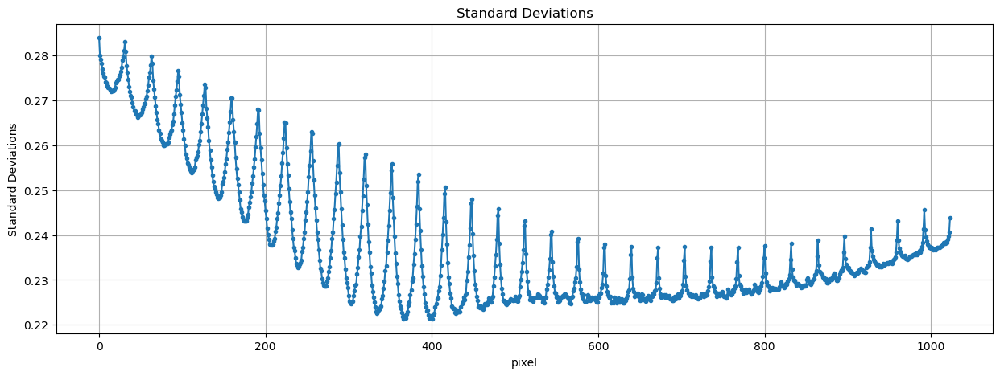

In [15]:
# potencial problema? 
m = np.mean(XtrainG, axis=0) # media de cada coluna
plt.figure(figsize=(15, 5))
plt.title("Means")
plt.plot(m, ".-", label="mean")
plt.xlabel("pixel")
plt.ylabel("Mean")
plt.grid(True)
plt.show()  

s = np.std(XtrainG, axis=0)
plt.figure(figsize=(15, 5))
plt.title("Standard Deviations")
plt.plot(s, ".-", label="std")
plt.grid(True)
plt.ylabel("Standard Deviations")
plt.xlabel("pixel")
plt.show()


#### Mudar os nomes

In [16]:
X1 = XtrainG
y1 = ytrain

X2 = XtestG
y2 = ytest

print("Prepared data: ", X1.shape, y1.shape, X2.shape, y2.shape)

Prepared data:  (50000, 1024) (50000,) (10000, 1024) (10000,)


# Binary classification problem

#### Transforming the data to a binary classification problem
Este passo envolve converter os dados deste problema originalmente multiclasse num problema de classificação com apenas duas classes. Para isso, foi necessário escolher duas classes do conjunto de dados original, e transformar os dados de modo a que o modelo apenas classifique entre essas duas classes.

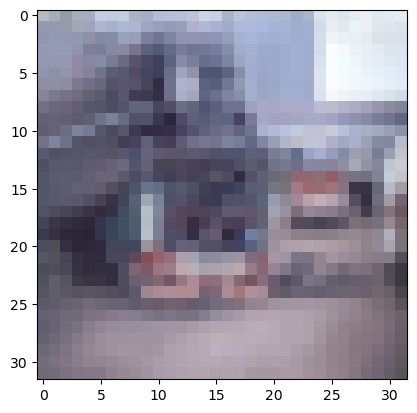

In [48]:
# Know where are the images of the airplane, automobile, ship and truck:
# airplane -0 , automobile- 1, ship-8 e truck-9
for i, num in enumerate(ytrain):
    if num == 9:

        plt.imshow(Xtrain[i])
        plt.show()
        break

Apos a transformacao do problema de multiclasse em classe binaria, obteve-se o seguinte grafico que demostra que entre os indexes 2000 e 7999 as imagens são classificadas como da classe 0, e as restantes como 1.

Binary data (shape):      (50000,) (10000,)
Binary data (values):  [0 1] [0 1]


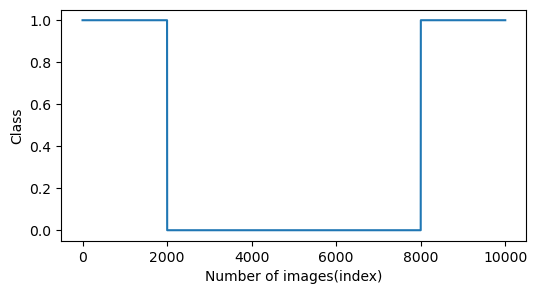

In [49]:
# lista de 1 e 0 , onde os 1´s estao nos indexs da classe 8

y1b = (y1==0) | (y1==1) |(y1==8) |(y1==9) *1
y2b = (y2==0) | (y2==1) |(y2==8) |(y2==9) *1
print("Binary data (shape):     ", y1b.shape, y2b.shape)
print("Binary data (values): ", np.unique(y1b), np.unique(y2b))

plt.figure(figsize=(6, 3))
plt.xlabel("Number of images(index)")
plt.ylabel("Class")
plt.plot(y2b)
plt.show()

Antes de comecar a treinar os modelos criou-se um dicinario com os nomes das classes, para que seja mais facil de interpretar os resultados.

In [50]:
# create a dictionary with the name of the classifier and metrics
classifier_metrics = {}

## 1. Binary classification

### Funcoes uteis

In [51]:
import numpy as np
import numpy.random as rnd
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, classification_report,roc_curve
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.metrics import roc_auc_score, precision_recall_curve
from sklearn.metrics import average_precision_score
import keras.datasets.cifar10 as cifar10
from skimage import color

from sklearn.model_selection import GridSearchCV, RandomizedSearchCV, cross_val_score, cross_val_predict, StratifiedKFold, KFold, train_test_split

from sklearn.svm import SVC
from sklearn.linear_model import SGDClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression

from sklearn.model_selection import train_test_split

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# Model Fine-Tuning and Testing Methodologies
def grid_Search(X, y, model, param_grid, cv, scoring='f1'):
    # Saber quais são os melhores parâmetros para o modelo

    grid_search = GridSearchCV(model, param_grid, cv=cv, scoring=scoring, n_jobs=10, verbose=1)
    grid_search.fit(X, y)
    print('Best parameters: ', grid_search.best_params_, 
          '\nBest score: ',grid_search.best_score_)
    
    # grafico entre os parâmetros e o score
    # plot_grid_search(grid_search.cv_results_, param_grid) 
    return grid_search.best_estimator_

# Model evaluation
def evaluate(y_test, y_pred):
    # evaluate the model with confusion matrix and other metrics

    cm= confusion_matrix(y_test, y_pred)
    (tp, fp), (fn, tn) = cm

    accuracy = (tp + tn) / (tp + tn + fp + fn)
    precision = tp / (tp + fp)
    recall = tp / (tp + fn)
    f1_score = 2 * precision * recall / (precision + recall)

    erros = fp + fn

    tn_rate = tn / (tn+fp)
    fp_rate = fp/(fp + tn)

    # print(" Matriz de Confusão: ")
    # print(cm)
    # print(f"Accuracy: {accuracy:.2f} | Precision: {precision:.2f} | Recall: {recall:.2f} | F1-Score: {f1_score:.2f} ")
    # print(f"Numero de Erros: {erros:.0f} | tn_rate: {tn_rate:.2f} | fp_rate: {fp_rate:.2f} ")
    
    return accuracy, precision, recall, f1_score, erros, tn_rate, fp_rate 

# Model Calibration

# 1. Find the best threshold for the highest F1 score
def highest_F1_score(y_test, y_pred):
    # Find the best threshold for the highest F1 score
    precision, recall, thresholds = precision_recall_curve(y_test, y_pred)
    f1_scores = 2 * (precision * recall) / (precision + recall)
    best_f1_score = np.max(f1_scores)
    best_threshold = thresholds[np.argmax(f1_scores)]
    print(f"Best F1 score: {best_f1_score:.2f} | Best threshold: {best_threshold:.2f}")
    return best_threshold

# 2. Find the best threshold for the lowest error
def lowest_error(y_test, y_pred):
    # Find the best threshold for the lowest error
    fpr, tpr, thresholds_roc = roc_curve(y_test, y_pred)

    erros = []
    for threshold in thresholds_roc:
        y_predt = (y_pred > threshold) * 1
        (tp, fp), (fn, tn) = confusion_matrix(y_test, y_predt)
        erros.append(fp + fn)
    
    best_error = np.min(erros)
    best_threshold = thresholds_roc[np.argmin(erros)]
    print(f"Best error: {best_error:.2f} | Best threshold: {best_threshold:.2f}")

    # retunr the best threshold and the errors
    return best_threshold, erros, thresholds_roc

# 3. Plot the best thresholds grafics
def find_best_thresholds(y_test, y_pred, best_threshold_f1, thresholds_roc, errors, best_threshold_le):
    # find_best_thresholds(y_test, y_pred, thresholds_roc, errors, best_threshold):
    """
    Plot two subplots: the first one shows the precision, recall, and F1 score as a function of threshold, and the second one
    shows the number of errors as a function of threshold.
    """

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
    # set fig title
    fig.suptitle("Find the best threshold", fontsize=14)
    # fig.subplots_adjust(top=0.85, wspace=0.2, hspace=0.3, bottom=0.2)

    ####################################### best_threshold_f1
    # create the first subplot
    precision, recall, thresholds = precision_recall_curve(y_test, y_pred)
    f1_scores = 2 * precision * recall / (precision + recall)

    ax1.plot(thresholds, precision[:-1], "b-", label="Precision")
    ax1.plot(thresholds, recall[:-1], "g-", label="Recall")
    ax1.plot(thresholds, f1_scores[:-1], "r-", label="F1 score")
    ax1.fill_between(thresholds, f1_scores[:-1], 0, alpha=0.2)
    ax1.axvline(best_threshold_f1, color="k", linestyle='-', label=f"Highest F1 score ({best_threshold_f1:.2f})")
    # colocar o ponto do threshold
    
    ax1.plot(best_threshold_f1, np.max(f1_scores), "mo")
    
    # ax1.plot(f1_scores[best_threshold_f1], best_threshold_f1, "ro")
    
    ax1.set_title("Find the best threshold with the highest F1 score", fontsize=8)
    ax1.set_xlabel("Threshold")
    ax1.set_ylabel("Score")
    ax1.set_xlim([0, 1])
    ax1.set_ylim([0, 1])
    ax1.legend(loc="best", fontsize=8)

    ########################################## best_threshold_le
    # create the second subplot
    ax2.plot(thresholds_roc, errors, "b-", label="Errors")
    ax2.axvline(best_threshold_le, color='r', linestyle='-', label=f"Lowest error ({best_threshold_le:.2f})")
    # colocar o ponto do threshold 
    ax2.plot(best_threshold_le, np.min(errors), "mo")

    ax2.fill_between(thresholds_roc, errors, 0, alpha=0.2)
    ax2.set_ylim([0, 6000])
    ax2.set_xlim([0, 2])
    ax2.set_xlabel("Threshold")
    ax2.set_ylabel("Number of errors")
    ax2.set_title("Find the best threshold with the lowest error", fontsize=8)
    ax2.legend(loc="best", fontsize=8)
    ax2.grid(True)
    

    plt.show()

def plot_confusion_matrixes(y_true, y_pred1, y_pred2, y_pred3, class_names, metodos):
    # Compute confusion matrices for each prediction
    cm1 = confusion_matrix(y_true, y_pred1)
    cm2 = confusion_matrix(y_true, y_pred2)
    cm3 = confusion_matrix(y_true, y_pred3)

    # Compute metrics for each matrix
    metrics = [evaluate(y_true, y_pred1), evaluate(y_true, y_pred2), evaluate(y_true, y_pred3)]
    
    # print(metrics)
    # Create figure with three subplots in one row
    fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(15, 5))
    fig.subplots_adjust(hspace=0.5, wspace=0.2, top=0.9, bottom=0.1)
    
    # Plot each confusion matrix in a subplot
    for i, cm in enumerate([cm1, cm2, cm3]):
        ax = axes[i]
        ax.matshow(cm, cmap='Blues')
        ax.set_xticks(np.arange(len(class_names)))
        ax.set_yticks(np.arange(len(class_names)))
        ax.set_xticklabels(class_names)
        ax.set_yticklabels(class_names)

        ax.set_title(f"{metodos[i]}", fontsize=16)
        # Add annotations (numbers and label) to the confusion matrix plot
        for j in range(len(class_names)):
            for k in range(len(class_names)):
                
                # add fp, fn, tp, tn
                # (tp, fp), (fn, tn) = cm
                # (0,0) (0,1) (1,0) (1,1)
                if j == 1 and k == 1:
                    text = f"True Negatives \n{cm[j, k]}"
                if j == 1 and k == 0:
                    text = f"False Positives \n{cm[j, k]}"
                if j == 0 and k == 1:
                    text = f"False Negatives \n{cm[j, k]}"
                if j == 0 and k == 0:
                    text = f"True Positives \n{cm[j, k]}"
                     
                ax.text(k, j, text, ha="center", va="center", 
                        color="black", 
                        fontsize=14)

        # Add metrics to the plot
        # Set xticklabels alignment
        plt.setp(ax.get_xticklabels(), ha="right")

    # plt.tight_layout()
    plt.show()

    # Metrics as a Pandas DataFrame
    metrics_df = pd.DataFrame(metrics, columns=['Accuracy', 'Precision', 'Recall', 
                                                'F1-Score', 'Errors', 'TN Rate', 
                                                'FP Rate'], index=metodos)
    metrics_df = metrics_df.round(2)

    return metrics_df

def plot_metrics_table(metrics_df):
    # Create a table from the dataframe
    print(metrics_df.to_markdown())

    # # cria a figura e o eixo
    # fig, ax = plt.subplots(figsize=(8, 3))

    # # esconde o eixo
    # ax.axis('off')

    # # cria a tabela
    # table = ax.table(cellText=metrics_df.values, 
    #                 colLabels=metrics_df.columns, 
    #                 rowLabels=metrics_df.index, 
    #                 loc='center', bbox=[0,-0.5,1,0.4])

    # # ajusta a fonte da tabela
    # table.auto_set_font_size(False)
    # table.set_fontsize(12)

    # # ajusta o tamanho das colunas
    # table.auto_set_column_width(col=list(range(len(metrics_df.columns))))

    # # mostra a figura
    # plt.tight_layout()
    # plt.show()
    
    return metrics_df

def plot_preditions(y_predProb_rnd, y2b, th):
    
    # Calcula a matriz de confusão
    y_pred = (y_predProb_rnd > th).astype(int)

    # Obtém os índices dos verdadeiros positivos, falsos positivos, verdadeiros negativos e falsos negativos
    tp_idx = np.where((y_pred == 1) & (y2b == 1))[0]
    fp_idx = np.where((y_pred == 1) & (y2b == 0))[0]
    tn_idx = np.where((y_pred == 0) & (y2b == 0))[0]
    fn_idx = np.where((y_pred == 0) & (y2b == 1))[0]


    plt.figure(figsize=(15, 5))
    plt.title("Positives and Negatives")
    plt.plot(tp_idx, y_predProb_rnd[tp_idx], "g.", label=f'True Positives ({len(tp_idx)})', markeredgecolor='white', linewidth=0.5)
    plt.plot(fp_idx, y_predProb_rnd[fp_idx], "r.", label=f'False Positives ({len(fp_idx)})', markeredgecolor='black', linewidth=1)
    plt.plot(tn_idx, y_predProb_rnd[tn_idx], "b.", label=f'True Negatives ({len(tn_idx)})', markeredgecolor='white', linewidth=0.5)
    plt.plot(fn_idx, y_predProb_rnd[fn_idx], "y.", label=f'False Negatives ({len(fn_idx)})', markeredgecolor='black', linewidth=1)
    plt.axhline(th, color='b', linestyle='-', label=f'Threshold ({th:.2f})')
    plt.grid(True)
    plt.xlim(0, len(y_predProb_rnd))
    plt.ylim(0, 1.1)
    plt.xlabel('Index')
    plt.ylabel('Probability')
    plt.legend(loc='upper center', bbox_to_anchor=(0.5, 1), ncol=5, fontsize=10)
    plt.show()

# Curva ROC e precisão-recall e Guardar os valores de threshold
def plot_cm_roc_pr(y_test, y_score, th, NameClassifier=''):
  # Calcular a curva ROC
  fpr, tpr, thresholds_roc = roc_curve(y_test, y_score)
  roc_auc = roc_auc_score(y_test, y_score)

  # Calcular a curva Precision-Recall
  precisions, recalls, thresholds_pr = precision_recall_curve(y_test, y_score)
  average_precision = average_precision_score(y_test, y_score)

  fig, (roc, prc) = plt.subplots(1, 2, figsize=(12, 6))

  for t in th.items():
    t, name = t[1], t[0]
    y_pred = (y_score > t) * 1

    cm = confusion_matrix(y_test, y_pred)
    # print('Confusion matrix do limite {:.2f} \n {}'.format(t, cm))

    fp_rate =   cm[0,1] / (cm[0,1] + cm[0,0])
    recall =    cm[1,1] / (cm[1,1] + cm[1,0])
    precision = cm[1,1] / (cm[1,1] + cm[0,1])

    # plotar os pontos na curva ROC e Precision-Recall e as coordenadas
    roc.plot(fp_rate,  recall,  "o", label=f"{NameClassifier} {name}({fp_rate:.2f}, {recall:.2f})")
    prc.plot(precision, recall, "o", label=f"{NameClassifier} {name}({precision:.2f}, {recall:.2f})")


  # Subplot para a curva ROC
  roc.set(title=f"ROC curve (AUC ={roc_auc:.2f})",
          xlabel="FP-rate",
          ylabel="TP-rate",
          xlim=(0, 1),
          ylim=(0, 1))
  
  roc.plot(fpr, tpr, color="tab:blue")

  # plot the no skill line
  roc.plot([0, 1], [0, 1], color='black', linestyle='--')
  
  roc.fill_between(fpr, tpr, 0, alpha=0.2)
  roc.grid(True)
  roc.legend(loc="lower right", fontsize=6)

  # Subplot para a curva PR
  prc.set(title=f"Precision Recall Curve (AP={average_precision:.2f})",
          xlabel='Precision',
          ylabel='Recall',
          xlim=(0, 1),
          ylim=(0, 1))
  
  prc.plot(precisions, recalls, color="tab:blue")
  # plot the no skill line
  prc.plot([0, 1], [0.5, 0.5], color='black', linestyle='--')
  prc.fill_between(precisions, recalls, 0, alpha=0.2)

  prc.legend(loc="lower left", fontsize=6)
  prc.grid(True)

  fig.suptitle('ROC curve and Precision Recall Curve')

  plt.show()

  # return the values of the metrics and thresholds
  return {'fpr': fpr, 'tpr': tpr, 'thresholds_roc': thresholds_roc,
          'precisions': precisions, 'recalls': recalls, 'thresholds_pr': thresholds_pr,
          'roc_auc': roc_auc, 'average_precision': average_precision, 'thresholds': th,
          'y_score': y_score, 'y_pred': y_pred}
   

# Model interpretation and visualization of the results (classification)
def show_classification_results(y_test, y_pred, test_images, threshold, name=''):
    # Visualizar as imagens com as predições e as labels (com threshold)
    classes=['Animal', 'Objeto' ]
  
    y_pred = (y_pred > threshold) * 1

    tp = test_images[(y_pred == 1) & (y_test == 1)]
    fp = test_images[(y_pred == 1) & (y_test == 0)]
    tn = test_images[(y_pred == 0) & (y_test == 0)]
    fn = test_images[(y_pred == 0) & (y_test == 1)]
    
    tp_labels = y_test[(y_pred == 1) & (y_test == 1)]
    fp_labels = y_test[(y_pred == 1) & (y_test == 0)]
    tn_labels = y_test[(y_pred == 0) & (y_test == 0)]
    fn_labels = y_test[(y_pred == 0) & (y_test == 1)]

    fig, axs = plt.subplots(4, 10, figsize=(17, 12))
    fig.subplots_adjust(hspace=0.05, wspace=0.05, top=0.95, bottom=0.2, left=0.1, right=0.9)
    fig.suptitle('Error Analysis (Predictions vs. Actuals)', fontsize=20)
   
    axs[0, 0].set_title('True positives {}'.format(len(tp)), fontsize=14)
    axs[1, 0].set_title('False positives {}'.format(len(fp)), fontsize=14)
    axs[2, 0].set_title('True negatives {}'.format(len(tn)), fontsize=14)
    axs[3, 0].set_title('False negatives {}'.format(len(fn)), fontsize=14)

    for i in range(10):
        axs[0, i].imshow(tp[i].reshape((32, 32)), cmap='gray')
        axs[1, i].imshow(fp[i].reshape((32, 32)), cmap='gray')
        axs[2, i].imshow(tn[i].reshape((32, 32)), cmap='gray')
        axs[3, i].imshow(fn[i].reshape((32, 32)), cmap='gray')
        
        # Add labels to each image
        axs[0, i].set_xlabel('Predicted: {}\nActual: {}'.format(classes[1], classes[tp_labels[i]]), fontsize=10)
        axs[1, i].set_xlabel('Predicted: {}\nActual: {}'.format(classes[1], classes[fp_labels[i]]), fontsize=10)
        axs[2, i].set_xlabel('Predicted: {}\nActual: {}'.format(classes[1], classes[tn_labels[i]]), fontsize=10)
        axs[3, i].set_xlabel('Predicted: {}\nActual: {}'.format(classes[1], classes[fn_labels[i]]), fontsize=10)

    for ax in axs.flat:
        ax.set_xticks([])
        ax.set_yticks([])

    plt.show()

# Model Comparison
def plot_roc_pr_from_dict(metrics_dict, y_test, points=True):
    """
    Plots ROC and Precision-Recall curves for each classifier in a metrics dictionary.
    
    Parameters:
    metrics_dict (dict): a dictionary containing the metrics for each classifier. The keys
        are the classifier names and the values are dictionaries with the following keys:
        - 'fpr': an array with the false positive rates.
        - 'tpr': an array with the true positive rates.
        - 'thresholds_roc': an array with the thresholds used to compute the ROC curve.
        - 'precisions': an array with the precisions.
        - 'recalls': an array with the recalls.
        - 'thresholds_pr': an array with the thresholds used to compute the Precision-Recall curve.
        - 'roc_auc': the area under the ROC curve.
        - 'average_precision': the area under the Precision-Recall curve.
        - 'thresholds': a dictionary with the thresholds used to compute the metrics.
        - 'y_pred': an array with the predicted labels.
        - 'y_score': an array with the predicted scores.
    
    Returns:
    None.
    """

    fig, (roc, prc) = plt.subplots(1, 2, figsize=(12, 6))
    # print(metrics_dict['Knn']['thresholds'])

    # create a list with the names and AUCs of the classifiers
    classifier_aucs = []
    for name, metrics in metrics_dict.items():
        classifier_aucs.append((name, metrics['roc_auc']))

    for name, metrics in metrics_dict.items():
        roc.plot(metrics['fpr'], metrics['tpr'], label=f"{name} (AUC = {metrics['roc_auc']:.2f})")
        prc.plot(metrics['precisions'], metrics['recalls'], label=f"{name} (AP = {metrics['average_precision']:.2f})")

        # add the thresholds to the plot
        for t in metrics['thresholds'].items():
            t, metodo = t[1], t[0]
            y_score = metrics['y_score']
            
            y_pred = (y_score > t) * 1

            cm = confusion_matrix(y_test, y_pred)
            print(f'Confusion matrix do classificador {metodo} no limite {t:.2f}: \n {cm}')

            fp_rate =   cm[0,1] / (cm[0,1] + cm[0,0])
            recall =    cm[1,1] / (cm[1,1] + cm[1,0])
            precision = cm[1,1] / (cm[1,1] + cm[0,1])

            if points:
                # plotar os pontos na curva ROC e Precision-Recall e as coordenadas
                roc.plot(fp_rate,  recall,  "o", label=f"{name} {metodo}({fp_rate:.2f}, {recall:.2f})")
                prc.plot(precision, recall, "o", label=f"{name} {metodo}({precision:.2f}, {recall:.2f})")

    roc.set(title="ROC curve",
            xlabel="FP-rate",
            ylabel="TP-rate",
            xlim=(0, 1),
            ylim=(0, 1))
    
    roc.plot([0, 1], [0, 1], color='black', linestyle='--')
    roc.grid(True)
    roc.legend(loc='best', fontsize=6)

    prc.set(title="Precision Recall Curve",
            xlabel='Precision',
            ylabel='Recall',
            xlim=(0, 1),
            ylim=(0, 1))
    
    prc.plot([0, 1], [0.5, 0.5], color='black', linestyle='--')
    prc.legend(loc='best', fontsize=6)
    prc.grid(True)

    fig.suptitle('ROC curve and Precision Recall Curve')

    plt.show()

def print_summary(classifier_metrics, cols=[]):
    if len(cols) == 0:
        df = pd.DataFrame(classifier_metrics).T
        print(df.to_markdown())
    # print(pd.DataFrame(classifier_metrics[cols]).T.to_markdown())
    df = pd.DataFrame(classifier_metrics).T
    print(df[cols].to_markdown())

def normalize(X_train, X_test):
    scaler = StandardScaler().fit(X_train)
    X_train = scaler.transform(X_train)
    X_test = scaler.transform(X_test)
    return X_train, X_test

def principal_component_analysis(X_train, X_test, n_components=0.99, whiten=True):
    pca = PCA(n_components=n_components, whiten=whiten)
    pca.fit(X_train)
    X_train = pca.transform(X_train)
    X_test = pca.transform(X_test)
    return X_train, X_test


def model_process(model, par, X1, y1b, X2, y2b, cv=2, scoring='f1', name='Model', pca=False):
    print("Model Fine-Tuning and Testing Methodologies")
    if par['grid_search']:
        del par["grid_search"]
        # print(f'Grid Search for {name}')
        # best_estimator = grid_Search(X1, y1b, model, par, cv=cv, scoring=scoring)
        # model  = best_estimator.fit(X1, y1b) # run with best parameters
    
    print(f'Parameters for {name}: {model.get_params()}')


    print("\n3. Model Calibration")
    th_default = 0.5

    #  3.1 Find the best threshold
    #  3.1.1 With the highest F1 score
    y_predProb_rnd = model.predict_proba(X2)[:, 1]
    th_rf_f1 = highest_F1_score(y2b, y_predProb_rnd)

    #  3.1.2 With the lowest error
    th_rf_le, erros, thresholds_roc = lowest_error(y2b, y_predProb_rnd)

    # 3.1.3 Plot the best thresholds
    find_best_thresholds(y2b, y_predProb_rnd, th_rf_f1, thresholds_roc, erros, th_rf_le)

    # 3.2 Plot ROC and precisão-recall curve (Save the best threshold)
    metrics = {}
    th = {"Default threhold": th_default, "Threhold highest F1 ": th_rf_f1, "Threhold lowest error": th_rf_le}
    metrics[name]=plot_cm_roc_pr(y2b, y_predProb_rnd, th, name)

    print("\n4. Model Evaluation metrics with best thresholds")
    # default threshold
    y_pred_default = (y_predProb_rnd > th_default ) * 1
    # print(f"\n4.1 Default threshold evaluation: {0.5:0.2f}")

    # highest F1 score
    y_pred_highest_F1_score = (y_predProb_rnd > th_rf_f1 ) * 1
    # print(f"\n4.2 Highest F1 score evaluation: {th_rf_f1:0.2f}")

    # lowest error
    y_pred_lowest_error = (y_predProb_rnd > th_rf_le ) * 1
    # print(f"\n4.3 Lowest error evaluation: {th_rf_le:0.2f}")

    classes=['Animal', 'Objeto' ]
    metodos=[f'Default({th_default:.2f})', 
             f'Highest F1({th_rf_f1:.2f})', 
             f'Lower Error({th_rf_le:.2f})']
             
    metric = plot_confusion_matrixes(y2b, y_pred_default, y_pred_highest_F1_score, 
                        y_pred_lowest_error, classes,
                        metodos)
    print("Classification_report:")
    print(classification_report(y2b, model.predict(X2)) )
    plot_metrics_table(metric)
    print("type(metric)=", type(metric))
    metrics[name].update(metric)

    th = th_rf_f1 # threshold escolhido para a analise de erros

    print("Escolha do melhor threshold:", th)
    
    plot_preditions(y_predProb_rnd, y2b, th)


    # Visualizar as imagens com as predições e as labels (com threshold)
    if pca == False:
        print("\n5. Model Interpretation and Visualization (Predictions vs. Actuals) ")
        print("5.1 Error Analysis (Predictions vs. Actuals)")
        show_classification_results(y2b, y_predProb_rnd, X2, threshold=th_rf_f1, name=name)

    
    # returnar os parameters do modelo escolhido para fazer a comparacao entre os modelos
    return metrics[name] 

### 1.1 Random Forest Classifier

Model Fine-Tuning and Testing Methodologies
Parameters for RandomForest: {'bootstrap': True, 'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'gini', 'max_depth': 45, 'max_features': 'auto', 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 350, 'n_jobs': 3, 'oob_score': False, 'random_state': 42, 'verbose': 0, 'warm_start': False}

3. Model Calibration
Best F1 score: 0.76 | Best threshold: 0.42
Best error: 1912.00 | Best threshold: 0.47


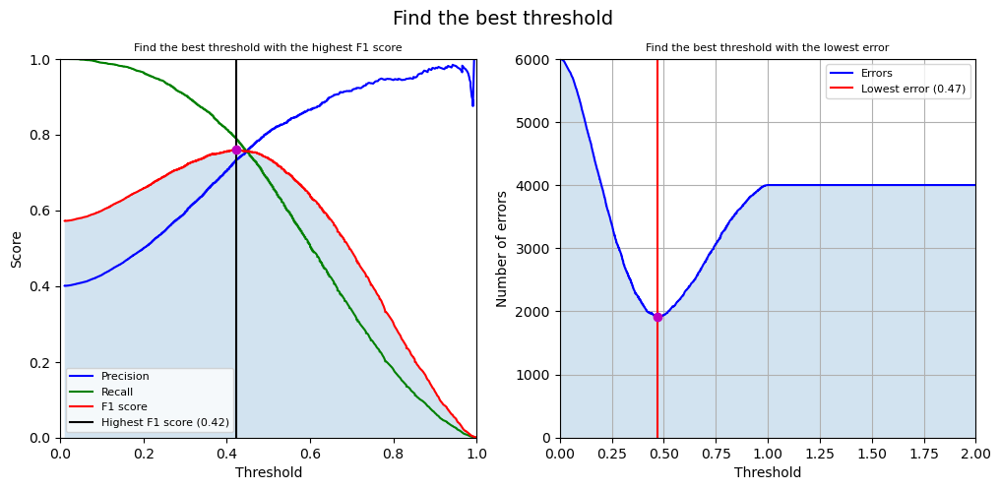

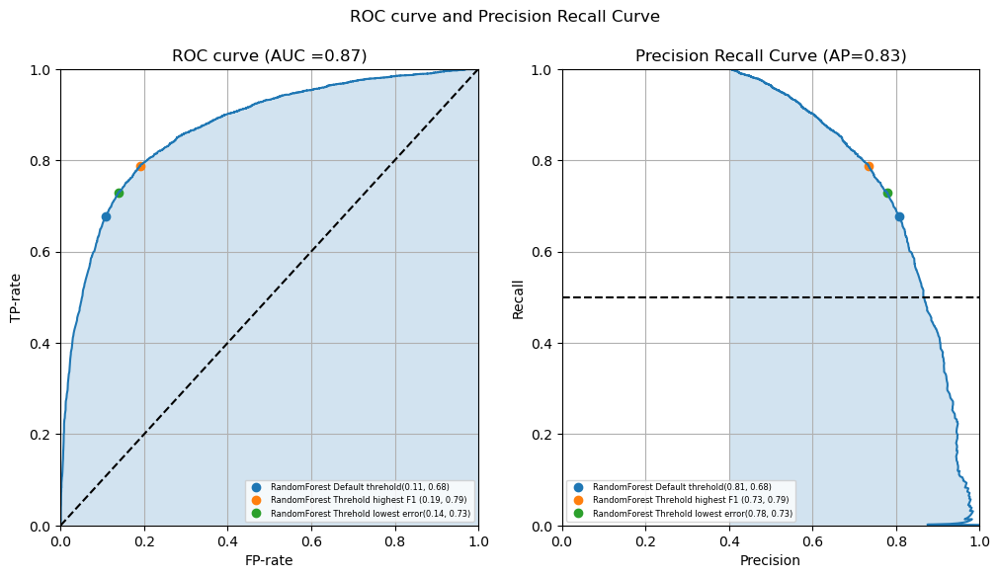


4. Model Evaluation metrics with best thresholds


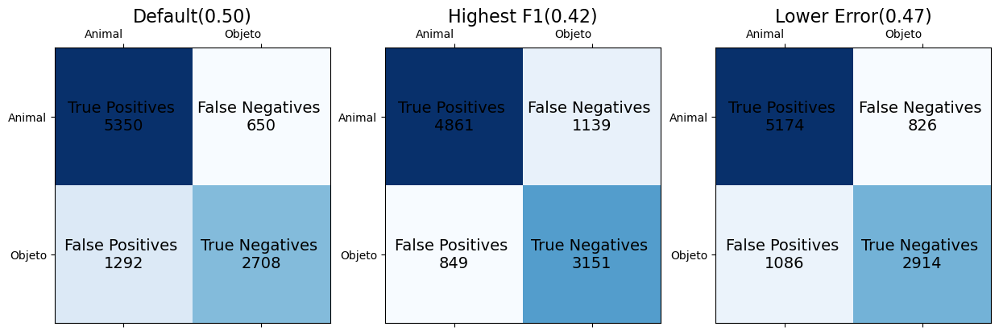

Classification_report:
              precision    recall  f1-score   support

           0       0.81      0.89      0.85      6000
           1       0.81      0.68      0.74      4000

    accuracy                           0.81     10000
   macro avg       0.81      0.78      0.79     10000
weighted avg       0.81      0.81      0.80     10000

|                   |   Accuracy |   Precision |   Recall |   F1-Score |   Errors |   TN Rate |   FP Rate |
|:------------------|-----------:|------------:|---------:|-----------:|---------:|----------:|----------:|
| Default(0.50)     |       0.81 |        0.89 |     0.81 |       0.85 |     1942 |      0.81 |      0.19 |
| Highest F1(0.42)  |       0.8  |        0.81 |     0.85 |       0.83 |     1988 |      0.73 |      0.27 |
| Lower Error(0.47) |       0.81 |        0.86 |     0.83 |       0.84 |     1912 |      0.78 |      0.22 |
type(metric)= <class 'pandas.core.frame.DataFrame'>
Escolha do melhor threshold: 0.4229985591619775


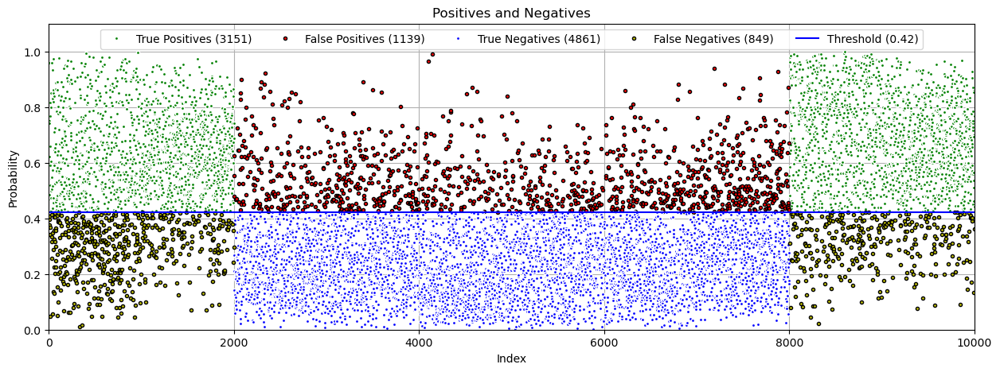


5. Model Interpretation and Visualization (Predictions vs. Actuals) 
5.1 Error Analysis (Predictions vs. Actuals)


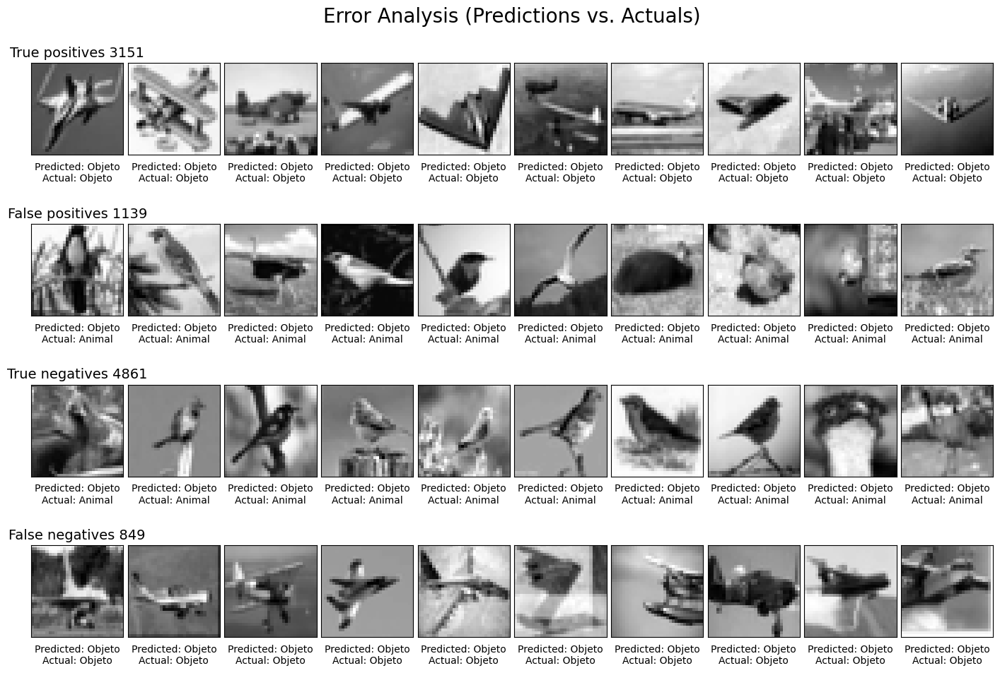

In [52]:
rf = RandomForestClassifier(n_estimators= 350, 
                            max_depth= 45,
                            random_state=42, 
                            n_jobs=N_JOBS).fit(X1, y1b) # run with default parameters
parameters = {
    'grid_search': False,
    'n_estimators': np.array([250, 350, 400, 450]),
    'max_depth': np.array([25, 35, 40, 45])
}

# Processo de treino, calibração, avaliação do modelo e interpretação dos resultados
name='RandomForest'
classifier_metrics[name] = model_process(rf, parameters, X1, y1b, X2, y2b, 
                                         cv=2, scoring='f1', name=name)

##### Análise
Para iniciar, comecou-se por se obter o melhor threshold, tanto através do maior valor de F1 score e do menor erro. O que se obteve foi, o melhor valor de F1 score foi de 0.76, onde o threshold neste ponto é de 0.44, indicando que esse valor de threshold levou a um equilíbrio entre a precisão e o recall do modelo, resultando em uma boa performance geral. Por outro lado, no menor erro de 1912, obteve-se o threshold de 0.47, o que indica que esse valor de threshold levou a um menor número de classificações erradas em relação aos dados de teste. VER SE DEVEMOS COLOCAR A FRASE SEGUINTE: Em suma, a escolha do threshold depende da importância relativa da precisão e do recall para o problema em questão. Se o objetivo é minimizar o número de erros, um threshold mais alto (como 0.47) pode ser a melhor escolha. Se o objetivo é alcançar um equilíbrio entre a precisão e o recall, um threshold mais baixo (como 0.44) pode ser mais adequado.

----------------------------------------------------------------

De seguida, deve-se analisar a tabela do ponto "Classification_report" acima. Esta tabela apresenta os resultados de diferentes configurações de um modelo de classificação binária num conjunto de dados. O modelo foi avaliado em termos de precisão (Accuracy), precisão de classificação positiva (Precision), taxa de verdadeiros positivos (Recall), F1-score (F1-Score), número de erros, taxa de verdadeiros negativos (TN rate) e taxa de falsos positivos (FP rate).
O resultado da avaliação foi obtido para três diferentes thresholds: o valor padrão de 0,5 e os melhores valores de threshold para maximizar o F1-score (0.44) e minimizar o número de erros (0.47), como dito anteriormente.

Os resultados indicam que a precisão geral do modelo é boa, com valores de precisão e recall em torno de 0.8. O modelo teve um desempenho um pouco melhor com o valor de threshold de 0.44, que maximizou o valor de F1-score em 0,84. Além disso, esse valor de threshold também resultou em um número menor de erros, 1943. No entanto, o valor de threshold de 0,47 apresentou a melhor precisão de classificação positiva, com valor de 0.86. Também, as taxas de falsos positivos e verdadeiros negativos também são fatores importantes a serem considerados. Se o objetivo for minimizar o número de falsos positivos, o modelo "Lower Error" pode ser uma boa escolha, pois obteve a menor taxa de falsos positivos na tabela. Por outro lado, se o objetivo for maximizar o número de verdadeiros positivos, o modelo "Highest F1" pode ser mais apropriado, já que apresentou a maior taxa de recall.

----------------------------------------------------------------

Por fim, temos um gráfico que mostra 10 exemplo de imagens para cada avaliação. Ou seja, 10 imagens que foram corretamente classificadas como objetos, 10 imagens que foram classificadas como objetos mas deveriam ser animais, 10 imagens que foram classificadas como animais mas deveriam ser objetos, e por fim 10 imagens que foram corretamente classificadas como animais.

### 1.2 KNN Classifier

Model Fine-Tuning and Testing Methodologies
Parameters for knn: {'algorithm': 'auto', 'leaf_size': 30, 'metric': 'minkowski', 'metric_params': None, 'n_jobs': 3, 'n_neighbors': 12, 'p': 2, 'weights': 'uniform'}

3. Model Calibration
Best F1 score: 0.69 | Best threshold: 0.42
Best error: 2476.00 | Best threshold: 0.50


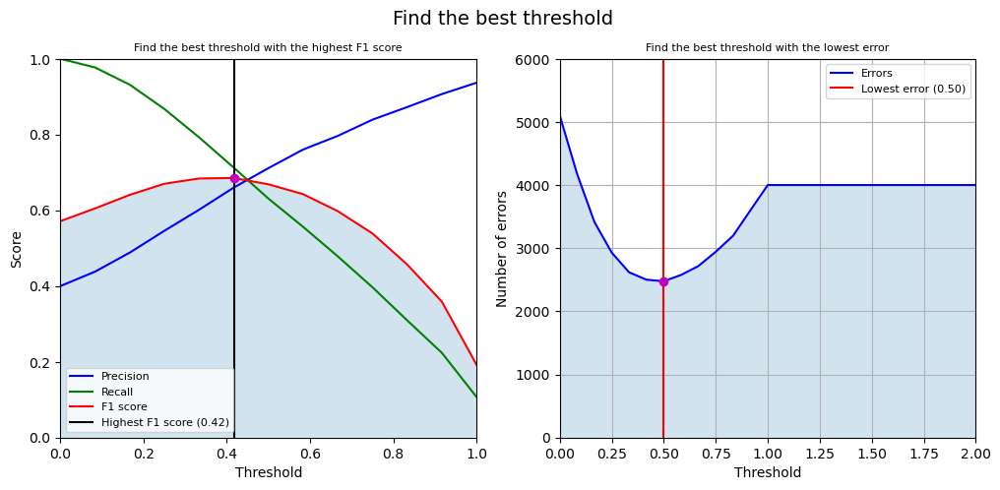

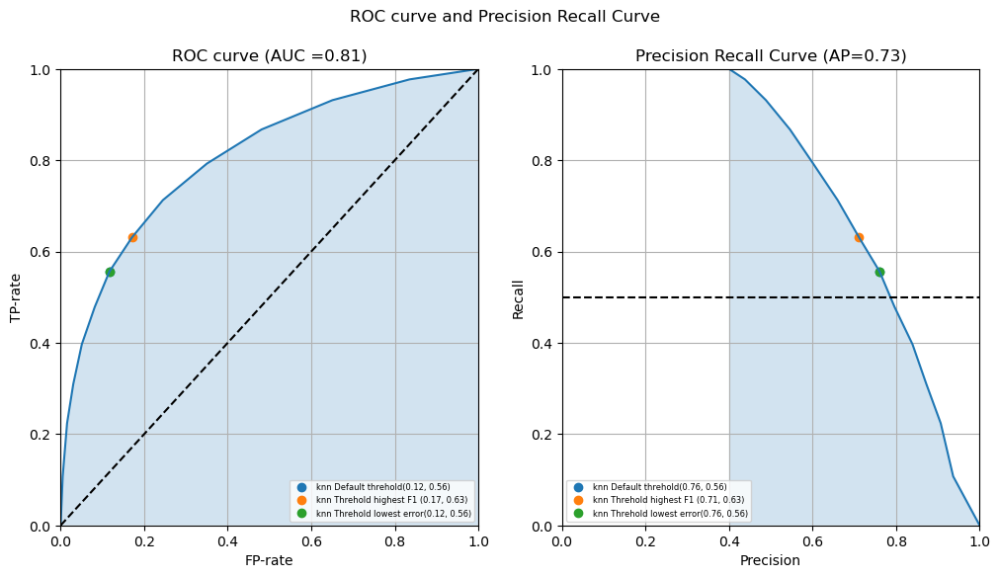


4. Model Evaluation metrics with best thresholds


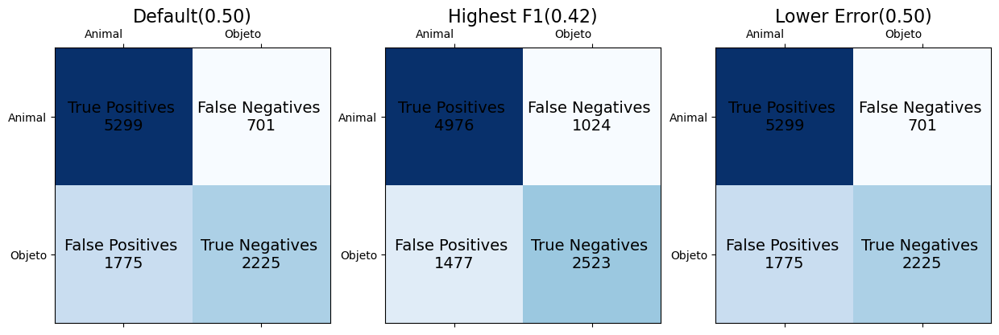

Classification_report:


c:\Users\ruben\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)


              precision    recall  f1-score   support

           0       0.75      0.88      0.81      6000
           1       0.76      0.56      0.64      4000

    accuracy                           0.75     10000
   macro avg       0.75      0.72      0.73     10000
weighted avg       0.75      0.75      0.74     10000

|                   |   Accuracy |   Precision |   Recall |   F1-Score |   Errors |   TN Rate |   FP Rate |
|:------------------|-----------:|------------:|---------:|-----------:|---------:|----------:|----------:|
| Default(0.50)     |       0.75 |        0.88 |     0.75 |       0.81 |     2476 |      0.76 |      0.24 |
| Highest F1(0.42)  |       0.75 |        0.83 |     0.77 |       0.8  |     2501 |      0.71 |      0.29 |
| Lower Error(0.50) |       0.75 |        0.88 |     0.75 |       0.81 |     2476 |      0.76 |      0.24 |
type(metric)= <class 'pandas.core.frame.DataFrame'>
Escolha do melhor threshold: 0.4166666666666667


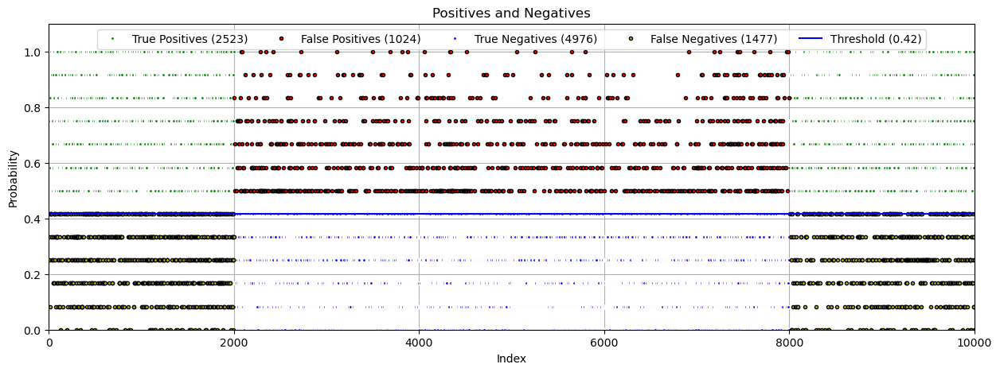


5. Model Interpretation and Visualization (Predictions vs. Actuals) 
5.1 Error Analysis (Predictions vs. Actuals)


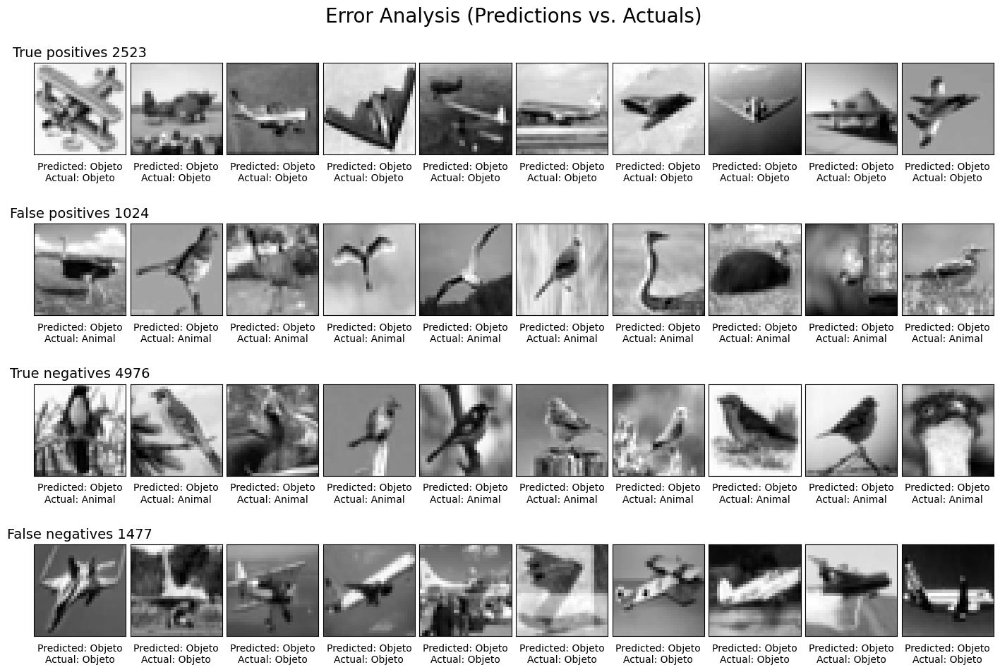

In [53]:
knn = KNeighborsClassifier(n_neighbors=12, n_jobs=N_JOBS).fit(X1, y1b)
parameters={
    'grid_search': False,
    'n_neighbors' : np.array([12, 14, 16]),
}

# Processo de treino, calibração, avaliação do modelo e interpretação dos resultados
name='knn'
classifier_metrics[name] = model_process(knn, parameters, X1, y1b, X2, y2b, cv=2, scoring='f1', name=name)

Tal como no ponto anterior, comecou-se por se obter o melhor threshold, tanto através do maior valor de F1 score e do menor erro. Aqui, obteve-se o melhor valor de F1 score foi de 0.76, onde o threshold neste ponto é de 0.44. Por outro lado, no menor erro de 1912, obteve-se o threshold de 0.47.

----------------------------------------------------------------

O modelo padrão com threshold de 0.5 tem uma accuracy de 0.75, precisão de 0.88, recall de 0.75 e um F1-Score de 0.81. O modelo com o maior valor de F1-Score tem um threshold de 0.42, com acurácia de 0.75, precisão de 0.83, recall de 0.77 e F1-Score de 0.8. Finalmente, o modelo com o menor erro tem um threshold de 0.5 e os mesmos valores de acurácia, precisão, recall e F1-Score que o modelo padrão.

Em geral, todos os modelos apresentam resultados semelhantes, com desempenho na faixa de 0,75-0,81 no F1-Score e na faixa de 0,75-0,88 na precisão. No entanto, o modelo com o maior valor de F1-Score apresenta um recall um pouco melhor do que o modelo padrão, embora com uma precisão ligeiramente inferior. Portanto,pode-se escolher um threshold que maximize o recall ou a precisão. O modelo com menor erro tem o mesmo desempenho que o modelo padrão e, portanto, poderia ser uma boa escolha para cenários em que minimizar os erros é importante.

### MLPClassifier

Model Fine-Tuning and Testing Methodologies
Parameters for MLPClassifier: {'activation': 'relu', 'alpha': 0.0001, 'batch_size': 'auto', 'beta_1': 0.9, 'beta_2': 0.999, 'early_stopping': False, 'epsilon': 1e-08, 'hidden_layer_sizes': (100, 100, 100), 'learning_rate': 'constant', 'learning_rate_init': 0.001, 'max_fun': 15000, 'max_iter': 100, 'momentum': 0.9, 'n_iter_no_change': 10, 'nesterovs_momentum': True, 'power_t': 0.5, 'random_state': 42, 'shuffle': True, 'solver': 'adam', 'tol': 0.0001, 'validation_fraction': 0.1, 'verbose': True, 'warm_start': False}

3. Model Calibration
Best F1 score: 0.75 | Best threshold: 0.30
Best error: 1957.00 | Best threshold: 0.59


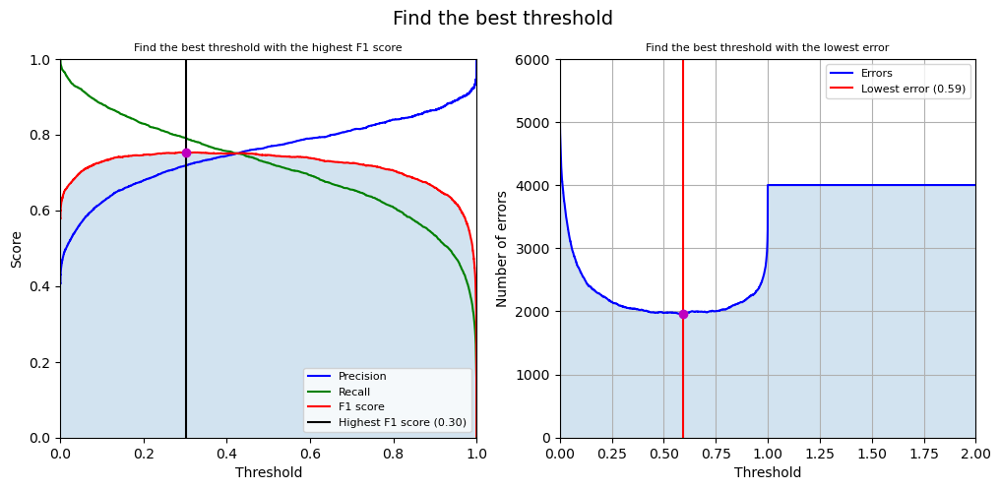

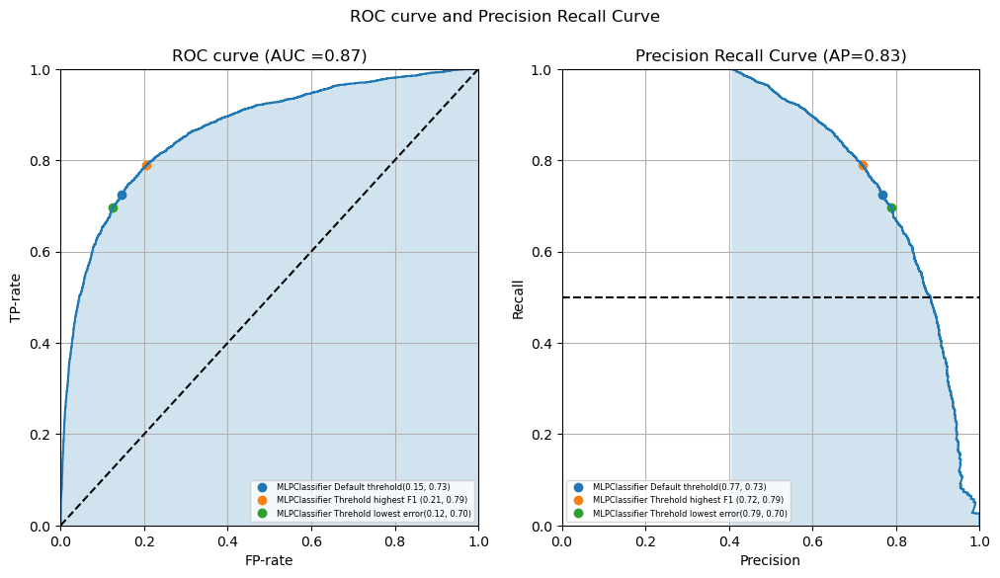


4. Model Evaluation metrics with best thresholds


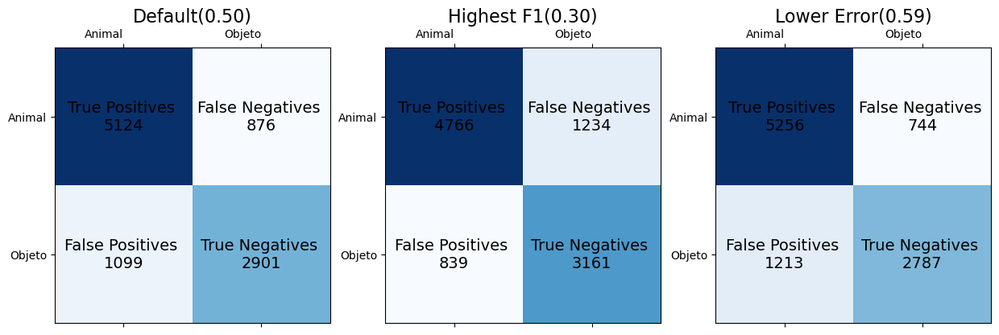

Classification_report:
              precision    recall  f1-score   support

           0       0.82      0.85      0.84      6000
           1       0.77      0.73      0.75      4000

    accuracy                           0.80     10000
   macro avg       0.80      0.79      0.79     10000
weighted avg       0.80      0.80      0.80     10000

|                   |   Accuracy |   Precision |   Recall |   F1-Score |   Errors |   TN Rate |   FP Rate |
|:------------------|-----------:|------------:|---------:|-----------:|---------:|----------:|----------:|
| Default(0.50)     |       0.8  |        0.85 |     0.82 |       0.84 |     1975 |      0.77 |      0.23 |
| Highest F1(0.30)  |       0.79 |        0.79 |     0.85 |       0.82 |     2073 |      0.72 |      0.28 |
| Lower Error(0.59) |       0.8  |        0.88 |     0.81 |       0.84 |     1957 |      0.79 |      0.21 |
type(metric)= <class 'pandas.core.frame.DataFrame'>
Escolha do melhor threshold: 0.30241976177864455


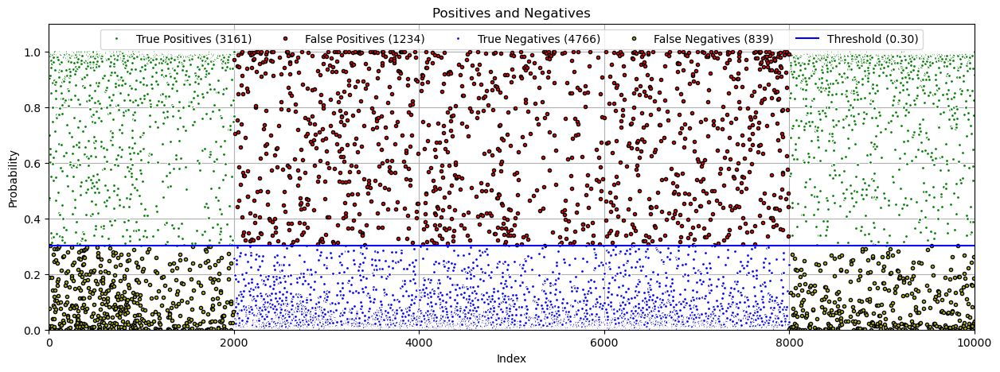


5. Model Interpretation and Visualization (Predictions vs. Actuals) 
5.1 Error Analysis (Predictions vs. Actuals)


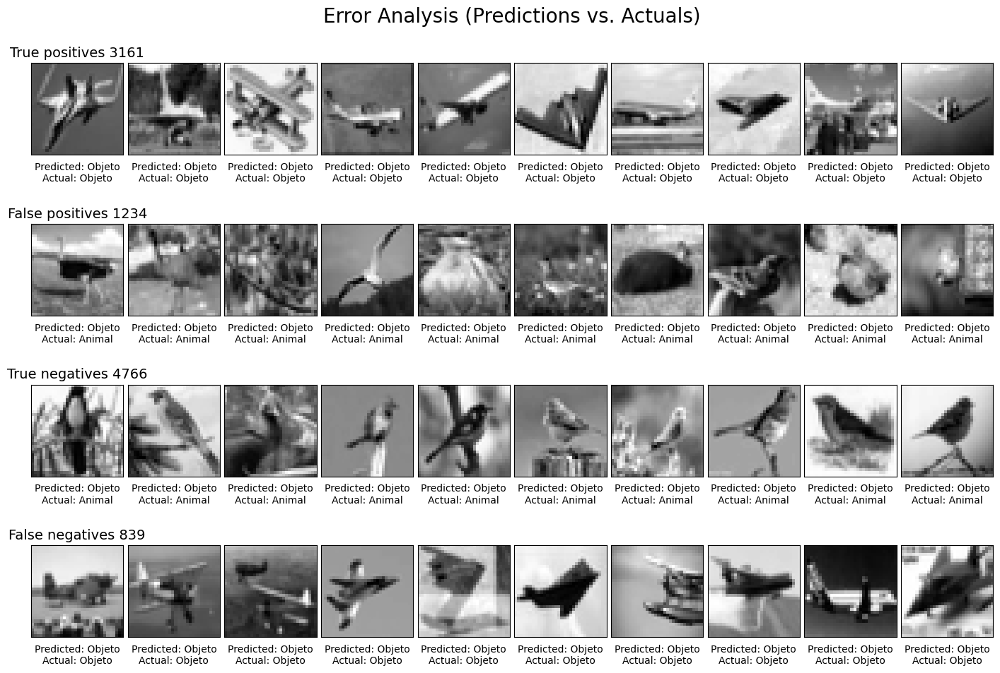

In [58]:
mplB = MLPClassifier(hidden_layer_sizes=(100, 100, 100), verbose=True, 
                     max_iter=100, random_state=42, early_stopping = True).fit(X1, y1b)

parameters={
    'grid_search': False,
    'hidden_layer_sizes': False,
    'n_neighbors' : np.array([12, 14, 16]),
}

# Processo de treino, calibração, avaliação do modelo e interpretação dos resultados
name='MLPClassifier'
classifier_metrics[name] = model_process(mplB, parameters, X1, y1b, X2, y2b, cv=2, scoring='f1', name=name)

### 1.3 Model Comparison and Selection

In [59]:
print("Modelos a comparar:\n", [i for i in classifier_metrics.keys()])

Modelos a comparar:
 ['RandomForest', 'knn', 'MLPClassifier']


Confusion matrix do classificador Default threhold no limite 0.50: 
 [[5350  650]
 [1292 2708]]
Confusion matrix do classificador Threhold highest F1  no limite 0.42: 
 [[4861 1139]
 [ 849 3151]]
Confusion matrix do classificador Threhold lowest error no limite 0.47: 
 [[5174  826]
 [1086 2914]]
Confusion matrix do classificador Default threhold no limite 0.50: 
 [[5299  701]
 [1775 2225]]
Confusion matrix do classificador Threhold highest F1  no limite 0.42: 
 [[4976 1024]
 [1477 2523]]
Confusion matrix do classificador Threhold lowest error no limite 0.50: 
 [[5299  701]
 [1775 2225]]
Confusion matrix do classificador Default threhold no limite 0.50: 
 [[5124  876]
 [1099 2901]]
Confusion matrix do classificador Threhold highest F1  no limite 0.30: 
 [[4766 1234]
 [ 839 3161]]
Confusion matrix do classificador Threhold lowest error no limite 0.59: 
 [[5256  744]
 [1213 2787]]


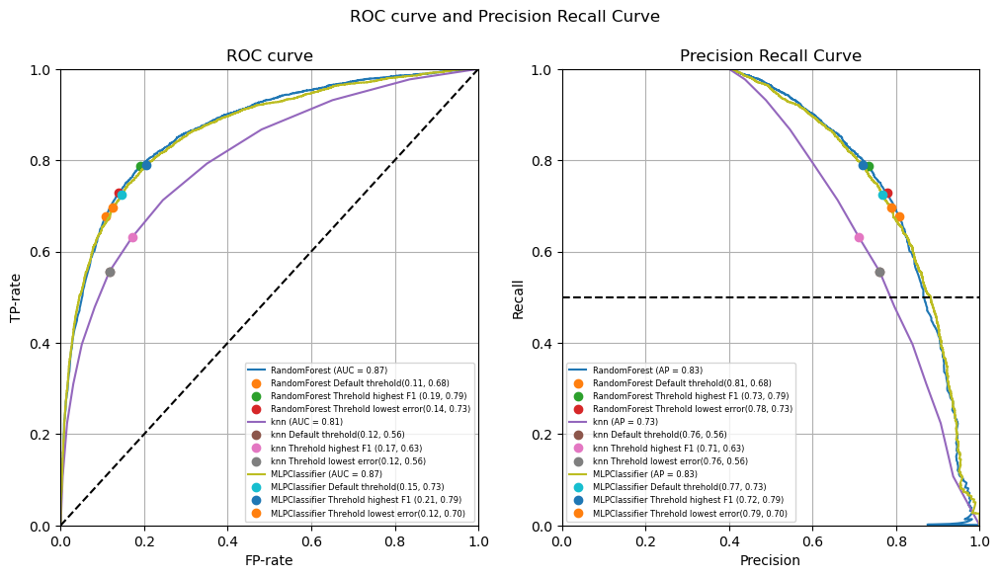

In [60]:
# Comparar o desempenho dos classificadores através das métricas e das curvas ROC e Precision-Recall
plot_roc_pr_from_dict(classifier_metrics, y2b)

In [61]:
cols = ['roc_auc', 'average_precision', 'Accuracy', 'Errors', 'F1-Score', 'FP Rate', 'Precision', 'Recall', 'TN Rate']
print_summary(classifier_metrics, cols)

|               |   roc_auc |   average_precision | Accuracy                       | Errors                     | F1-Score                       | FP Rate                       | Precision                       | Recall                       | TN Rate                       |
|:--------------|----------:|--------------------:|:-------------------------------|:---------------------------|:-------------------------------|:------------------------------|:--------------------------------|:-----------------------------|:------------------------------|
| RandomForest  |  0.869931 |            0.82641  | Default(0.50)        0.81      | Default(0.50)        1942  | Default(0.50)        0.85      | Default(0.50)        0.19     | Default(0.50)        0.89       | Default(0.50)        0.81    | Default(0.50)        0.81     |
|               |           |                     | Highest F1(0.42)     0.80      | Highest F1(0.42)     1988  | Highest F1(0.42)     0.83      | Highest F1(0.42)     0.27

Comparando as duas tabelas, podemos observar que, em ambos os casos, o threshold padrão de 0,5 não é o melhor para maximizar o F1-score. Em ambas as situações, ajustar o threshold resultou em um aumento no F1-score e/ou uma redução nos erros.

Na primeira tabela, ajustando o threshold para 0,44 resultou no maior F1-score (0,84), enquanto ajustando para 0,47 resultou no menor número de erros (1912). Já na segunda tabela, o ajuste do threshold para 0,42 resultou no maior F1-score (0,80), embora a redução de erros não tenha sido significativa.

Em geral, isso destaca a importância de ajustar o threshold para o melhor valor possível, em vez de depender do valor padrão de 0,5. Isso pode resultar em um desempenho geral muito melhor do modelo.

## 2. Binary classification with normalization

### Normalize the data with StandardScaler (0-1)

Classificação binária com normalização utilizando StandardScaler é uma técnica de pré-processamento de dados que transforma as features num formato padrão. A ideia é escalar os valores das variáveis para que todas estejam na mesma ordem de grandeza, facilitando assim o processo de aprendizagem do modelo.

In [29]:
# X1, X2, y1b, y2b
X1n, X2n = normalize(X1, X2)


### 2.1 Random Forest Classifier

Model Fine-Tuning and Testing Methodologies
Parameters for RandomForestNormalized: {'bootstrap': True, 'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'gini', 'max_depth': 45, 'max_features': 'auto', 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 350, 'n_jobs': 5, 'oob_score': False, 'random_state': 42, 'verbose': 0, 'warm_start': False}

3. Model Calibration
Best F1 score: 0.76 | Best threshold: 0.42
Best error: 1925.00 | Best threshold: 0.46


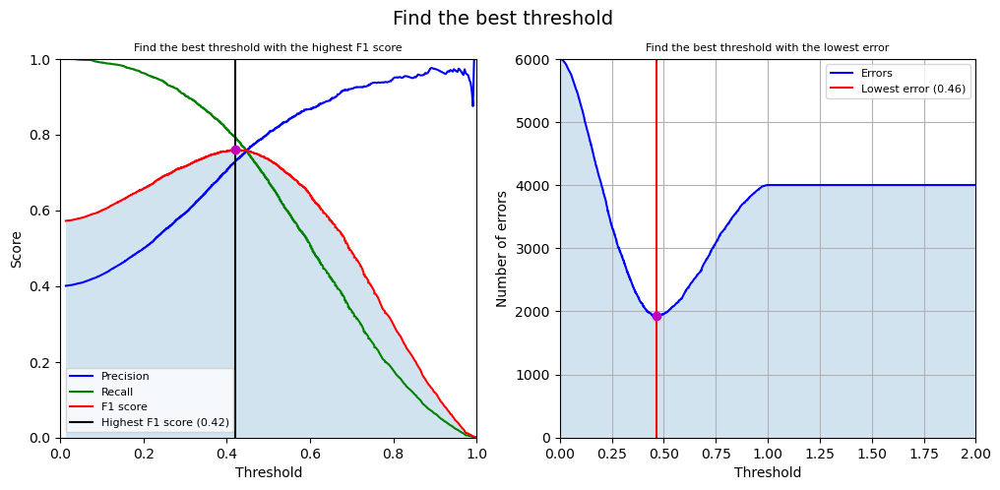

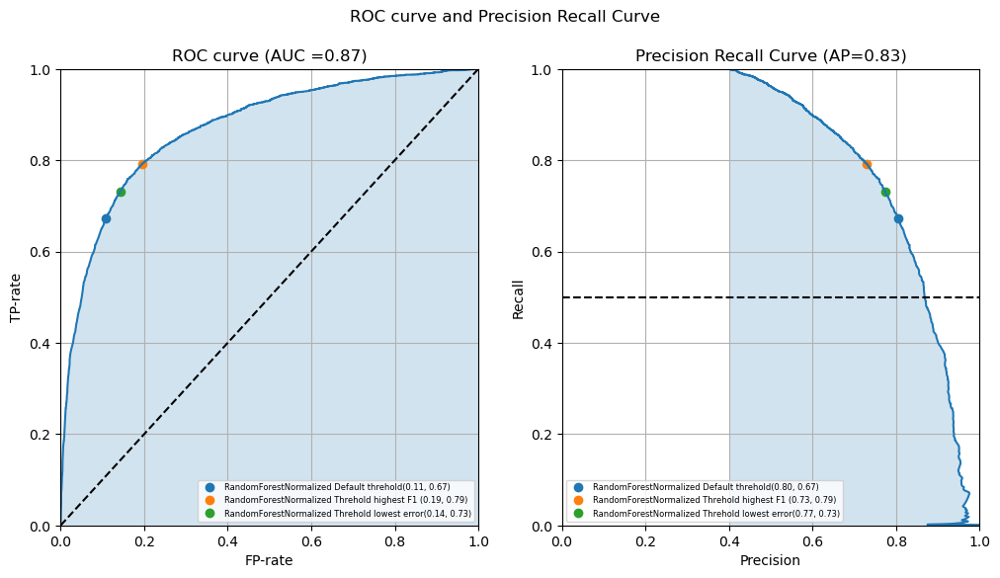


4. Model Evaluation metrics with best thresholds


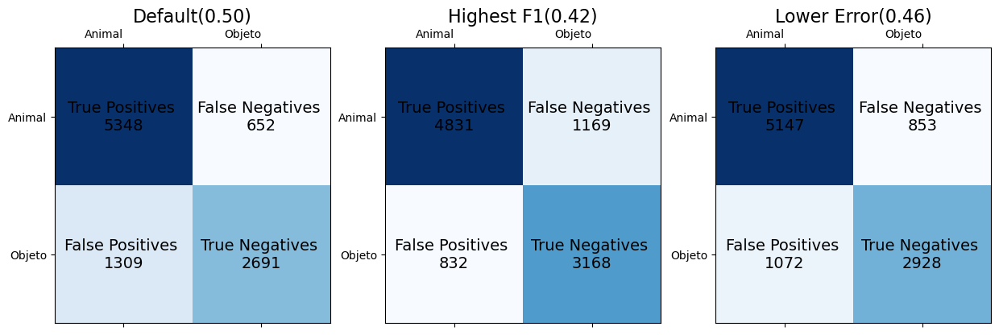

Classification_report:
              precision    recall  f1-score   support

           0       0.80      0.89      0.85      6000
           1       0.80      0.67      0.73      4000

    accuracy                           0.80     10000
   macro avg       0.80      0.78      0.79     10000
weighted avg       0.80      0.80      0.80     10000

|                   |   Accuracy |   Precision |   Recall |   F1-Score |   Errors |   TN Rate |   FP Rate |
|:------------------|-----------:|------------:|---------:|-----------:|---------:|----------:|----------:|
| Default(0.50)     |       0.8  |        0.89 |     0.8  |       0.85 |     1961 |      0.8  |      0.2  |
| Highest F1(0.42)  |       0.8  |        0.81 |     0.85 |       0.83 |     2001 |      0.73 |      0.27 |
| Lower Error(0.46) |       0.81 |        0.86 |     0.83 |       0.84 |     1925 |      0.77 |      0.23 |
type(metric)= <class 'pandas.core.frame.DataFrame'>
Escolha do melhor threshold: 0.42002442002442


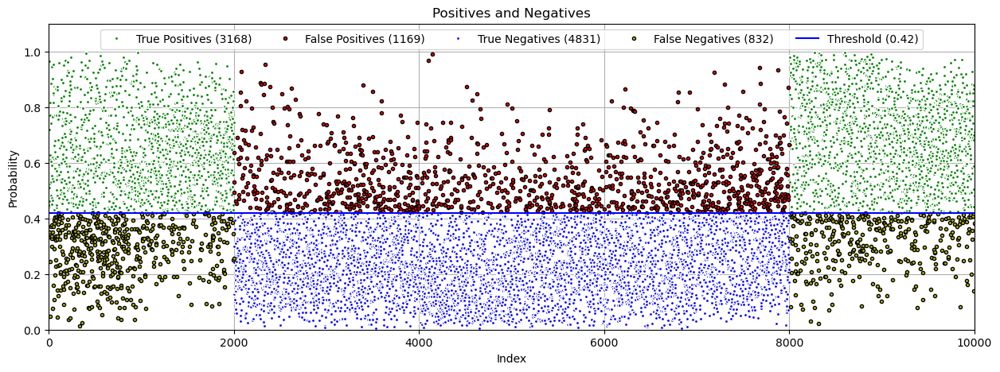


5. Model Interpretation and Visualization (Predictions vs. Actuals) 
5.1 Error Analysis (Predictions vs. Actuals)


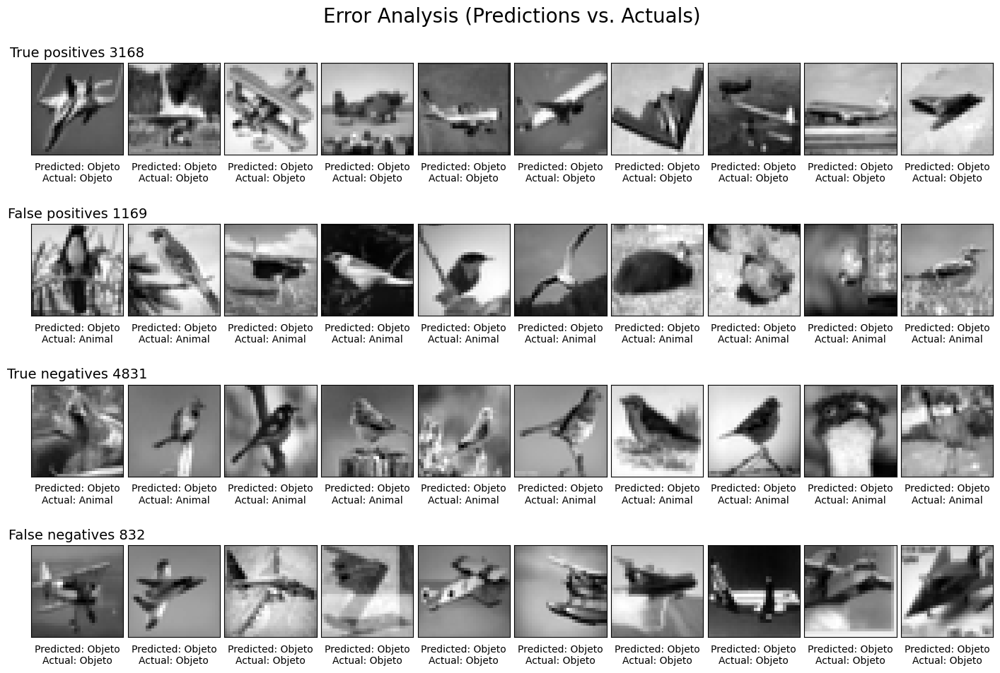

In [30]:
rf = RandomForestClassifier(n_estimators= 350, 
                            max_depth= 45,
                            random_state=42, 
                            n_jobs=5).fit(X1n, y1b) # run with default parameters
parameters = {
    'grid_search': False,
    'n_estimators': np.array([350, 400, 450]),
    'max_depth': np.array([35, 40, 45])
}


# Processo de treino, calibração, avaliação do modelo e interpretação dos resultados
name='RandomForestNormalized'
classifier_metrics[name] = model_process(rf, parameters, X1n, y1b, X2n, y2b, 
                                         cv=2, scoring='f1', name=name)

Neste caso, os resultados finais foram muito semelhantes os resultados obtidos na Random Forest sem a normalização. Uma justificação para tal é que a RandomForest é uma técnica de árvore de decisão que não é sensível a diferentes escalas dos dados, uma vez que cada árvore é construída a partir de uma amostra aleatória dos dados e um subconjunto aleatório de recursos. Dessa forma, a normalização dos dados pode não ter um impacto significativo na performance da RandomForest.

### 2.2 KNN Classifier

Model Fine-Tuning and Testing Methodologies
Parameters for knnNormalized: {'algorithm': 'auto', 'leaf_size': 30, 'metric': 'minkowski', 'metric_params': None, 'n_jobs': 5, 'n_neighbors': 12, 'p': 2, 'weights': 'uniform'}

3. Model Calibration
Best F1 score: 0.69 | Best threshold: 0.42
Best error: 2444.00 | Best threshold: 0.42


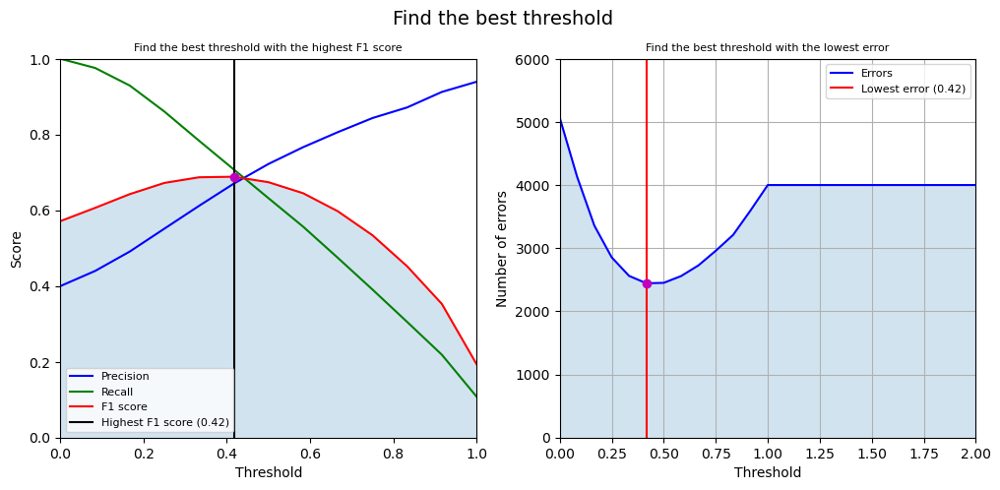

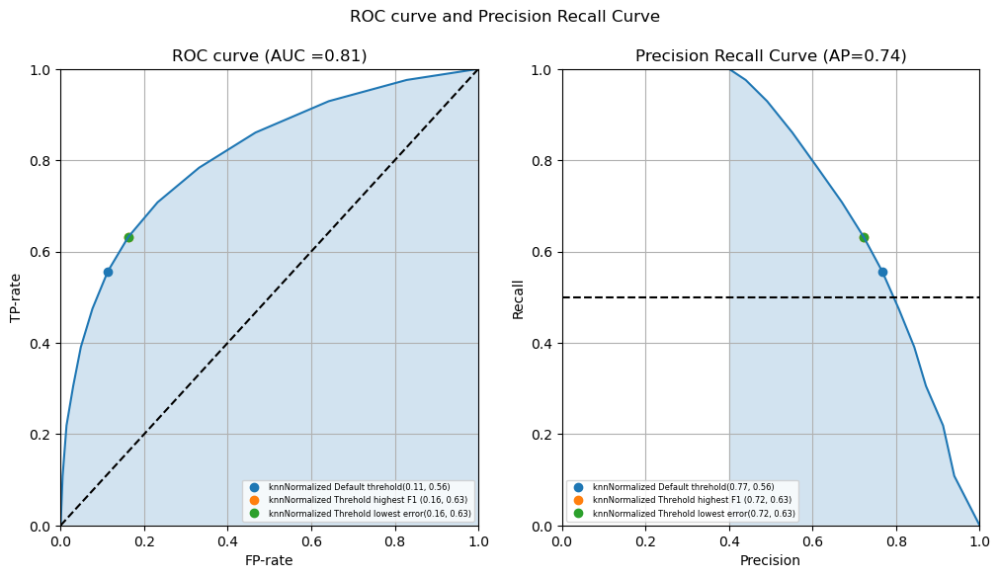


4. Model Evaluation metrics with best thresholds


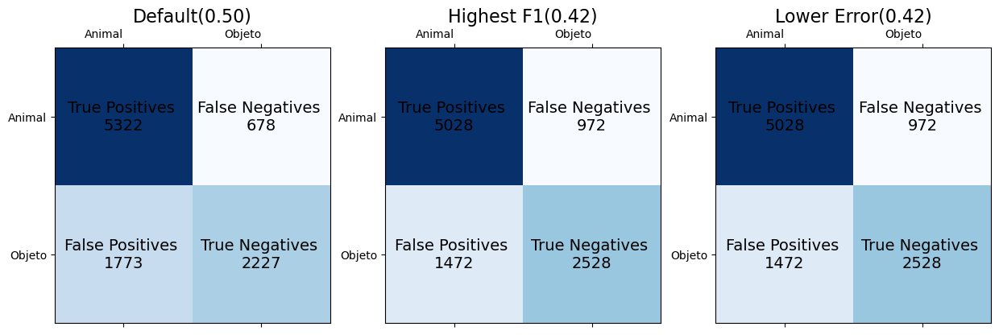

Classification_report:


c:\Users\ruben\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)


              precision    recall  f1-score   support

           0       0.75      0.89      0.81      6000
           1       0.77      0.56      0.65      4000

    accuracy                           0.75     10000
   macro avg       0.76      0.72      0.73     10000
weighted avg       0.76      0.75      0.75     10000

|                   |   Accuracy |   Precision |   Recall |   F1-Score |   Errors |   TN Rate |   FP Rate |
|:------------------|-----------:|------------:|---------:|-----------:|---------:|----------:|----------:|
| Default(0.50)     |       0.75 |        0.89 |     0.75 |       0.81 |     2451 |      0.77 |      0.23 |
| Highest F1(0.42)  |       0.76 |        0.84 |     0.77 |       0.8  |     2444 |      0.72 |      0.28 |
| Lower Error(0.42) |       0.76 |        0.84 |     0.77 |       0.8  |     2444 |      0.72 |      0.28 |
type(metric)= <class 'pandas.core.frame.DataFrame'>
Escolha do melhor threshold: 0.4166666666666667


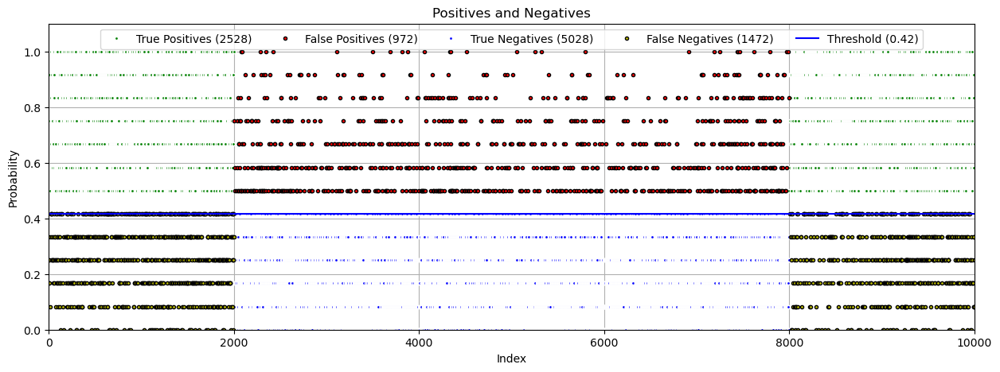


5. Model Interpretation and Visualization (Predictions vs. Actuals) 
5.1 Error Analysis (Predictions vs. Actuals)


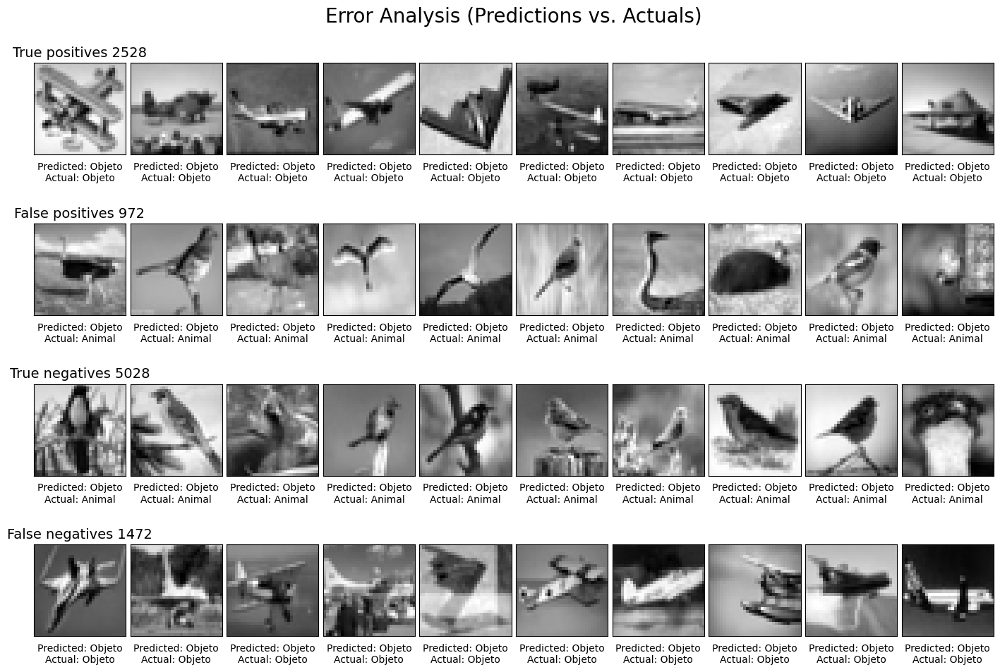

In [31]:
# X1n, X2n, y1b, y2b

# treinar o classificador com os dados de treino e o gridsearchcv
knn = KNeighborsClassifier(n_neighbors=12, n_jobs=5).fit(X1n, y1b) # Dados alterar para X1n
parameters={
    'grid_search': False,
    'n_neighbors' : np.array([12, 14, 16]),
}

name='knnNormalized' # Dados alterar para knnNormalized
classifier_metrics[name] = model_process(knn, parameters, X1n, # Dados alterar para X1n
                                         y1b, X2n, # Dados alterar para X2n
                                         y2b, cv=2, scoring='f1', 
                                         name=name)

Na tabela de Classification_report, foram apresentados os resultados da classificação binária utilizando o algoritmo KNN com a normalização dos dados usando o StandardScaler. Os valores de accuracy e F1-Score são muito semelhantes aos da tabela sem normalização, enquanto a precisão e o recall tiveram um aumento discreto em todas as configurações testadas. Isso pode ser justificado pelo facto de que a normalização dos dados permite que o algoritmo KNN identifique melhor as diferenças de distância entre os pontos de dados, especialmente em conjuntos de dados com atributos numéricos em diferentes escalas. Isso pode levar a uma melhoria na precisão e recall, embora a accuracy e o F1-Score permaneçam os mesmos. No entanto, a diferença é bastante pequena, o que sugere que o conjunto de dados do CIFAR-10 já estava relativamente bem escalado, mesmo sem a normalização.

### 2.3 Model Comparison and Selection

In [32]:
print("Modelos a comparar:\n", [i for i in classifier_metrics.keys()])

Modelos a comparar:
 ['RandomForest', 'knn', 'RandomForestNormalized', 'knnNormalized']


Confusion matrix do classificador Default threhold no limite 0.50: 
 [[5348  652]
 [1309 2691]]
Confusion matrix do classificador Threhold highest F1  no limite 0.42: 
 [[4831 1169]
 [ 832 3168]]
Confusion matrix do classificador Threhold lowest error no limite 0.46: 
 [[5147  853]
 [1072 2928]]
Confusion matrix do classificador Default threhold no limite 0.50: 
 [[5299  701]
 [1775 2225]]
Confusion matrix do classificador Threhold highest F1  no limite 0.42: 
 [[4976 1024]
 [1477 2523]]
Confusion matrix do classificador Threhold lowest error no limite 0.50: 
 [[5299  701]
 [1775 2225]]
Confusion matrix do classificador Default threhold no limite 0.50: 
 [[5348  652]
 [1309 2691]]
Confusion matrix do classificador Threhold highest F1  no limite 0.42: 
 [[4831 1169]
 [ 832 3168]]
Confusion matrix do classificador Threhold lowest error no limite 0.46: 
 [[5147  853]
 [1072 2928]]
Confusion matrix do classificador Default threhold no limite 0.50: 
 [[5322  678]
 [1773 2227]]
Confusion mat

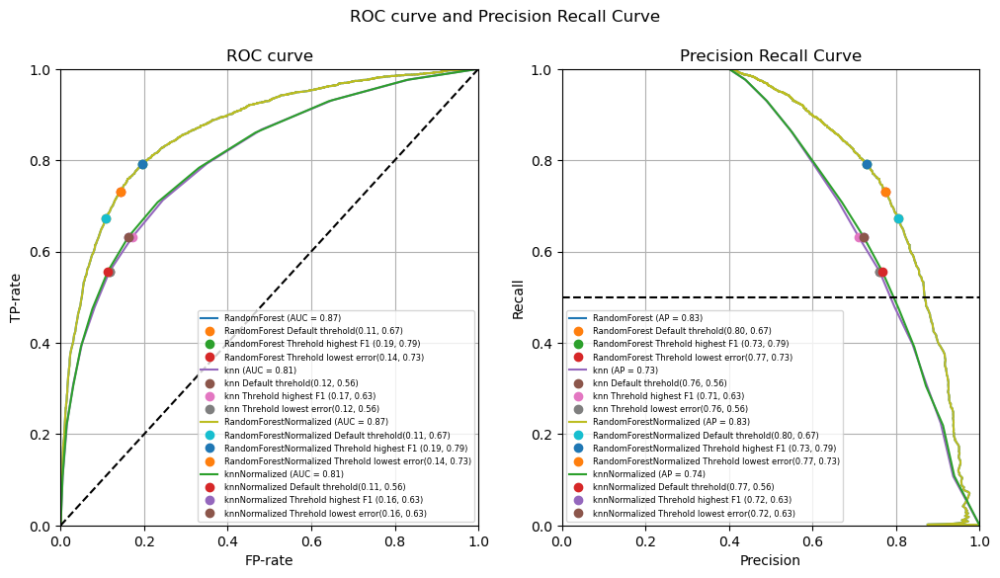

In [33]:
plot_roc_pr_from_dict(classifier_metrics, y2b)

In [34]:
cols = ['roc_auc', 'average_precision', 'Accuracy', 'Errors', 'F1-Score', 'FP Rate', 'Precision', 'Recall', 'TN Rate']
print_summary(classifier_metrics, cols)

|                        |   roc_auc |   average_precision | Accuracy                       | Errors                     | F1-Score                       | FP Rate                       | Precision                       | Recall                       | TN Rate                       |
|:-----------------------|----------:|--------------------:|:-------------------------------|:---------------------------|:-------------------------------|:------------------------------|:--------------------------------|:-----------------------------|:------------------------------|
| RandomForest           |  0.869845 |            0.825527 | Default(0.50)        0.80      | Default(0.50)        1961  | Default(0.50)        0.85      | Default(0.50)        0.20     | Default(0.50)        0.89       | Default(0.50)        0.80    | Default(0.50)        0.80     |
|                        |           |                     | Highest F1(0.42)     0.80      | Highest F1(0.42)     2001  | Highest F1(0.42)     0

Observando as 4 tabelas de Classification_report, podemos notar que a normalização dos dados parece não ter tido um impacto significativo nos resultados do modelo Random Forest. As métricas permaneceram essencialmente as mesmas entre as tabelas com e sem normalização.

Já para o modelo KNN Classifier, a normalização dos dados parece ter tido um pequeno impacto nos resultados. A métrica F1-score apresentou uma pequena melhoria quando os dados foram normalizados.

Em geral, ambas as técnicas de classificação apresentaram desempenho semelhante, mas com alguns resultados superiores em algumas métricas em cada técnica. 


## 3. Binary classification with PCA

De seguida, o objetivo é fazer a classificação com o PCA. O PCA (Principal Component Analysis) é uma técnica de análise que é usada para reduzir a dimensão dos dados, mantendo as informações mais relevantes. Ele realiza a redução da dimensionalidade dos dados encontrando as principais componentes que melhor descrevem a variação dos dados. Essas componentes são ordenadas de acordo com a quantidade de variação que elas explicam nos dados originais. Dessa forma, o PCA pode ajudar a simplificar o conjunto de dados, reduzir o ruído e permitir a visualização dos dados num espaço de menor dimensão. 

### Transform the data with PCA

Normalmente, para a transformação dos dados para o PCA, utilizou-se o numero de componentes onde a variância explicada é superior a 99%

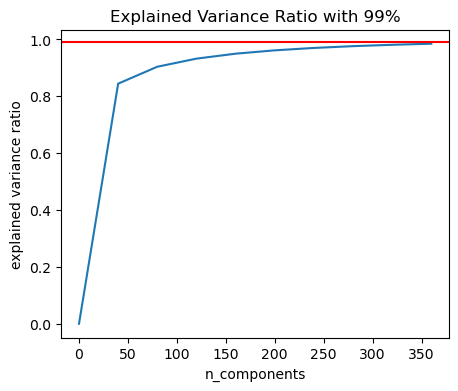

In [48]:
import numpy as np

n_components = np.arange(0, 400, 40)
models = [PCA(n_components=i).fit(X1) for i in n_components]

plt.figure(figsize=(5, 4))
plt.title('Explained Variance Ratio with 99%')
plt.plot(n_components, [m.explained_variance_ratio_.sum() for m in models])
plt.axhline(y=0.99, color='r', linestyle='-')
plt.xlabel('n_components')
plt.ylabel('explained variance ratio')
plt.show()

In [37]:
# PCA com 99% da variância explicada
X1p, X2p = principal_component_analysis(X1, X2, n_components=0.99)

print("X1:", X1.shape, X2.shape)
print("X1p:", X1p.shape, X2p.shape)

X1: (50000, 1024) (10000, 1024)
X1p: (50000, 436) (10000, 436)


Apos realizar uma reducao da dimensionalidade dos dados, pode-se observar que variancia explicada de 99% é obtida com 436 componentes principais.

### 3.1 Random Forest Classifier

Model Fine-Tuning and Testing Methodologies
Parameters for RandomForestPCA: {'bootstrap': True, 'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'gini', 'max_depth': 45, 'max_features': 'auto', 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 350, 'n_jobs': 5, 'oob_score': False, 'random_state': 42, 'verbose': 0, 'warm_start': False}

3. Model Calibration
Best F1 score: 0.73 | Best threshold: 0.43
Best error: 2123.00 | Best threshold: 0.48


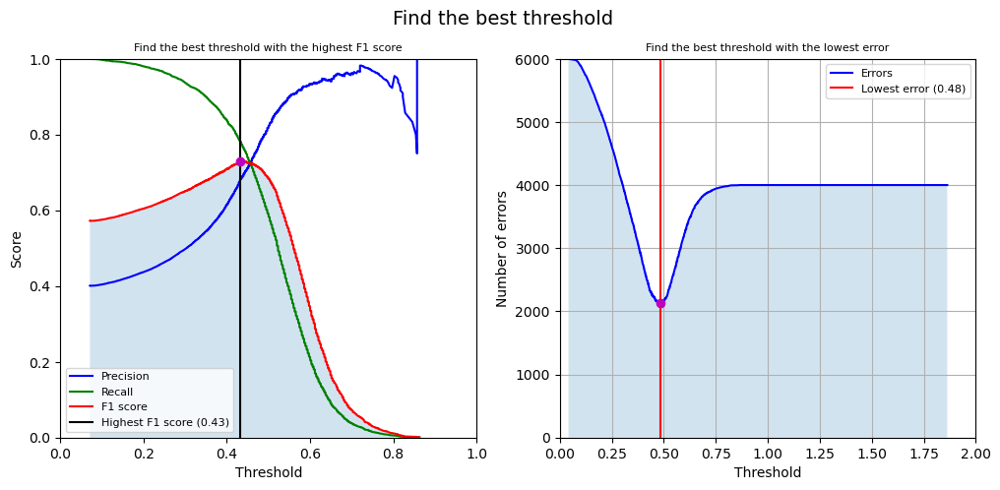

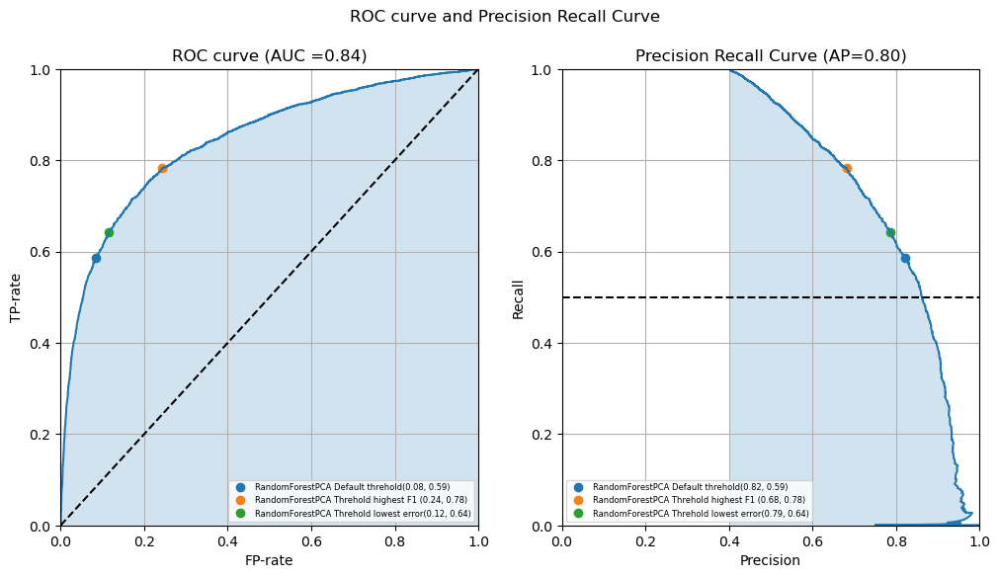


4. Model Evaluation metrics with best thresholds


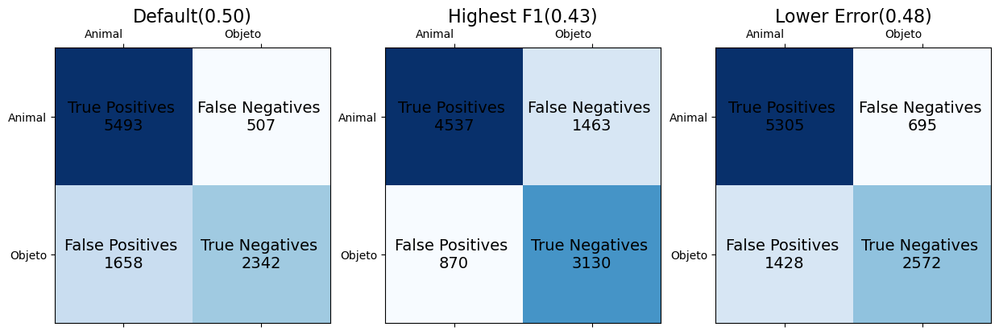

Classification_report:
              precision    recall  f1-score   support

           0       0.77      0.92      0.84      6000
           1       0.82      0.59      0.68      4000

    accuracy                           0.78     10000
   macro avg       0.80      0.75      0.76     10000
weighted avg       0.79      0.78      0.77     10000

|                   |   Accuracy |   Precision |   Recall |   F1-Score |   Errors |   TN Rate |   FP Rate |
|:------------------|-----------:|------------:|---------:|-----------:|---------:|----------:|----------:|
| Default(0.50)     |       0.78 |        0.92 |     0.77 |       0.84 |     2165 |      0.82 |      0.18 |
| Highest F1(0.43)  |       0.77 |        0.76 |     0.84 |       0.8  |     2333 |      0.68 |      0.32 |
| Lower Error(0.48) |       0.79 |        0.88 |     0.79 |       0.83 |     2123 |      0.79 |      0.21 |
type(metric)= <class 'pandas.core.frame.DataFrame'>
Escolha do melhor threshold: 0.43177800174445774


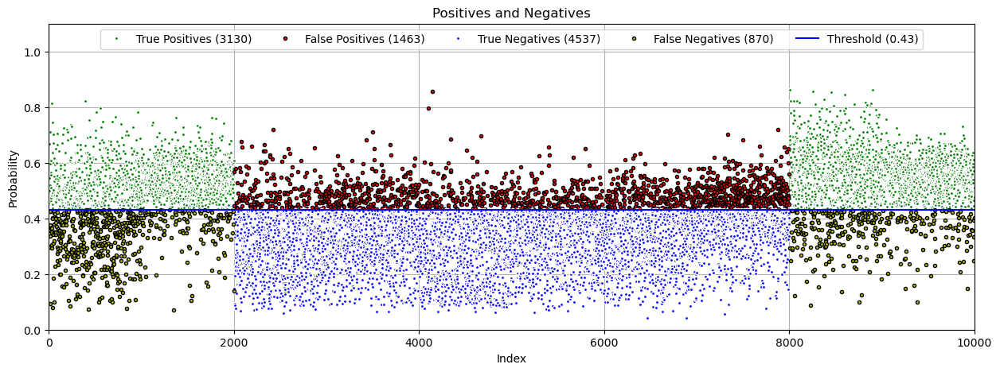

In [49]:
# X1p, X2p, y1b, y2b
rf = RandomForestClassifier(n_estimators= 350, 
                            max_depth= 45,
                            random_state=42, 
                            n_jobs=5
                            ).fit(X1p, y1b)
parameters = {
    'grid_search': False,
    'n_estimators': np.array([350, 400, 450]),
    'max_depth': np.array([35, 40, 45])
}

# Processo de treino, calibração, avaliação do modelo e interpretação dos resultados
name='RandomForestPCA'
classifier_metrics[name] = model_process(rf, parameters, X1p, 
                                         y1b, X2p, 
                                         y2b, cv=2, scoring='f1', 
                                         name=name, pca=True)

### 3.2 KNN Classifier

Model Fine-Tuning and Testing Methodologies
Parameters for knnPCA: {'algorithm': 'auto', 'leaf_size': 30, 'metric': 'minkowski', 'metric_params': None, 'n_jobs': 5, 'n_neighbors': 12, 'p': 2, 'weights': 'uniform'}

3. Model Calibration
Best F1 score: 0.59 | Best threshold: 0.50
Best error: 3347.00 | Best threshold: 0.58


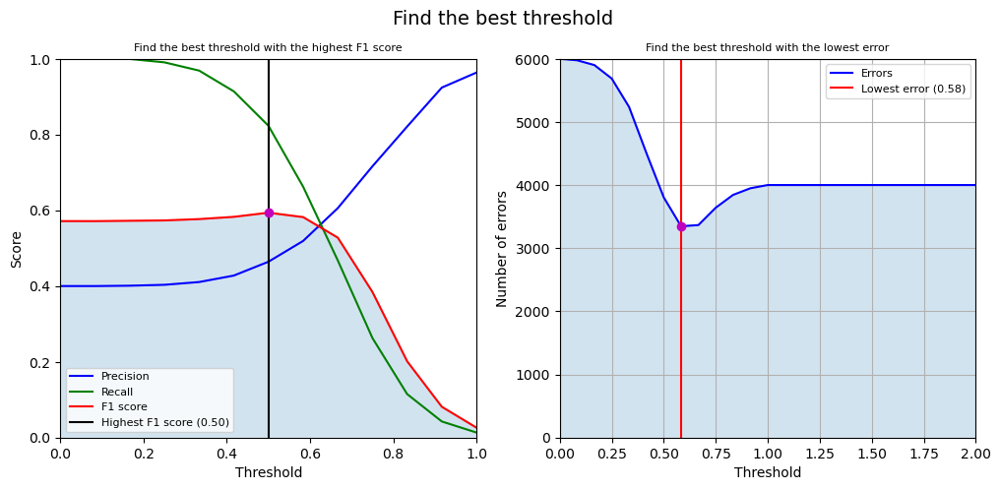

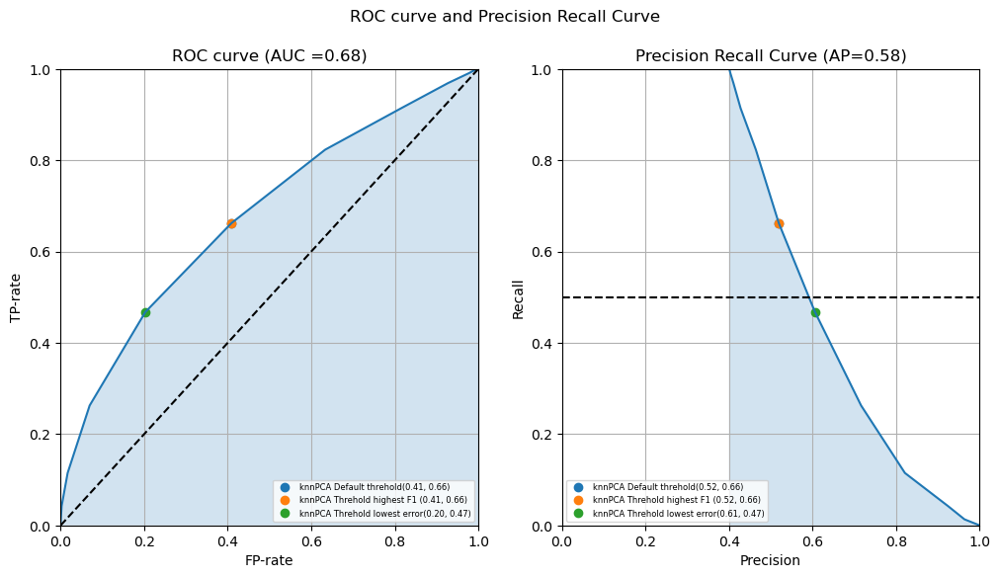


4. Model Evaluation metrics with best thresholds


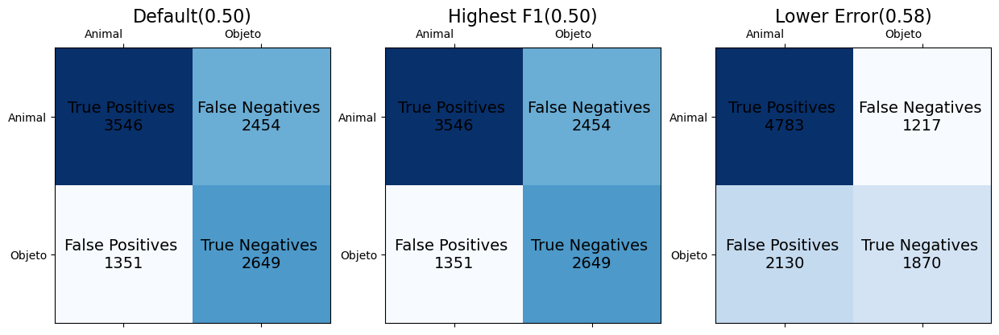

Classification_report:


c:\Users\ruben\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)


              precision    recall  f1-score   support

           0       0.72      0.59      0.65      6000
           1       0.52      0.66      0.58      4000

    accuracy                           0.62     10000
   macro avg       0.62      0.63      0.62     10000
weighted avg       0.64      0.62      0.62     10000

|                   |   Accuracy |   Precision |   Recall |   F1-Score |   Errors |   TN Rate |   FP Rate |
|:------------------|-----------:|------------:|---------:|-----------:|---------:|----------:|----------:|
| Default(0.50)     |       0.62 |        0.59 |     0.72 |       0.65 |     3805 |      0.52 |      0.48 |
| Highest F1(0.50)  |       0.62 |        0.59 |     0.72 |       0.65 |     3805 |      0.52 |      0.48 |
| Lower Error(0.58) |       0.67 |        0.8  |     0.69 |       0.74 |     3347 |      0.61 |      0.39 |
type(metric)= <class 'pandas.core.frame.DataFrame'>
Escolha do melhor threshold: 0.5


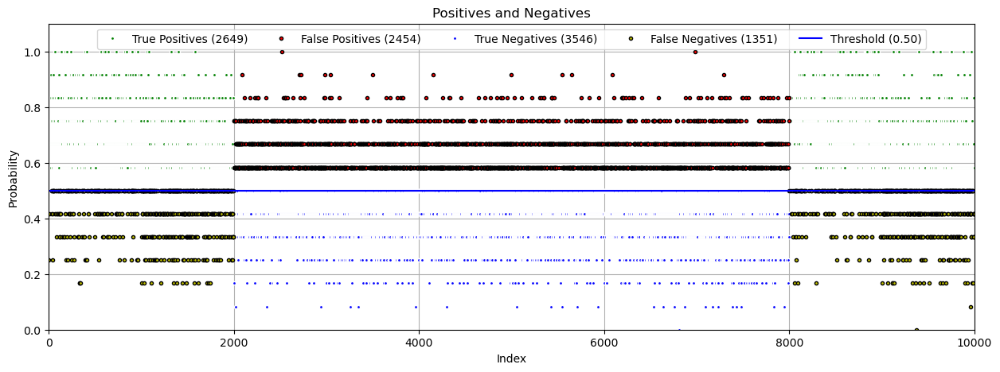

In [50]:
# X1p, X2p, y1b, y2b

knn = KNeighborsClassifier(n_neighbors=12, n_jobs=5).fit(X1p, y1b)
parameters={
    'grid_search': False,
    'n_neighbors' : np.array([12, 14, 16]),
}

name='knnPCA'
classifier_metrics[name] = model_process(knn, parameters, X1p,
                                         y1b, X2p, 
                                         y2b, cv=2, scoring='f1', 
                                         name=name, pca=True)

### 3.3 Model Comparison and Selection

In [51]:
print("Modelos a comparar:\n", [i for i in classifier_metrics.keys()])

Modelos a comparar:
 ['RandomForest', 'knn', 'RandomForestNormalized', 'knnNormalized', 'RandomForestPCA', 'knnPCA']


Confusion matrix do classificador Default threhold no limite 0.50: 
 [[5348  652]
 [1309 2691]]
Confusion matrix do classificador Threhold highest F1  no limite 0.42: 
 [[4831 1169]
 [ 832 3168]]
Confusion matrix do classificador Threhold lowest error no limite 0.46: 
 [[5147  853]
 [1072 2928]]
Confusion matrix do classificador Default threhold no limite 0.50: 
 [[5299  701]
 [1775 2225]]
Confusion matrix do classificador Threhold highest F1  no limite 0.42: 
 [[4976 1024]
 [1477 2523]]
Confusion matrix do classificador Threhold lowest error no limite 0.50: 
 [[5299  701]
 [1775 2225]]
Confusion matrix do classificador Default threhold no limite 0.50: 
 [[5348  652]
 [1309 2691]]
Confusion matrix do classificador Threhold highest F1  no limite 0.42: 
 [[4831 1169]
 [ 832 3168]]
Confusion matrix do classificador Threhold lowest error no limite 0.46: 
 [[5147  853]
 [1072 2928]]
Confusion matrix do classificador Default threhold no limite 0.50: 
 [[5322  678]
 [1773 2227]]
Confusion mat

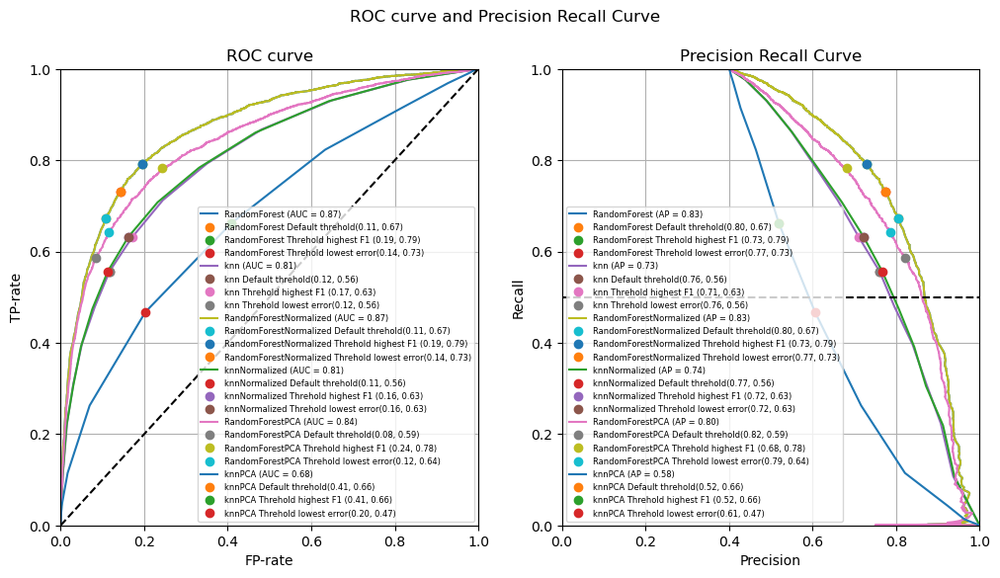

In [52]:
plot_roc_pr_from_dict(classifier_metrics, y2b)

In [53]:
cols = ['roc_auc', 'average_precision', 'Accuracy', 'Errors', 'F1-Score', 'FP Rate', 'Precision', 'Recall', 'TN Rate']
print_summary(classifier_metrics, cols)

|                        |   roc_auc |   average_precision | Accuracy                       | Errors                     | F1-Score                       | FP Rate                       | Precision                       | Recall                       | TN Rate                       |
|:-----------------------|----------:|--------------------:|:-------------------------------|:---------------------------|:-------------------------------|:------------------------------|:--------------------------------|:-----------------------------|:------------------------------|
| RandomForest           |  0.869845 |            0.825527 | Default(0.50)        0.80      | Default(0.50)        1961  | Default(0.50)        0.85      | Default(0.50)        0.20     | Default(0.50)        0.89       | Default(0.50)        0.80    | Default(0.50)        0.80     |
|                        |           |                     | Highest F1(0.42)     0.80      | Highest F1(0.42)     2001  | Highest F1(0.42)     0

Nesta etapa recorreu-se a tecnica de reducao de dimensao para testar o seu efeito.
Como podemos verificar nos classificadores RandomForestPCA e knnPCA todas as metricas destes classificadores pioraram em relacao aos outros classificadores RandomForest, knn e RandomForestNormalized, knnNormalized.

## 4. Binary classification with PCA and Normalization

Neste caso, o objetivo é fazer a classificação onde se aplica as duas tecnicao utilizadas, o PCA e a normalização dos dados (StandardScaler). 

### Normalize the data with StandardScaler (0-1) and transform with PCA

In [51]:
# X1, X2, y1b, y2b

# normalize the data with StandardScaler
X1n, X2n = normalize(X1, X2)

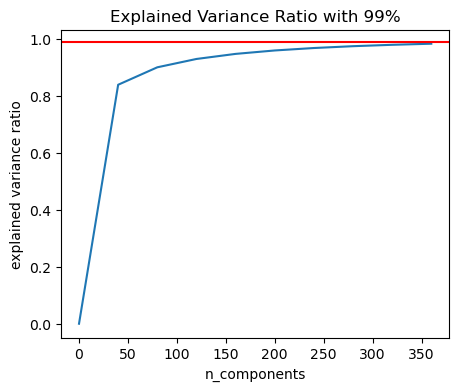

In [54]:
import numpy as np

n_components = np.arange(0, 400, 40)
models = [PCA(n_components=i).fit(X1n) for i in n_components]

plt.figure(figsize=(5, 4))
plt.title('Explained Variance Ratio with 99%')
plt.plot(n_components, [m.explained_variance_ratio_.sum() for m in models])
plt.axhline(y=0.99, color='r', linestyle='-')
plt.xlabel('n_components')
plt.ylabel('explained variance ratio')
plt.show()

In [55]:
# PCA com 99% da variância explicada
X1np, X2np = principal_component_analysis(X1n, X2n, n_components=0.99)

print("X1:", X1.shape, X2.shape)
print("X1np:", X1np.shape, X2np.shape)

X1: (50000, 1024) (10000, 1024)
X1p: (50000, 436) (10000, 436)


### 4.1 Random Forest Classifier

Model Fine-Tuning and Testing Methodologies
Parameters for RandomForestNormalizedPCA: {'bootstrap': True, 'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'gini', 'max_depth': 45, 'max_features': 'auto', 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 350, 'n_jobs': 5, 'oob_score': False, 'random_state': 42, 'verbose': 0, 'warm_start': False}

3. Model Calibration
Best F1 score: 0.72 | Best threshold: 0.45
Best error: 2192.00 | Best threshold: 0.47


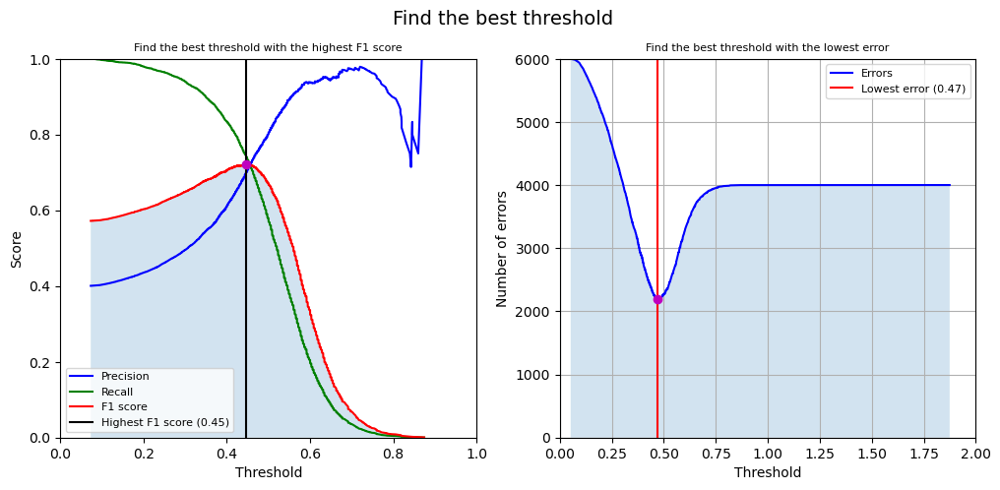

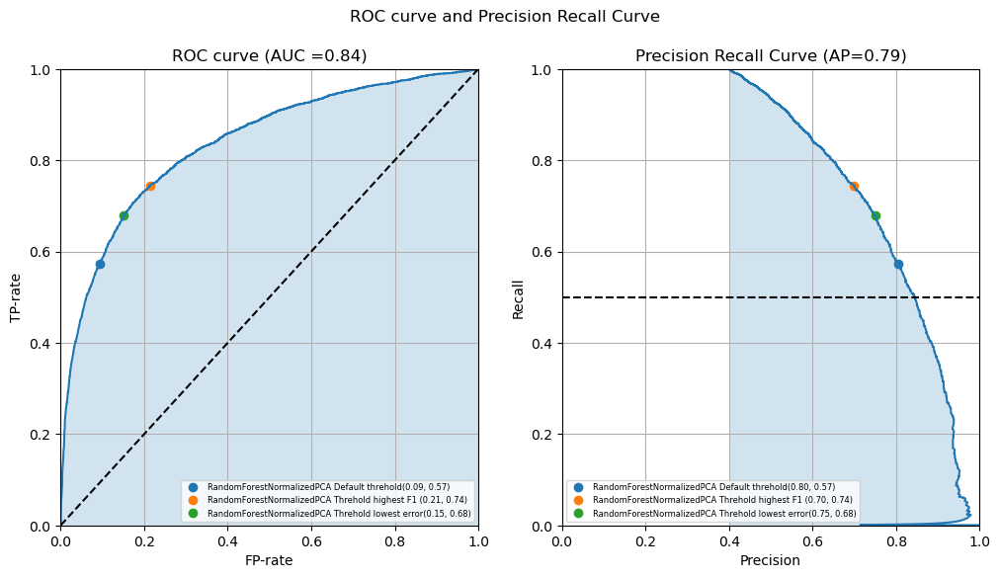


4. Model Evaluation metrics with best thresholds


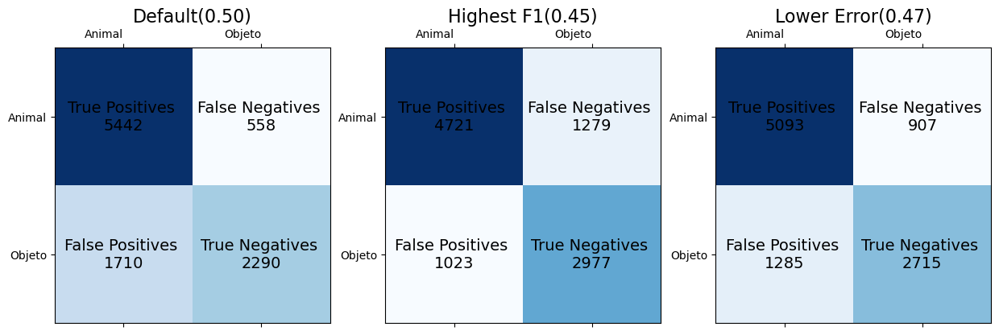

Classification_report:
              precision    recall  f1-score   support

           0       0.76      0.91      0.83      6000
           1       0.80      0.57      0.67      4000

    accuracy                           0.77     10000
   macro avg       0.78      0.74      0.75     10000
weighted avg       0.78      0.77      0.76     10000

|                   |   Accuracy |   Precision |   Recall |   F1-Score |   Errors |   TN Rate |   FP Rate |
|:------------------|-----------:|------------:|---------:|-----------:|---------:|----------:|----------:|
| Default(0.50)     |       0.77 |        0.91 |     0.76 |       0.83 |     2268 |      0.8  |      0.2  |
| Highest F1(0.45)  |       0.77 |        0.79 |     0.82 |       0.8  |     2302 |      0.7  |      0.3  |
| Lower Error(0.47) |       0.78 |        0.85 |     0.8  |       0.82 |     2192 |      0.75 |      0.25 |
type(metric)= <class 'pandas.core.frame.DataFrame'>
Escolha do melhor threshold: 0.445773997228505


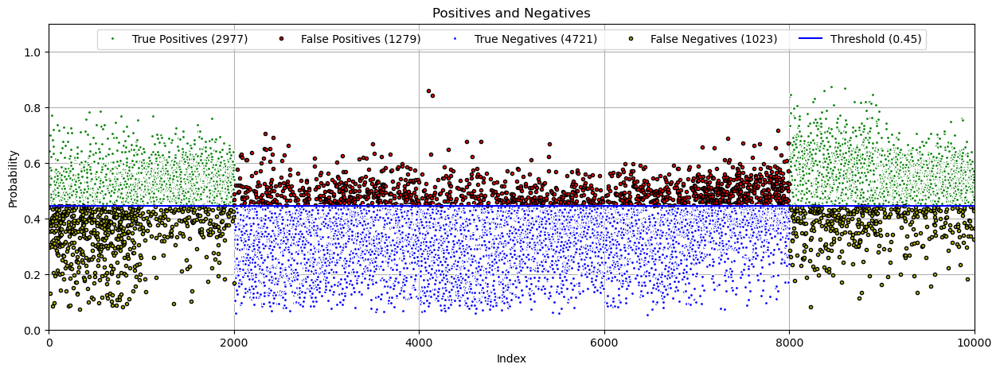

In [56]:
# X1np, X2np, y1b, y2b
rf = RandomForestClassifier(n_estimators = 350, 
                            max_depth = 45,
                            random_state = 42, 
                            n_jobs=5).fit(X1np, y1b)
parameters = {
    'grid_search': False,
    'n_estimators': np.array([350, 400, 450]),
    'max_depth': np.array([35, 40, 45])
}

name='RandomForestNormalizedPCA'
classifier_metrics[name] = model_process(rf, parameters, X1np, 
                                         y1b, X2np, 
                                         y2b, cv=2, scoring='f1', 
                                         name=name, pca=True)

### 4.2 KNN Classifier

Model Fine-Tuning and Testing Methodologies
Parameters for knnNormalizedPCA: {'algorithm': 'auto', 'leaf_size': 30, 'metric': 'minkowski', 'metric_params': None, 'n_jobs': 5, 'n_neighbors': 12, 'p': 2, 'weights': 'uniform'}

3. Model Calibration
Best F1 score: 0.59 | Best threshold: 0.50
Best error: 3355.00 | Best threshold: 0.58


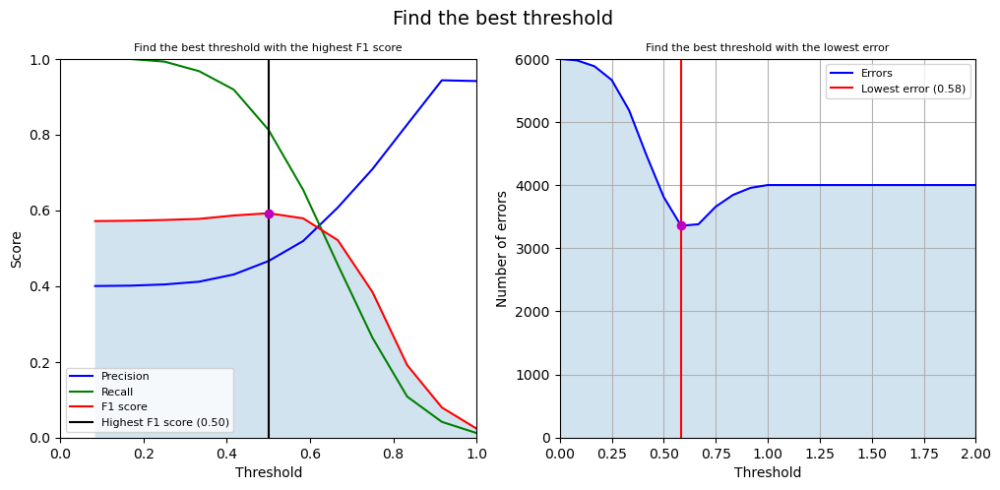

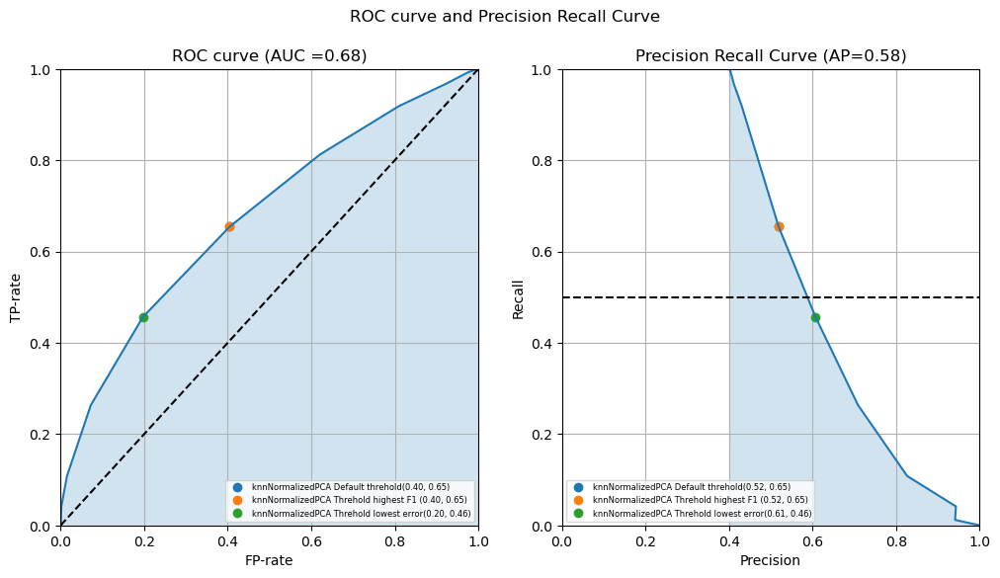


4. Model Evaluation metrics with best thresholds


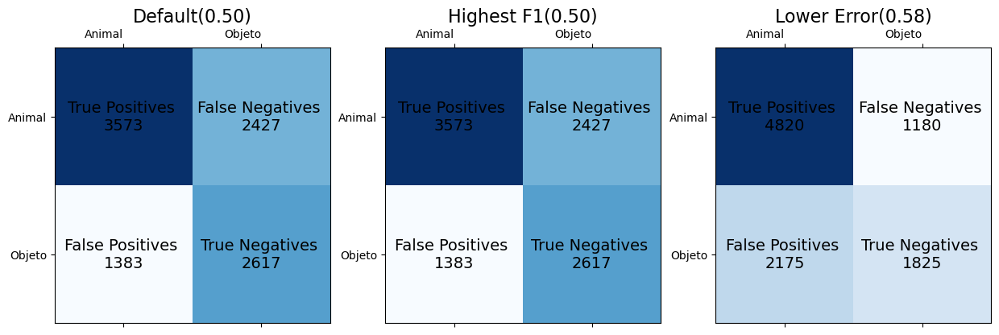

Classification_report:


c:\Users\ruben\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)


              precision    recall  f1-score   support

           0       0.72      0.60      0.65      6000
           1       0.52      0.65      0.58      4000

    accuracy                           0.62     10000
   macro avg       0.62      0.62      0.62     10000
weighted avg       0.64      0.62      0.62     10000

|                   |   Accuracy |   Precision |   Recall |   F1-Score |   Errors |   TN Rate |   FP Rate |
|:------------------|-----------:|------------:|---------:|-----------:|---------:|----------:|----------:|
| Default(0.50)     |       0.62 |         0.6 |     0.72 |       0.65 |     3810 |      0.52 |      0.48 |
| Highest F1(0.50)  |       0.62 |         0.6 |     0.72 |       0.65 |     3810 |      0.52 |      0.48 |
| Lower Error(0.58) |       0.66 |         0.8 |     0.69 |       0.74 |     3355 |      0.61 |      0.39 |
type(metric)= <class 'pandas.core.frame.DataFrame'>
Escolha do melhor threshold: 0.5


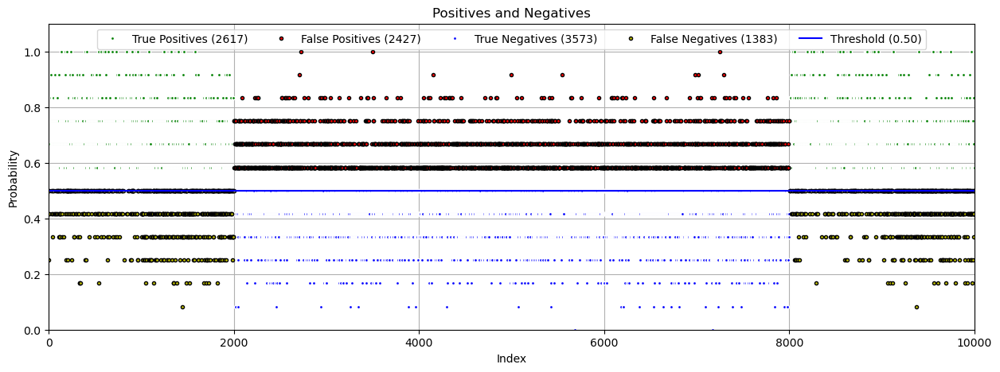

In [57]:
# X1np, X2np, y1b, y2b

knn = KNeighborsClassifier(n_neighbors=12, n_jobs=5).fit(X1np, y1b)
parameters={
    'grid_search': False,
    'n_neighbors' : np.array([12, 14, 16]),
}

name='knnNormalizedPCA'
classifier_metrics[name] = model_process(knn, parameters, X1np,
                                         y1b, X2np,
                                         y2b, cv=2, scoring='f1', 
                                         name=name, pca=True)

### 4.3 Model Comparison and Selection

In [58]:
classifier_metrics.keys()

dict_keys(['RandomForest', 'knn', 'RandomForestNormalized', 'knnNormalized', 'RandomForestPCA', 'knnPCA', 'RandomForestNormalizedPCA', 'knnNormalizedPCA'])

Confusion matrix do classificador Default threhold no limite 0.50: 
 [[5348  652]
 [1309 2691]]
Confusion matrix do classificador Threhold highest F1  no limite 0.42: 
 [[4831 1169]
 [ 832 3168]]
Confusion matrix do classificador Threhold lowest error no limite 0.46: 
 [[5147  853]
 [1072 2928]]
Confusion matrix do classificador Default threhold no limite 0.50: 
 [[5299  701]
 [1775 2225]]
Confusion matrix do classificador Threhold highest F1  no limite 0.42: 
 [[4976 1024]
 [1477 2523]]
Confusion matrix do classificador Threhold lowest error no limite 0.50: 
 [[5299  701]
 [1775 2225]]
Confusion matrix do classificador Default threhold no limite 0.50: 
 [[5348  652]
 [1309 2691]]
Confusion matrix do classificador Threhold highest F1  no limite 0.42: 
 [[4831 1169]
 [ 832 3168]]
Confusion matrix do classificador Threhold lowest error no limite 0.46: 
 [[5147  853]
 [1072 2928]]
Confusion matrix do classificador Default threhold no limite 0.50: 
 [[5322  678]
 [1773 2227]]
Confusion mat

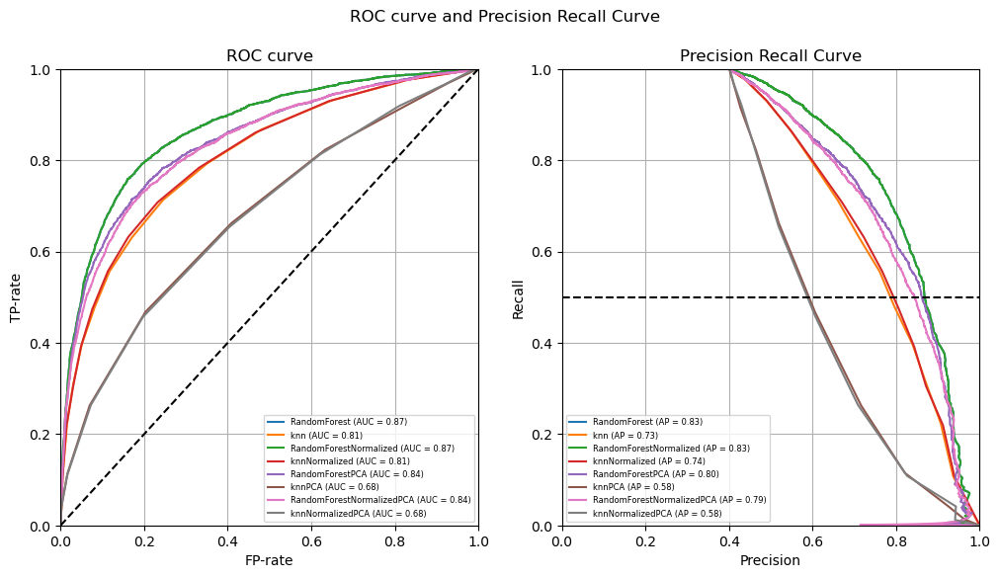

In [59]:
plot_roc_pr_from_dict(classifier_metrics, y2b, points=False)

In [60]:
cols = ['roc_auc', 'average_precision', 'Accuracy', 'Errors', 'F1-Score', 'FP Rate', 'Precision', 'Recall', 'TN Rate']
print_summary(classifier_metrics, cols)

|                           |   roc_auc |   average_precision | Accuracy                       | Errors                     | F1-Score                       | FP Rate                       | Precision                       | Recall                       | TN Rate                       |
|:--------------------------|----------:|--------------------:|:-------------------------------|:---------------------------|:-------------------------------|:------------------------------|:--------------------------------|:-----------------------------|:------------------------------|
| RandomForest              |  0.869845 |            0.825527 | Default(0.50)        0.80      | Default(0.50)        1961  | Default(0.50)        0.85      | Default(0.50)        0.20     | Default(0.50)        0.89       | Default(0.50)        0.80    | Default(0.50)        0.80     |
|                           |           |                     | Highest F1(0.42)     0.80      | Highest F1(0.42)     2001  | Highest F1

# Multiclass classification problem

#### Funcoes auxiliares de multiclasse

In [26]:
import numpy as np
import numpy.random as rnd
import pandas as pd
import itertools
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, classification_report,roc_curve
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.metrics import roc_auc_score, precision_recall_curve
from sklearn.metrics import average_precision_score
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import GridSearchCV, cross_val_score, cross_val_predict, train_test_split

from sklearn.neural_network import MLPClassifier

def ajuste_hiperparametros(model, X_train, y_train, X_val, y_val, cv=2):
    # Ajuste de hiperparâmetros com GridSearchCV
    grid_search = GridSearchCV(model, {
        'hidden_layer_sizes': [(256, 128), (256, 128), (256, 128)],
        'learning_rate_init': [0.0001, 0.001, 0.01, 0.1],
    }, cv=cv).fit(X_train, y_train)
    print("Best estimator:", grid_search.best_estimator_)
    best_model = grid_search.best_estimator_.fit(X_train, y_train)
    return best_model

def plot_history(model, y2, y_predV):

    idx = np.argsort(y2)
    y2 = y2[idx]
    # Mostrar a curva de loss ao longo das iterações e um grafico para comparar os valores preditos com os valores reais numa figura com 2 subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))
    fig.suptitle('Loss and Predicted vs True', fontsize=16)

    ax1.plot(model.loss_curve_)
    # ax1.plot(model.validation_scores_)
    # ax1.plot(model.train_scores_)
    ax1.set_title('Loss for each epoch')
    ax1.set_xlabel('Epoch')
    ax1.set_ylabel('Loss')
    ax1.legend(['Training (Loss Curve)', 'Validation Scores'], loc='upper right')

    
    ax2.plot(model.validation_scores_, label='Validation Scores')
    ax2.set_title('Loss for each epoch')
    ax2.set_xlabel('Epoch')
    ax2.set_ylabel('Loss')
    ax2.set_ylim(0, 1)
    ax2.legend(loc='upper right')
    plt.tight_layout()
    plt.show()

    # plot y_predV vs y2
    fig, ax = plt.subplots(figsize=(10, 5))
    plt.plot(y_predV, ".", label='Predicted')
    plt.plot(y2, label='True Class')
    plt.title('Predicted vs True')
    plt.xlabel('Data')
    plt.ylabel('Class')
    plt.xlim(-100, 10100)
    plt.ylim(-1, 10)
    plt.legend(loc='upper center', bbox_to_anchor=(0.5, 1), ncol=2, fontsize=8 )
    plt.tight_layout()
    plt.show()

def show_metrics(cm, y_pred, y_val):   
    num_erros = cm.sum() - np.trace(cm) # Calcular o número total de erros
    label_dict = {
        0: '0 airplane',
        1: '1 automobile',
        2: '2 bird',
        3: '3 cat',
        4: '4 deer',
        5: '5 dog',
        6: '6 frog',
        7: '7 horse',
        8: '8 ship',
        9: '9 truck'
    }

    # Calcular o número de erros por classe
    erros_por_classe = []
    for i in range(cm.shape[0]):
        erros_por_classe.append(sum(cm[i,:]) - cm[i,i])

    report = classification_report(y_val, 
                                y_pred, 
                                output_dict=True, target_names=label_dict)

    df_report = pd.DataFrame(report).transpose()
    df_report['support'] = df_report['support'].astype(int)
    df_report['Erros(classe)'] = erros_por_classe + [0] * (len(report) - len(erros_por_classe))
    df_report['Erros(classe)'] = df_report['Erros(classe)'].astype(int)
    df_report['% acc (classe)'] = (1 - df_report['Erros(classe)'] / df_report['support']) * 100
    df_report['% acc (classe)'] = df_report['% acc (classe)'].round(2)
    df_report[['precision', 'recall', 'f1-score']] = df_report[['precision', 'recall', 'f1-score']].round(3)
    max_idx = np.argmax(cm - np.diag(np.diag(cm)), axis=1) 
    df_report['Confundida com'] = [f"{label_dict[i]}" for i in max_idx]+ [0] * (len(report) - len(erros_por_classe))
    df_report = df_report.rename_axis('Classes').reset_index()
    df_report['Classes'] = df_report['Classes'].map(label_dict)
    df_report = df_report.drop(index=[10, 11, 12])

    # Mostrar as métricas
    perc_num_erros = num_erros / len(y_val)
    acc = accuracy_score(y_val, y_pred)
    recall = recall_score(y_val, y_pred, average='macro')
    f1 = f1_score(y_val, y_pred, average='macro')
    precision = precision_score(y_val, y_pred, average='macro')

    print("Mostrar as métricas:")

    print(f"Total de erros: {num_erros} | % Erros: {perc_num_erros} | Accuracy: {acc:.2f}")
    print(f"Recall: {recall:.2f} | F1: {f1:.2f} | Precision: {precision:.2f}")

    print("Relatório de classificação (Validacao):")
    print(df_report.to_markdown())
    return {'num_erros': num_erros, 'perc_num_erros': perc_num_erros, 
            'acc': acc, 'recall': recall, 
            'f1': f1, 'precision': precision}

def plot_confusion_matrixs(cm, classes, normalize=False,
    title="Confusion matrix", cmap=plt.cm.Blues ):
    cmD = cm - np.diag(np.diag(cm))
    # normalização dos dados
    cmN = cm.astype("float") / cm.sum(axis=1)[:, np.newaxis]

    # criação dos subplots
    fig, axs = plt.subplots(1, 2, figsize=(10, 5))
    fig.suptitle(title, fontsize=16)

    # plotagem do primeiro subplot
    axs[0].imshow(cm, interpolation="none", cmap=cmap)
    axs[0].set_title("Confusion matrix")
    axs[0].set_xlabel("Predicted label")
    axs[0].set_ylabel("True label")
    tick_marks = np.arange(len(classes))
    axs[0].set_xticks(tick_marks)
    axs[0].set_xticklabels(classes, ha="right")
    axs[0].set_yticks(tick_marks)
    axs[0].set_yticklabels(classes)
    thresh = cm.max() / 2.0
    threshN = cmN.max() / 2.0
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        axs[0].text(j,i,format(cm[i, j], "d"),horizontalalignment="center", verticalalignment="bottom",
                color="white" if cm[i, j] > thresh else "black", fontsize=9)
        axs[0].text(j,i,format(cmN[i, j]* 100, ".0f")  + "%",
                horizontalalignment="center", verticalalignment="top",
                color="white" if cmN[i, j] > threshN else "black", fontsize=6)

    # plotagem do segundo subplot
    cmN = cmD.astype("float") / cmD.sum(axis=1)[:, np.newaxis]
    axs[1].imshow(cmN, interpolation="none", cmap=cmap)
    axs[1].imshow(cmD, interpolation="none", cmap=cmap)
    axs[1].set_title("Confusion matrix without diagonal elements")
    axs[1].set_xlabel("Predicted label")
    axs[1].set_ylabel("True label")
    tick_marks = np.arange(len(classes))
    axs[1].set_xticks(tick_marks)
    axs[1].set_xticklabels(classes, ha="right")
    axs[1].set_yticks(tick_marks)
    axs[1].set_yticklabels(classes)
    thresh = cmD.max() / 2.0
    threshN = cmN.max() / 2.0
    for i, j in itertools.product(range(cmD.shape[0]), range(cmD.shape[1])):
        axs[1].text(j,i,format(cmD[i, j], "d"),horizontalalignment="center", verticalalignment="bottom",
                color="white" if cmD[i, j] > thresh else "black", fontsize=9)
        axs[1].text(j,i,format(cmN[i, j]* 100, ".0f")  + "%",
                horizontalalignment="center", verticalalignment="top",
                color="white" if cmN[i, j] > threshN else "black", fontsize=6)
    

    # ajuste de layout
    plt.tight_layout()

    # exibição do gráfico
    plt.show()

def plot_roc_curve_multiclasse(y_valb, y_score):
    
    # Plot of a ROC curve for a specific class
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    lw = 1
    precision = dict()
    recall = dict()
    average_precision = dict()

    # Plot ROC and Precision-Recall curves for each class in the same figure
    fig, axs = plt.subplots(ncols=2, figsize=(12, 5))

    # Plot ROC curve for each class
    for i in range(10):
        fpr[i], tpr[i], _ = roc_curve(y_valb[:, i], y_score[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])
        axs[0].plot(fpr[i], tpr[i], lw=lw, label='ROC curve of class {0} (AUC = {1:0.2f})'
                                    ''.format(i, roc_auc[i]))
        # Plot a marker on the ROC curve at the operating point (FPR, TPR) for the current class
        # argmax - highest_F1_score
        axs[0].scatter(fpr[i][np.argmax(tpr[i] - fpr[i])], tpr[i][np.argmax(tpr[i] - fpr[i])], s=20,
                    label=f'Operating point of class {i}')
    axs[0].plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
    axs[0].set_xlim([0.0, 1.0])
    axs[0].set_ylim([0.0, 1.05])
    axs[0].set_xlabel('False Positive Rate')
    axs[0].set_ylabel('True Positive Rate')
    axs[0].set_title('Receiver operating characteristic example')
    axs[0].legend(loc="lower right", fontsize=6)

    # Plot Precision-Recall curve for each class
    for i in range(10):
        precision[i], recall[i], _ = precision_recall_curve(y_valb[:, i], y_score[:, i])
        average_precision[i] = average_precision_score(y_valb[:, i], y_score[:, i])
        axs[1].plot(recall[i], precision[i], lw=lw, label='Precision-Recall curve of class {0} (area = {1:0.2f})'
                                                    ''.format(i, average_precision[i]))
        # Plot a marker on the Precision-Recall curve at the operating point (FPR, TPR) for the current class
        # argmax - highest_F1_score
        axs[1].scatter(recall[i][np.argmax(precision[i])], precision[i][np.argmax(precision[i])], s=20,
                    label=f'Operating point of class {i}')

    axs[1].plot([0, 1], [0.5, 0.5], color='navy', linestyle='--')
    axs[1].set_xlim([0.0, 1.0])
    axs[1].set_ylim([0.0, 1.05])
    axs[1].set_xlabel('Recall')
    axs[1].set_ylabel('Precision')
    axs[1].set_title('Precision-Recall example')
    axs[1].legend(loc="lower left", fontsize=6)

    plt.show()

def multiclass_process(MLP, X_val, y_val, random=False):
        
    # X_val, y_val, y2, y_test
    y_predV = MLP.predict(X_val)
    cm = confusion_matrix(y_val, y_predV)

    # loss curve for training and validation
    if not random:
        # plot_history(MLP, y_val, y_predV, random=True)
        plot_history(MLP, y_val, y_predV)

    # predict and show metrics
    metrics = show_metrics(cm, y_predV, y_val)

    # plot confusion matrix
    plot_confusion_matrixs(cm, 
                        classes = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9],
                        normalize=True, title="Matriz de confusão")

    from sklearn.preprocessing import label_binarize

    y_score = MLP.predict_proba(X_val)
    y_valb = label_binarize(y_val, classes=[0, 1, 2, 3, 4, 5, 6, 7, 8, 9])

    # Compute ROC curve and ROC area for each class, and the points for the micro-average ROC curve
    plot_roc_curve_multiclasse(y_valb, y_score)

    return metrics

## 1. Multiclass classification

In [18]:
classifier_metricsMulticlasse = {}

#### Treino, ajuste do modelo e analise dos resultados

In [19]:
rf = RandomForestClassifier(n_estimators= 350, 
                            max_depth= 45,
                            random_state=42, 
                            n_jobs=N_JOBS).fit(X1, y1)

In [20]:
# X1, y1, X2, y2 

MLP = MLPClassifier( hidden_layer_sizes=(256, 256), verbose=True,
                      activation='tanh', solver='sgd', max_iter=100,
                      alpha=0.001, early_stopping=True)

# model = ajuste_hiperparametros(model, X_train, y_train, X_val, y_val, cv=2)
history = MLP.fit(X1, y1) #100 epochs - 39min

print("X:", X1.shape, X2.shape)
print("y:", y1.shape, y2.shape)

Iteration 1, loss = 2.17782137
Validation score: 0.258200
Iteration 2, loss = 2.07501607
Validation score: 0.279000
Iteration 3, loss = 2.04076232
Validation score: 0.287400
Iteration 4, loss = 2.02152030
Validation score: 0.284000
Iteration 5, loss = 2.00822051
Validation score: 0.293800
Iteration 6, loss = 1.99675114
Validation score: 0.306000
Iteration 7, loss = 1.98658218
Validation score: 0.310800
Iteration 8, loss = 1.97663306
Validation score: 0.307000
Iteration 9, loss = 1.96849376
Validation score: 0.308000
Iteration 10, loss = 1.96002917
Validation score: 0.311600
Iteration 11, loss = 1.95061921
Validation score: 0.315200
Iteration 12, loss = 1.94196514
Validation score: 0.320400
Iteration 13, loss = 1.93288767
Validation score: 0.325400
Iteration 14, loss = 1.92455680
Validation score: 0.326000
Iteration 15, loss = 1.91576959
Validation score: 0.327800
Iteration 16, loss = 1.90695528
Validation score: 0.326800
Iteration 17, loss = 1.89889526
Validation score: 0.326200
Iterat

c:\Users\ruben\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


#### Analise dos resultados no conjunto de teste

Mostrar as métricas:
Total de erros: 5669 | % Erros: 0.5669 | Accuracy: 0.43
Recall: 0.43 | F1: 0.43 | Precision: 0.43
Relatório de classificação (Validacao):
|    | Classes      |   precision |   recall |   f1-score |   support |   Erros(classe) |   % acc (classe) | Confundida com   |
|---:|:-------------|------------:|---------:|-----------:|----------:|----------------:|-----------------:|:-----------------|
|  0 | 0 airplane   |       0.494 |    0.43  |      0.46  |      1000 |             570 |             43   | 8 ship           |
|  1 | 1 automobile |       0.488 |    0.503 |      0.495 |      1000 |             497 |             50.3 | 9 truck          |
|  2 | 2 bird       |       0.374 |    0.364 |      0.369 |      1000 |             636 |             36.4 | 4 deer           |
|  3 | 3 cat        |       0.347 |    0.245 |      0.287 |      1000 |             755 |             24.5 | 5 dog            |
|  4 | 4 deer       |       0.356 |    0.381 |      0.368 |      1000 |  

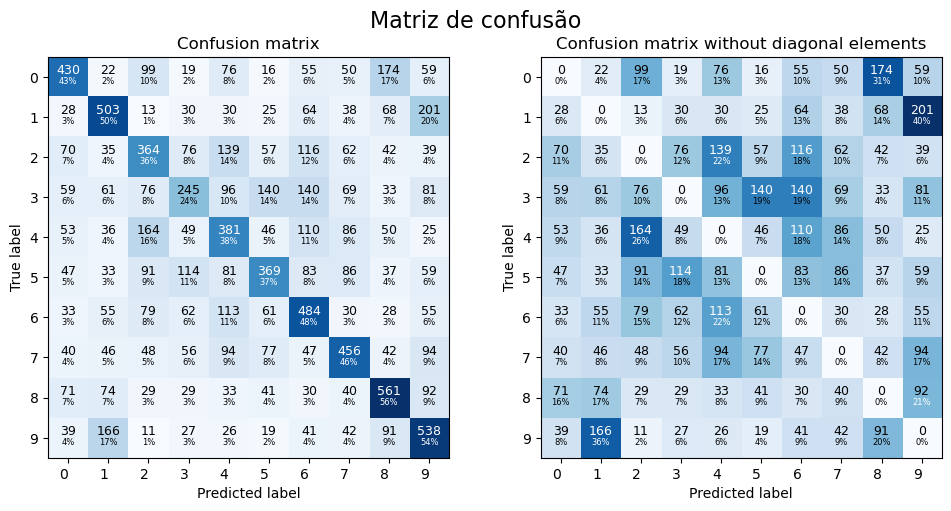

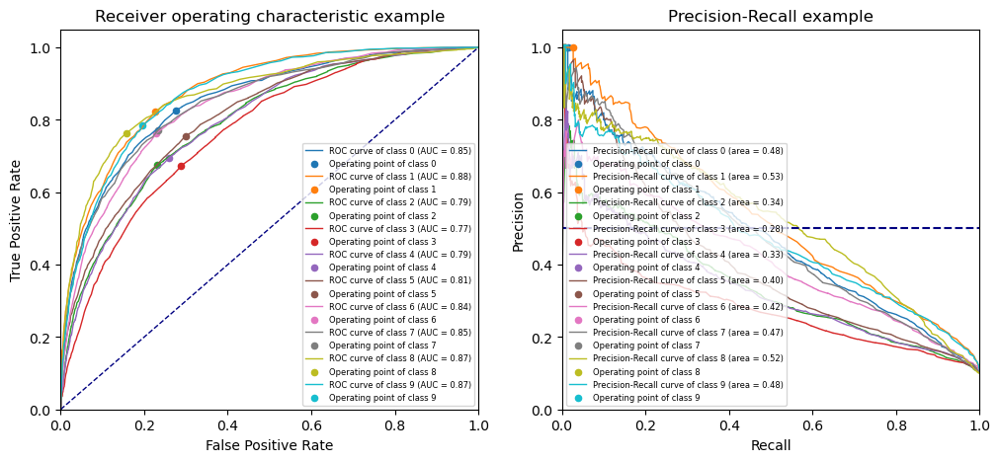

In [24]:
classifier_metricsMulticlasse['Random Forest'] = multiclass_process(rf, X2, y2, random=True)

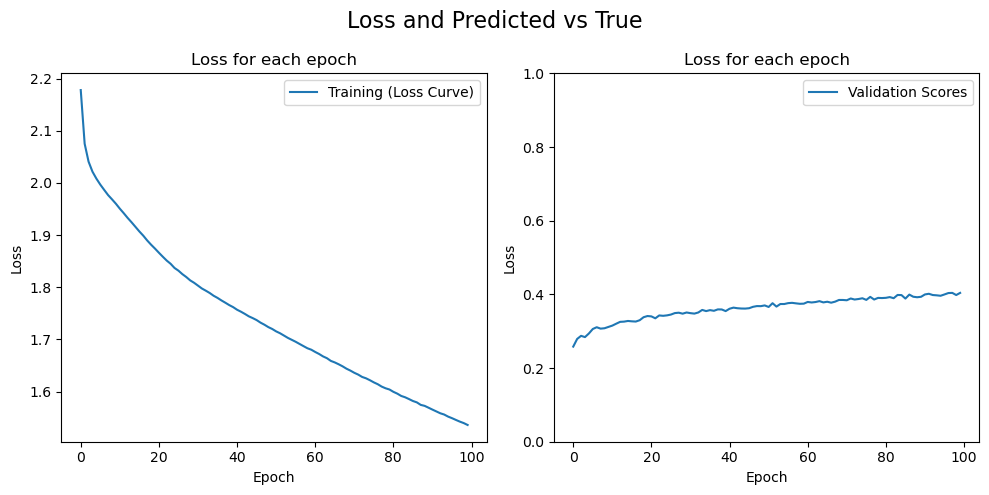

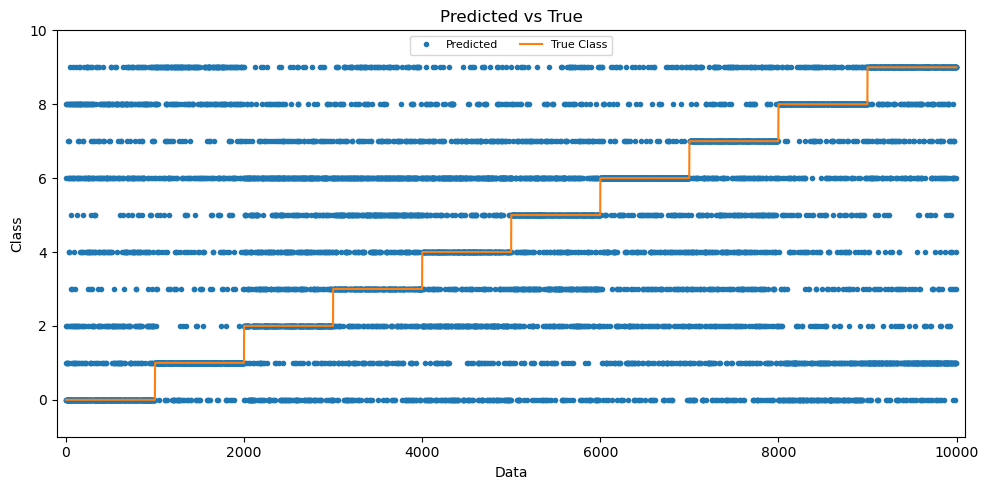

Mostrar as métricas:
Total de erros: 5897 | % Erros: 0.5897 | Accuracy: 0.41
Recall: 0.41 | F1: 0.41 | Precision: 0.41
Relatório de classificação (Validacao):
|    | Classes      |   precision |   recall |   f1-score |   support |   Erros(classe) |   % acc (classe) | Confundida com   |
|---:|:-------------|------------:|---------:|-----------:|----------:|----------------:|-----------------:|:-----------------|
|  0 | 0 airplane   |       0.424 |    0.426 |      0.425 |      1000 |             574 |             42.6 | 8 ship           |
|  1 | 1 automobile |       0.442 |    0.568 |      0.497 |      1000 |             432 |             56.8 | 9 truck          |
|  2 | 2 bird       |       0.34  |    0.297 |      0.317 |      1000 |             703 |             29.7 | 6 frog           |
|  3 | 3 cat        |       0.321 |    0.234 |      0.271 |      1000 |             766 |             23.4 | 6 frog           |
|  4 | 4 deer       |       0.317 |    0.267 |      0.29  |      1000 |  

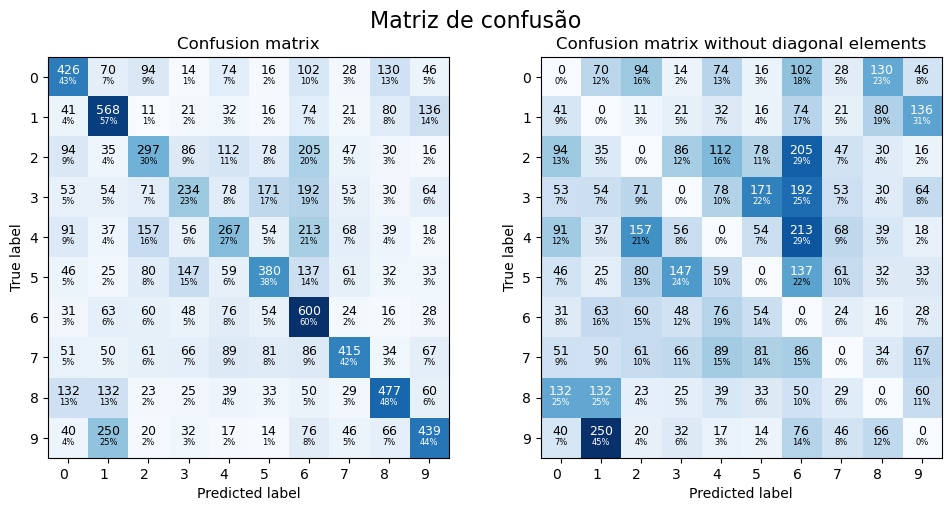

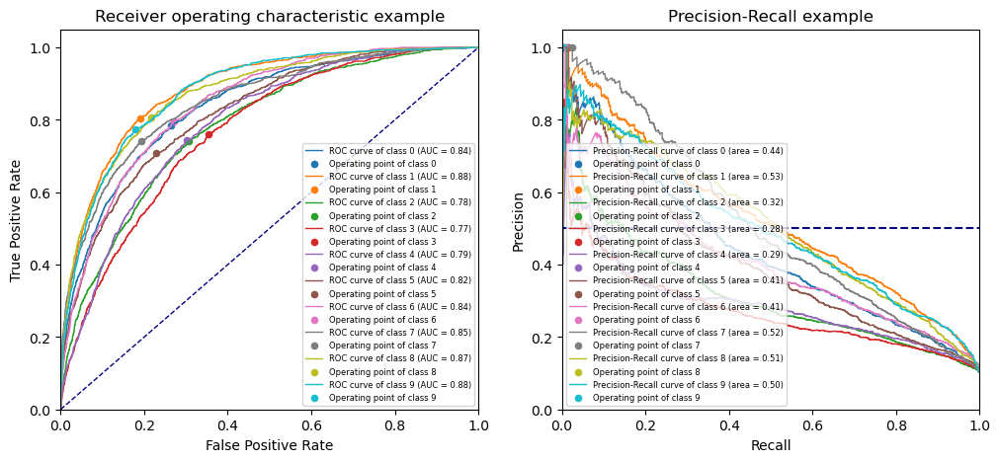

In [21]:
# Analizar o desempenho do modelo no conjunto de teste
name = 'MLP'
classifier_metricsMulticlasse[name] = multiclass_process(MLP, X2, y2)

In [28]:
print_summary(classifier_metricsMulticlasse)

|               |   num_erros |   perc_num_erros |    acc |   recall |       f1 |   precision |
|:--------------|------------:|-----------------:|-------:|---------:|---------:|------------:|
| MLP           |        5897 |           0.5897 | 0.4103 |   0.4103 | 0.405595 |    0.413194 |
| Random Forest |        5669 |           0.5669 | 0.4331 |   0.4331 | 0.429715 |    0.431261 |
|:--------------|
| MLP           |
| Random Forest |


Olhando para os graficos da loss por cada epoca podemos ver que se deixasemos o classificador trabalhar que o erro e os acertos do conjunto de validacao poderiam melhorar, mas como o tempo de computacao e elevado, decidimos parar o treino do classificador.

Ao observarmos as curvas roc e da precison-recall de cada classe do classificador podemos conlcuir que as classes mais bem classificadas foram as classe 1, 9 e 8 respetivamente por ordem, quando olhamos para as metrica da ca area de cada curva, dand uma ideia de como o classificador se esta a comportar para cada classe.


#### Erro analysis 

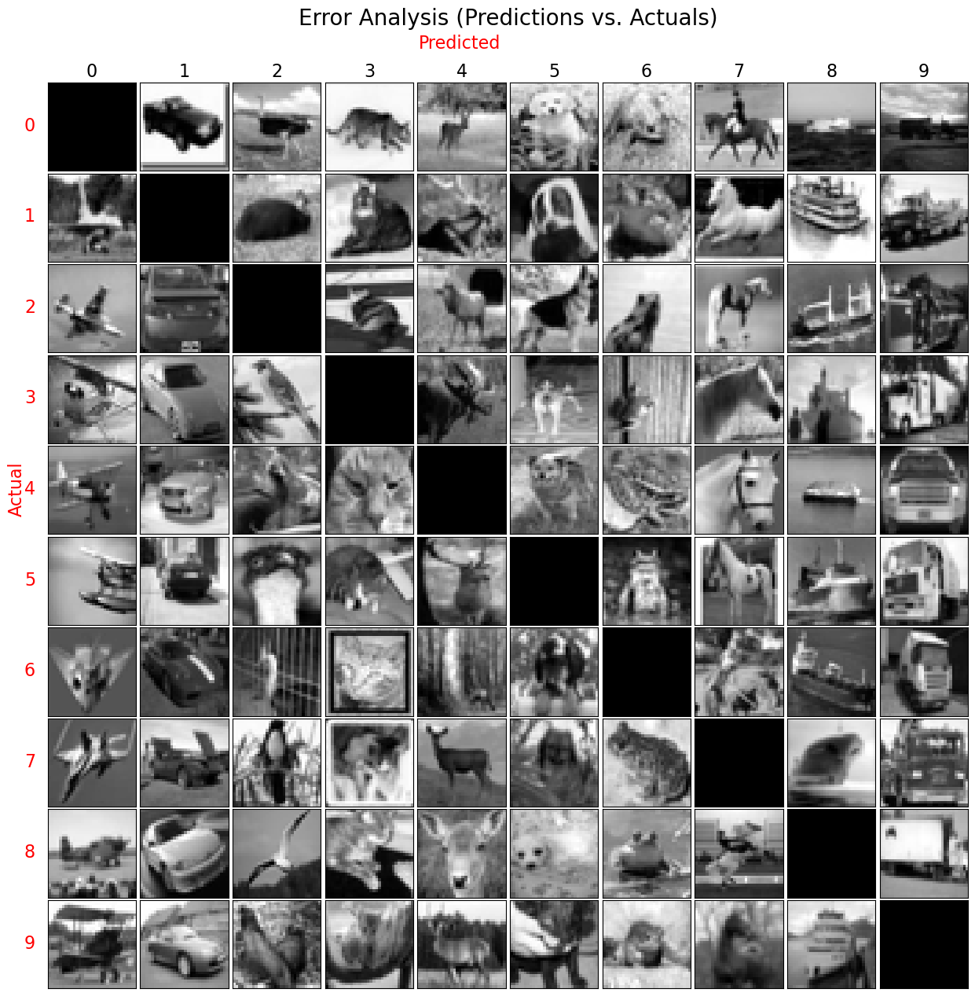

In [26]:
# Model interpretation and visualization of the results (classification)
def show_classification_multiclasse(y2, y_scoreProb, X2, 
                                    classes=['0', '1', '2', '3', '4', '5', '6', '7', '8', '9']):
    # print(y2.shape, y_scoreProb.shape, X2.shape)
    y_pred = MLP.predict(X2)

    y, x = 10, 10
    fig, axs = plt.subplots(y, x, figsize=(12, 16))
    fig.subplots_adjust(hspace=0.03, wspace=0.005, top=0.92, bottom=0.2, left=0.01, right=0.99)
    fig.suptitle('Error Analysis (Predictions vs. Actuals)', fontsize=20)
    c = 0
    l = []
    D = {}
    # add label Predicted and Actual
    
    for i in range(y):
        for j in range(x):

            # add label Predicted and Actual
            if i == 4 and j == 0:
                axs[i, j].text(-15, 15, 'Actual', fontsize=16, ha='left', va='center', color='red', rotation=90)

            if i == 0 and j == 4:
                axs[i, j].text(0, -15, 'Predicted', fontsize=16, ha='left', va='center', color='red')

            if i == 0:
                axs[i, j].set_title(classes[j], fontsize=16)
                axs[i, j].set_xticks([])
            
            if j == 0:
                # axs[i, j].text(-5, 15, classes[c], fontsize=16, ha='right', va='center')#, color='red')
                axs[i, j].text(-5, 15, classes[c], fontsize=16, ha='right', va='center', color='red')
                
                c += 1
            # know the indexs of the errors
            misclassified_idx = np.where((y_pred != y2) & (y2 == j) & (y_pred == i))[0]
            # FalseNegativesOnly = np.where((y2 == i) & (y_pred != j))[0]

            D[j] = misclassified_idx

            if len(misclassified_idx) > 0:
                axs[i, j].imshow(X2[misclassified_idx[0]].reshape((32, 32)), cmap='gray')
            
            else:
                axs[i, j].imshow(np.ones((32, 32)), cmap='gray')

    for ax in axs.flat:
        ax.set_xticks([])
        ax.set_yticks([])
    plt.show()

    return D
    
y_pred = MLP.predict(X2)
y_scoreProb = MLP.predict_proba(X2)

c = ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']
D =show_classification_multiclasse(y2, y_scoreProb, X2)

In [27]:
print([ len(D[i]) for i in D.keys()])

[46, 167, 15, 62, 25, 34, 27, 70, 61, 0]


Com a tabela anterior podemos verificar alguns exemplos que cada classe foi mal classificada, e podemos verificar que algumas classes sao mais dificeis de classificar que outras, como por exemplo a classe 1, 2, 3 que sao as classes que o classificador tem mais dificuldade em classificar, pode se confudirem mais com as classes 9, 4 e 5.

## 2. Multiclass classification with Normalized Data

#### Transform the data with StandardScaler (0-1)

In [30]:
# X1, y1, X2, y2

# normalizar
X1n, X2n = normalize(X1, X2)

#### Treino, ajuste do modelo e analise dos resultados

In [31]:
rf = RandomForestClassifier(n_estimators= 350, 
                            max_depth= 45,
                            random_state=42, 
                            n_jobs=N_JOBS).fit(X1n, y1)

In [32]:
# X1N, y1, X2N, y2 
MLP = MLPClassifier( hidden_layer_sizes=(256, 256), verbose=True,
                      activation='tanh', solver='sgd', max_iter=100,
                      alpha=0.001, early_stopping=True)

# model = ajuste_hiperparametros(model, X_train, y_train, X_val, y_val, cv=2)
history = MLP.fit(X1n, y1) #44 epochs?

print("X:", X1n.shape, X2n.shape)
print("y:", y1.shape, y2.shape)

Iteration 1, loss = 2.14343483
Validation score: 0.275400
Iteration 2, loss = 2.03102170
Validation score: 0.289000
Iteration 3, loss = 1.99839057
Validation score: 0.298000
Iteration 4, loss = 1.97609658
Validation score: 0.306400
Iteration 5, loss = 1.95952989
Validation score: 0.308600
Iteration 6, loss = 1.94489643
Validation score: 0.312200
Iteration 7, loss = 1.93220908
Validation score: 0.311600
Iteration 8, loss = 1.92022069
Validation score: 0.315400
Iteration 9, loss = 1.90995575
Validation score: 0.320400
Iteration 10, loss = 1.89936898
Validation score: 0.319800
Iteration 11, loss = 1.88930624
Validation score: 0.324200
Iteration 12, loss = 1.87950985
Validation score: 0.325200
Iteration 13, loss = 1.87015505
Validation score: 0.327400
Iteration 14, loss = 1.86101624
Validation score: 0.325600
Iteration 15, loss = 1.85181205
Validation score: 0.328800
Iteration 16, loss = 1.84264306
Validation score: 0.331000
Iteration 17, loss = 1.83366676
Validation score: 0.331200
Iterat

#### Analise dos resultados no conjunto de teste

c:\Users\ruben\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ruben\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ruben\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ruben\anaconda3\lib\site-packages\sklearn\metr

Mostrar as métricas:
Total de erros: 8312 | % Erros: 0.8312 | Accuracy: 0.17
Recall: 0.17 | F1: 0.09 | Precision: 0.29
Relatório de classificação (Validacao):
|    | Classes      |   precision |   recall |   f1-score |   support |   Erros(classe) |   % acc (classe) | Confundida com   |
|---:|:-------------|------------:|---------:|-----------:|----------:|----------------:|-----------------:|:-----------------|
|  0 | 0 airplane   |       0.134 |    0.424 |      0.203 |      1000 |             576 |             42.4 | 8 ship           |
|  1 | 1 automobile |       0     |    0     |      0     |      1000 |            1000 |              0   | 2 bird           |
|  2 | 2 bird       |       0.143 |    0.589 |      0.23  |      1000 |             411 |             58.9 | 0 airplane       |
|  3 | 3 cat        |       0     |    0     |      0     |      1000 |            1000 |              0   | 2 bird           |
|  4 | 4 deer       |       0.073 |    0.044 |      0.055 |      1000 |  

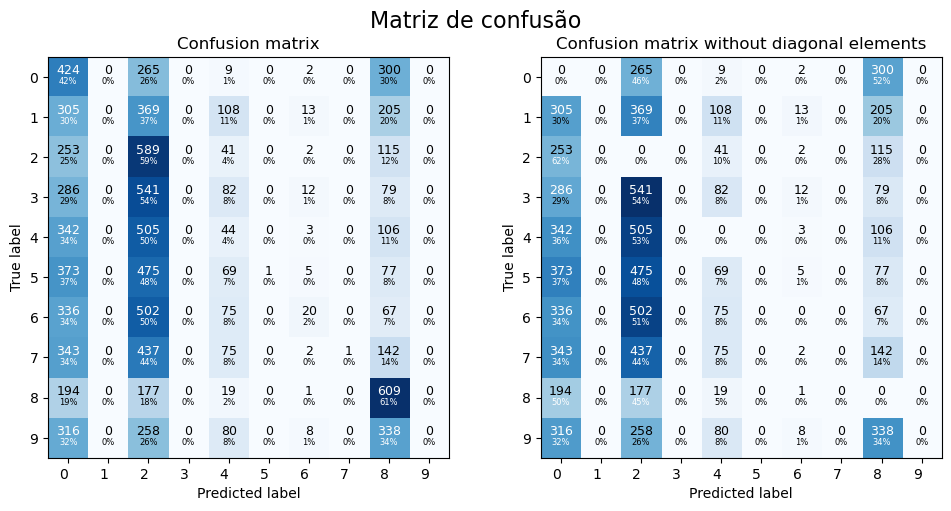

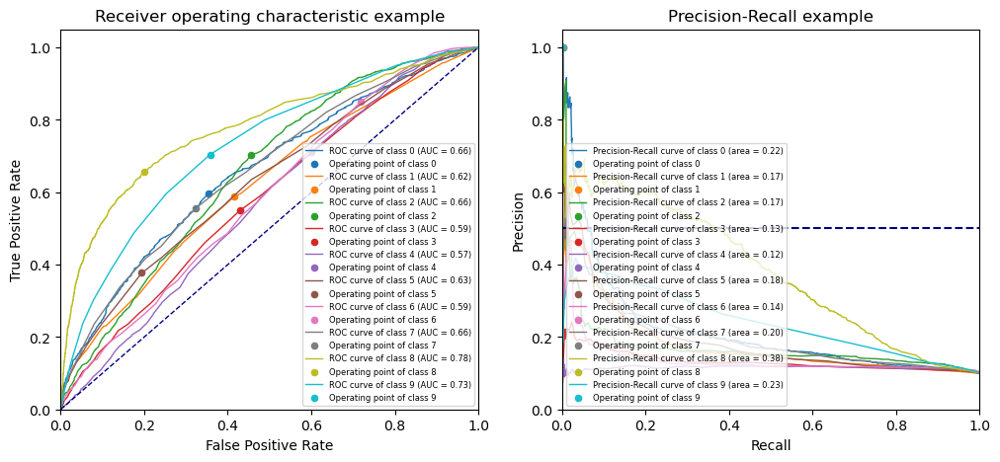

In [33]:
classifier_metricsMulticlasse['Random ForestNormalized'] = multiclass_process(rf, X2, y2, random=True)

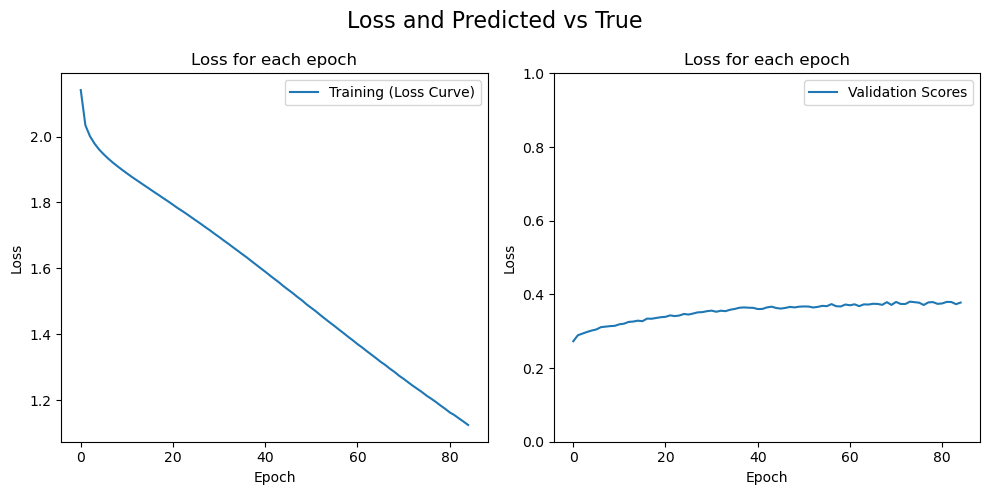

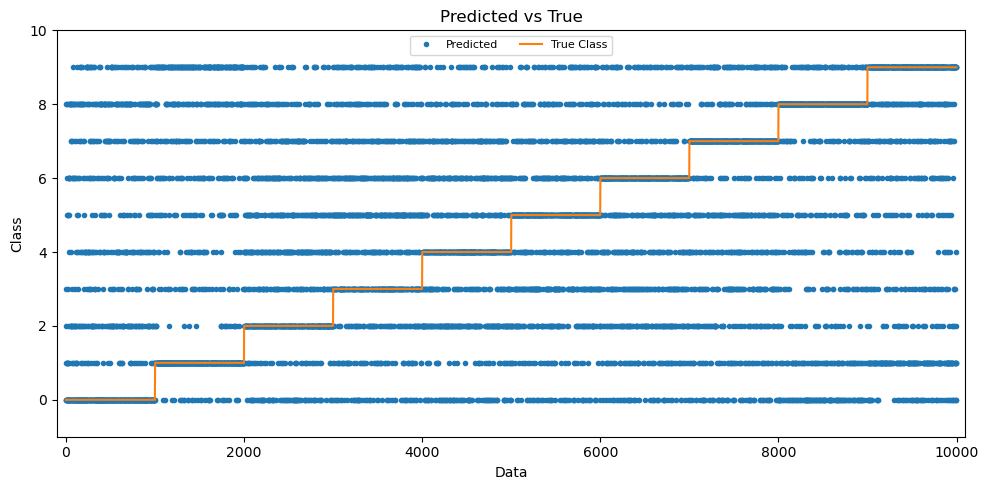

Mostrar as métricas:
Total de erros: 6280 | % Erros: 0.628 | Accuracy: 0.37
Recall: 0.37 | F1: 0.37 | Precision: 0.37
Relatório de classificação (Validacao):
|    | Classes      |   precision |   recall |   f1-score |   support |   Erros(classe) |   % acc (classe) | Confundida com   |
|---:|:-------------|------------:|---------:|-----------:|----------:|----------------:|-----------------:|:-----------------|
|  0 | 0 airplane   |       0.415 |    0.404 |      0.41  |      1000 |             596 |             40.4 | 8 ship           |
|  1 | 1 automobile |       0.448 |    0.457 |      0.452 |      1000 |             543 |             45.7 | 9 truck          |
|  2 | 2 bird       |       0.307 |    0.295 |      0.301 |      1000 |             705 |             29.5 | 4 deer           |
|  3 | 3 cat        |       0.255 |    0.21  |      0.231 |      1000 |             790 |             21   | 5 dog            |
|  4 | 4 deer       |       0.318 |    0.292 |      0.305 |      1000 |   

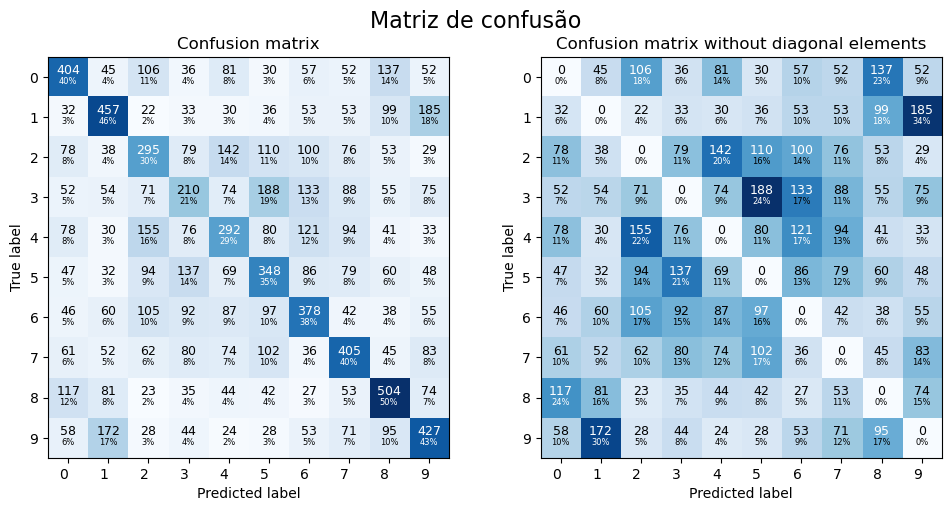

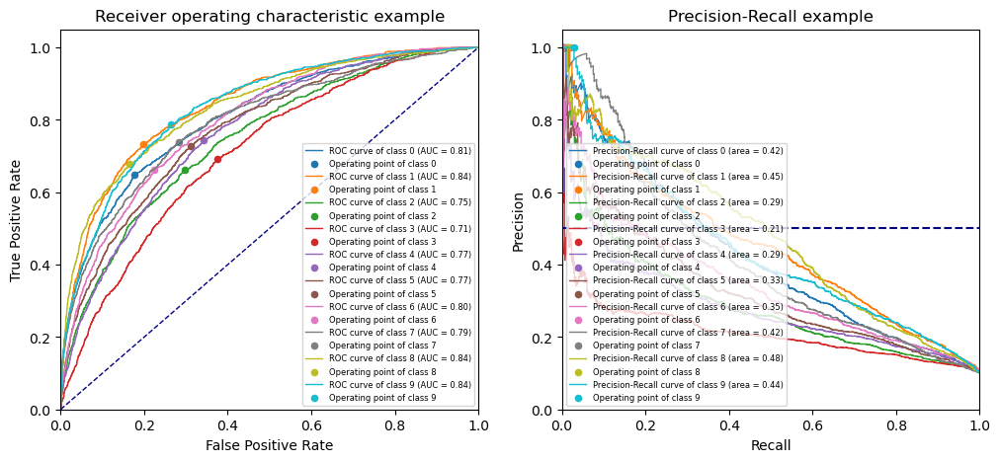

In [30]:
# X1N, y1, X2N, y2
name = 'MLPNormalized'
classifier_metricsMulticlasse[name] = multiclass_process(MLP, X2n, y2)

In [32]:
print_summary(classifier_metricsMulticlasse)

|               |   num_erros |   perc_num_erros |    acc |   recall |       f1 |   precision |
|:--------------|------------:|-----------------:|-------:|---------:|---------:|------------:|
| MLP           |        5972 |           0.5972 | 0.4028 |   0.4028 | 0.399267 |    0.40303  |
| MLPNormalized |        6280 |           0.628  | 0.372  |   0.372  | 0.369602 |    0.368321 |
|:--------------|
| MLP           |
| MLPNormalized |


#### Erro analysis

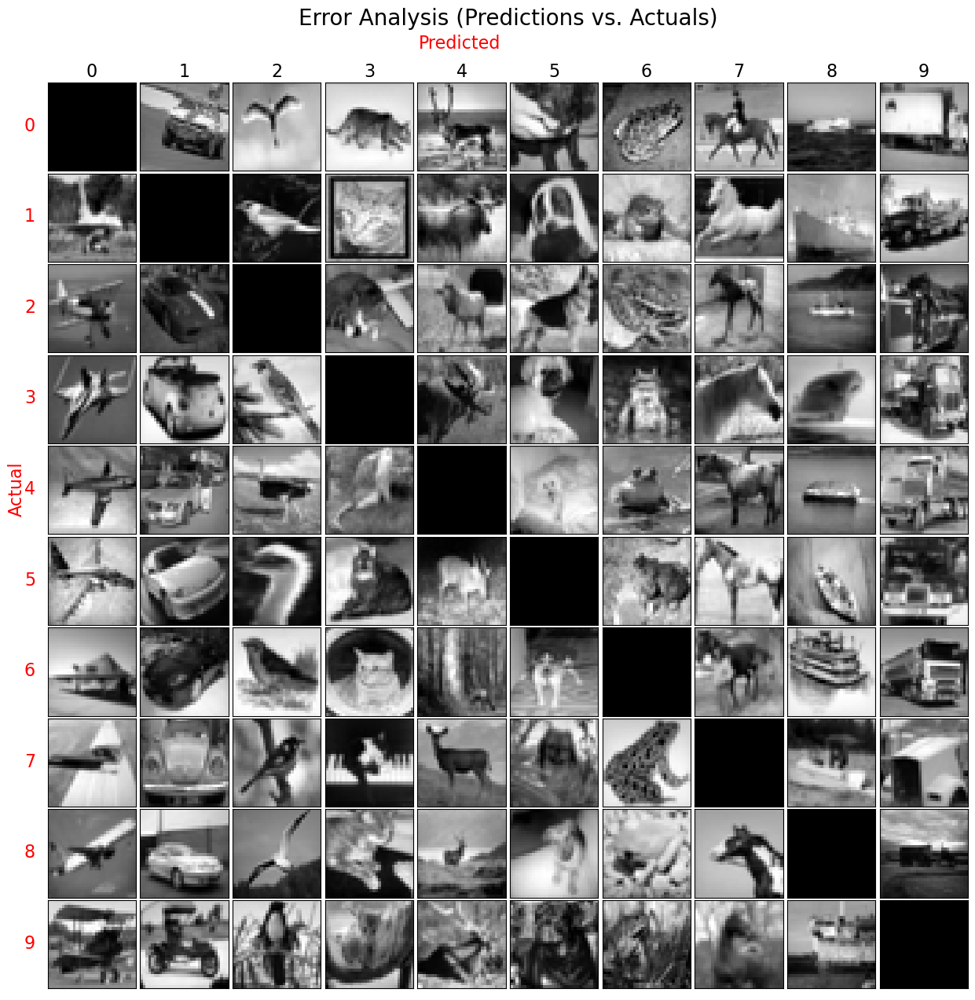

[52, 185, 29, 75, 33, 48, 55, 83, 74, 0]


In [31]:
D = show_classification_multiclasse(y2, y_scoreProb, X2n)
print([ len(D[i]) for i in D.keys()])

Olhando para os graficos da loss por cada epoca podemos ver que se deixasemos o classificador trabalhar que o erro e os acertos do conjunto de validacao poderiam melhorar, mas como o tempo de computacao e elevado, decidimos parar o treino do classificador.

Ao observarmos as curvas roc e da precison-recall de cada classe do classificador podemos conlcuir que as classes mais bem classificadas foram as classe 1, 9 e 8 respetivamente por ordem, quando olhamos para as metrica da area de cada curva, dand uma ideia de como o classificador se esta a comportar para cada classe.

Ao olhar para a tabela classifier_metricsMulticlasse, podemos verificar que as metricas de accuracy, precision, recall e f1-score pioraram em relacao ao classificador sem normalizacao dos dados.

## 3. Multiclass classification with PCA

#### Transform the data with PCA

In [ ]:
import numpy as np
# n_components = np.arange(0, 400, 40)
# models = [PCA(n_components=i).fit(X1) for i in n_components]

# plt.figure(figsize=(5, 4))
# plt.title('Explained Variance Ratio with 99%')
# plt.plot(n_components, [m.explained_variance_ratio_.sum() for m in models])
# plt.axhline(y=0.99, color='r', linestyle='-')
# plt.xlabel('n_components')
# plt.ylabel('explained variance ratio')
# plt.show()

In [35]:
# PCA com 99% da variância explicada
from sklearn.decomposition import PCA

X1p, X2p = principal_component_analysis(X1, X2, n_components=0.99)

print("X1:", X1.shape, X2.shape)
print("X1p:", X1p.shape, X2p.shape)

X1: (50000, 1024) (10000, 1024)
X1p: (50000, 436) (10000, 436)


#### Treino, ajuste do modelo e analise dos resultados

In [36]:
rf = RandomForestClassifier(n_estimators= 350, 
                            max_depth= 45,
                            random_state=42, 
                            n_jobs=N_JOBS).fit(X1p, y1)

In [35]:
# X1p, y1, X2p, y2 
MLP = MLPClassifier( hidden_layer_sizes=(256, 256), verbose=True,
                      activation='tanh', solver='sgd', max_iter=100,
                      alpha=0.001, early_stopping=True)

# model = ajuste_hiperparametros(model, X_train, y_train, X_val, y_val, cv=2)
history = MLP.fit(X1p, y1) #44 epochs?

print("X:", X1p.shape, X2p.shape)
print("y:", y1.shape, y2.shape)

Iteration 1, loss = 2.41911015
Validation score: 0.130600
Iteration 2, loss = 2.29267502
Validation score: 0.159800
Iteration 3, loss = 2.21676443
Validation score: 0.185000
Iteration 4, loss = 2.16128701
Validation score: 0.206200
Iteration 5, loss = 2.11699655
Validation score: 0.223200
Iteration 6, loss = 2.08101252
Validation score: 0.238000
Iteration 7, loss = 2.05189627
Validation score: 0.246800
Iteration 8, loss = 2.02851703
Validation score: 0.252000
Iteration 9, loss = 2.00986399
Validation score: 0.257400
Iteration 10, loss = 1.99464104
Validation score: 0.263000
Iteration 11, loss = 1.98194303
Validation score: 0.268200
Iteration 12, loss = 1.97111675
Validation score: 0.270600
Iteration 13, loss = 1.96163643
Validation score: 0.269400
Iteration 14, loss = 1.95300110
Validation score: 0.273000
Iteration 15, loss = 1.94507561
Validation score: 0.276200
Iteration 16, loss = 1.93753643
Validation score: 0.279200
Iteration 17, loss = 1.93053585
Validation score: 0.280800
Iterat

#### Analise dos resultados no conjunto de teste

Mostrar as métricas:
Total de erros: 6151 | % Erros: 0.6151 | Accuracy: 0.38
Recall: 0.38 | F1: 0.38 | Precision: 0.38
Relatório de classificação (Validacao):
|    | Classes      |   precision |   recall |   f1-score |   support |   Erros(classe) |   % acc (classe) | Confundida com   |
|---:|:-------------|------------:|---------:|-----------:|----------:|----------------:|-----------------:|:-----------------|
|  0 | 0 airplane   |       0.434 |    0.358 |      0.392 |      1000 |             642 |             35.8 | 8 ship           |
|  1 | 1 automobile |       0.401 |    0.478 |      0.436 |      1000 |             522 |             47.8 | 9 truck          |
|  2 | 2 bird       |       0.312 |    0.276 |      0.293 |      1000 |             724 |             27.6 | 4 deer           |
|  3 | 3 cat        |       0.258 |    0.178 |      0.211 |      1000 |             822 |             17.8 | 5 dog            |
|  4 | 4 deer       |       0.33  |    0.344 |      0.337 |      1000 |  

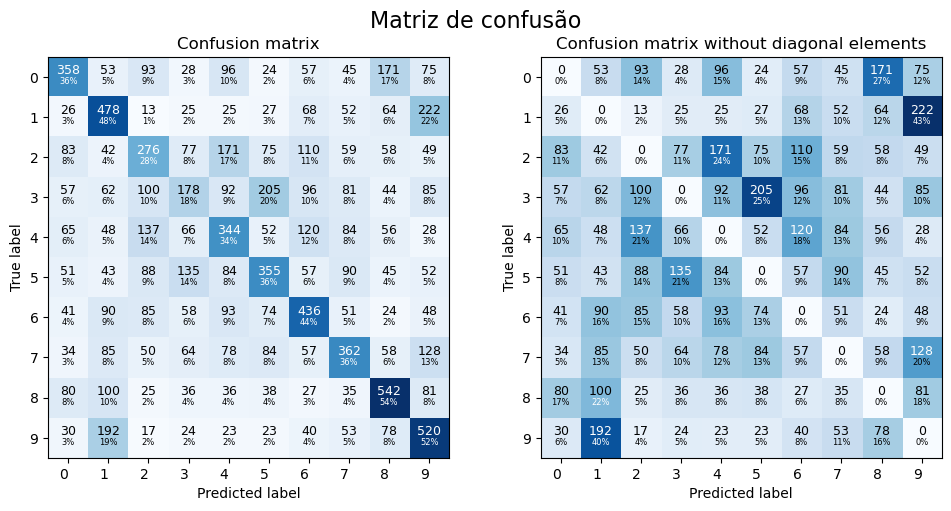

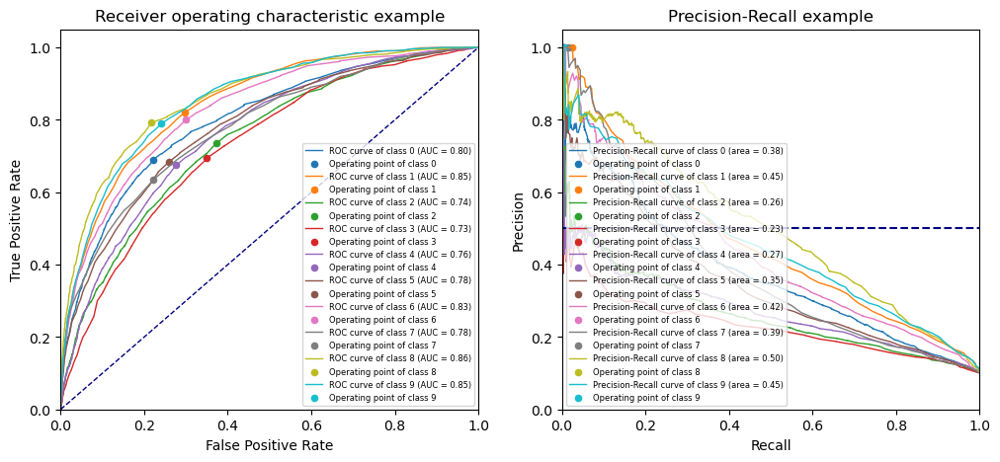

In [39]:
classifier_metricsMulticlasse['Random ForestPCA'] = multiclass_process(rf, X2p, y2, random=True)

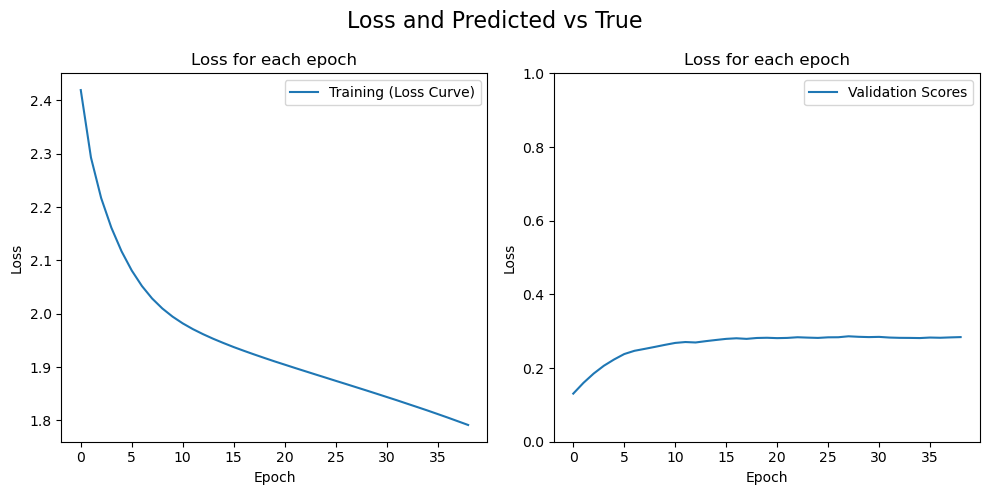

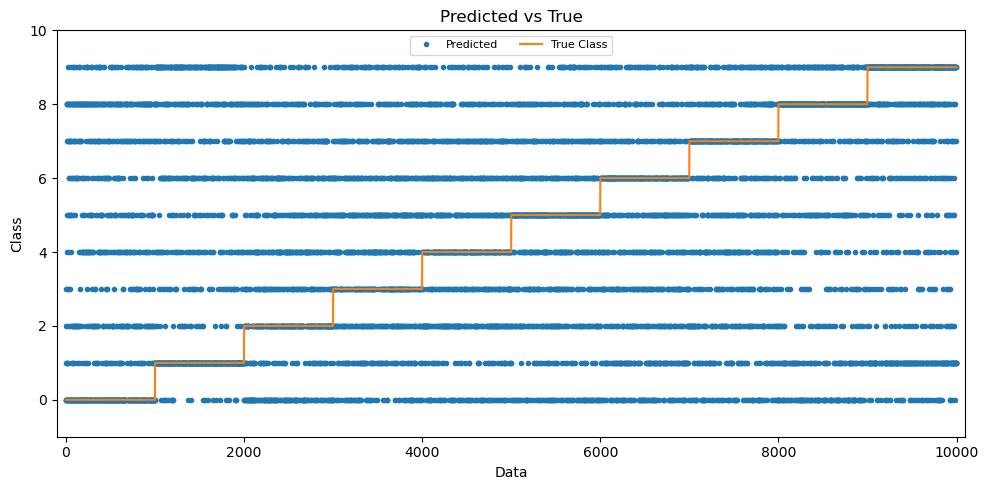

Mostrar as métricas:
Total de erros: 7081 | % Erros: 0.7081 | Accuracy: 0.29
Recall: 0.29 | F1: 0.29 | Precision: 0.29
Relatório de classificação (Validacao):
|    | Classes      |   precision |   recall |   f1-score |   support |   Erros(classe) |   % acc (classe) | Confundida com   |
|---:|:-------------|------------:|---------:|-----------:|----------:|----------------:|-----------------:|:-----------------|
|  0 | 0 airplane   |       0.305 |    0.311 |      0.308 |      1000 |             689 |             31.1 | 8 ship           |
|  1 | 1 automobile |       0.343 |    0.375 |      0.359 |      1000 |             625 |             37.5 | 9 truck          |
|  2 | 2 bird       |       0.237 |    0.223 |      0.23  |      1000 |             777 |             22.3 | 0 airplane       |
|  3 | 3 cat        |       0.218 |    0.151 |      0.178 |      1000 |             849 |             15.1 | 5 dog            |
|  4 | 4 deer       |       0.22  |    0.204 |      0.212 |      1000 |  

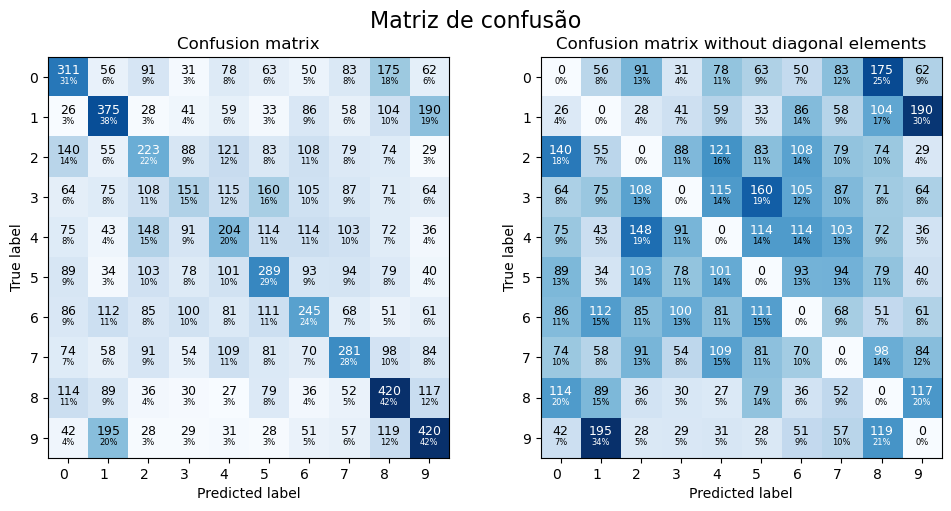

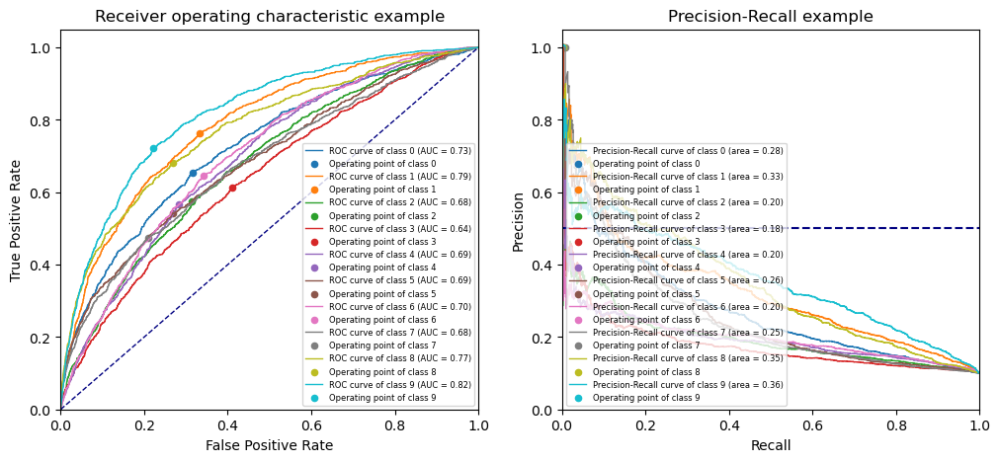

In [38]:
# X1p, y1, X2p, y2
name = 'MLPPCA'
classifier_metricsMulticlasse[name] = multiclass_process(MLP, X2p, y2)

In [42]:
print_summary(classifier_metricsMulticlasse)

|               |   num_erros |   perc_num_erros |    acc |   recall |       f1 |   precision |
|:--------------|------------:|-----------------:|-------:|---------:|---------:|------------:|
| MLP           |        5972 |           0.5972 | 0.4028 |   0.4028 | 0.399267 |    0.40303  |
| MLPNormalized |        6280 |           0.628  | 0.372  |   0.372  | 0.369602 |    0.368321 |
| MLPPCA        |        7081 |           0.7081 | 0.2919 |   0.2919 | 0.287679 |    0.286197 |
|:--------------|
| MLP           |
| MLPNormalized |
| MLPPCA        |


Olhando para os graficos da loss por cada epoca podemos ver que se deixasemos o classificador trabalhar que o erro e os acertos do conjunto de validacao poderiam melhorar, mas como o tempo de computacao e elevado, decidimos parar o treino do classificador.

Ao observarmos as curvas roc e da precison-recall de cada classe do classificador podemos conlcuir que as classes mais bem classificadas foram as classe 1, 9 e 8 respetivamente por ordem, quando olhamos para as metrica da ca area de cada curva, dand uma ideia de como o classificador se esta a comportar para cada classe.

Com a tabela anterior podemos verificar que de entres os classificadores anteriores o classificador MLPPCA foi o que teve piores resultados.

## 4. Multiclass classification with Normalized Data and PCA

#### Transform the data with StandardScaler (0-1) and PCA

In [40]:
import numpy as np

# normalize the data with StandardScaler
X1n, X2n = normalize(X1, X2)

# n_components = np.arange(0, 400, 40)
# models = [PCA(n_components=i).fit(X1n) for i in n_components]
# plt.figure(figsize=(5, 4))
# plt.title('Explained Variance Ratio with 99%')
# plt.plot(n_components, [m.explained_variance_ratio_.sum() for m in models])
# plt.axhline(y=0.99, color='r', linestyle='-')
# plt.xlabel('n_components')
# plt.ylabel('explained variance ratio')
# plt.show()

In [41]:
# PCA com 99% da variância explicada
from sklearn.decomposition import PCA

X1np, X2np = principal_component_analysis(X1n, X2n, n_components=0.99)

print("X1n:", X1n.shape, X2n.shape)
print("X1np:", X1np.shape, X2np.shape)

X1n: (50000, 1024) (10000, 1024)
X1np: (50000, 437) (10000, 437)


#### Treino, ajuste do modelo e analise dos resultados

In [42]:
rf = RandomForestClassifier(n_estimators= 350, 
                            max_depth= 45,
                            random_state=42, 
                            n_jobs=N_JOBS).fit(X1np, y1)

In [41]:
# X1np, y1, X2np, y2 

# Treino do modelo
MLP = MLPClassifier( hidden_layer_sizes=(256, 256), verbose=True,
                      activation='tanh', solver='sgd', max_iter=100,
                      alpha=0.001, early_stopping=True)

# model = ajuste_hiperparametros(model, X_train, y_train, X_val, y_val, cv=2)
history = MLP.fit(X1np, y1) #44 epochs?

print("X:", X1np.shape, X2np.shape)
print("y:", y1.shape, y2.shape)

Iteration 1, loss = 2.43026264
Validation score: 0.123200
Iteration 2, loss = 2.30011996
Validation score: 0.161800
Iteration 3, loss = 2.22299235
Validation score: 0.190000
Iteration 4, loss = 2.16708410
Validation score: 0.211400
Iteration 5, loss = 2.12242610
Validation score: 0.227600
Iteration 6, loss = 2.08564947
Validation score: 0.236800
Iteration 7, loss = 2.05558006
Validation score: 0.247600
Iteration 8, loss = 2.03114247
Validation score: 0.256800
Iteration 9, loss = 2.01136195
Validation score: 0.260600
Iteration 10, loss = 1.99531687
Validation score: 0.266200
Iteration 11, loss = 1.98197068
Validation score: 0.273200
Iteration 12, loss = 1.97060001
Validation score: 0.275200
Iteration 13, loss = 1.96071930
Validation score: 0.276800
Iteration 14, loss = 1.95199839
Validation score: 0.279200
Iteration 15, loss = 1.94398415
Validation score: 0.279200
Iteration 16, loss = 1.93653806
Validation score: 0.281400
Iteration 17, loss = 1.92944306
Validation score: 0.282400
Iterat

#### Analise dos resultados no conjunto de teste

Mostrar as métricas:
Total de erros: 6223 | % Erros: 0.6223 | Accuracy: 0.38
Recall: 0.38 | F1: 0.37 | Precision: 0.37
Relatório de classificação (Validacao):
|    | Classes      |   precision |   recall |   f1-score |   support |   Erros(classe) |   % acc (classe) | Confundida com   |
|---:|:-------------|------------:|---------:|-----------:|----------:|----------------:|-----------------:|:-----------------|
|  0 | 0 airplane   |       0.413 |    0.339 |      0.373 |      1000 |             661 |             33.9 | 8 ship           |
|  1 | 1 automobile |       0.397 |    0.437 |      0.416 |      1000 |             563 |             43.7 | 9 truck          |
|  2 | 2 bird       |       0.332 |    0.287 |      0.308 |      1000 |             713 |             28.7 | 4 deer           |
|  3 | 3 cat        |       0.261 |    0.167 |      0.204 |      1000 |             833 |             16.7 | 5 dog            |
|  4 | 4 deer       |       0.33  |    0.347 |      0.339 |      1000 |  

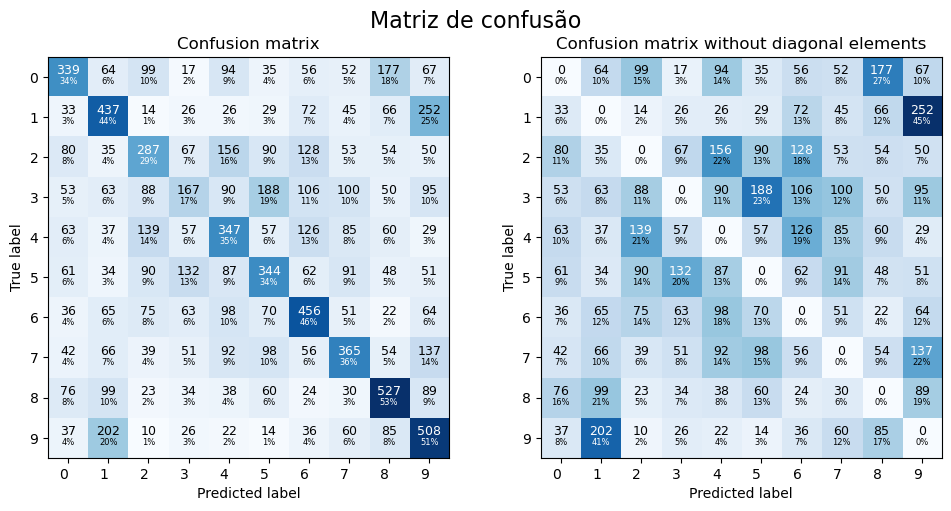

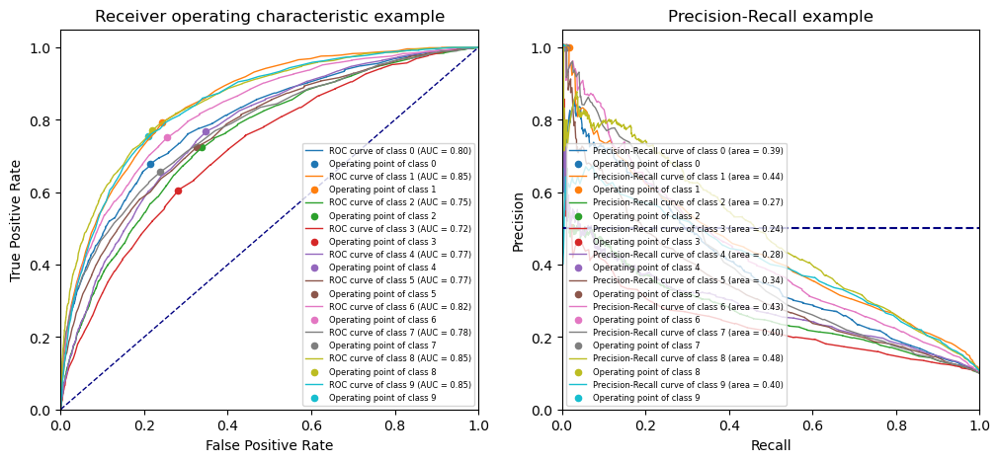

In [44]:
classifier_metricsMulticlasse['Random ForestNorPCA'] = multiclass_process(rf, X2np, y2, random=True)

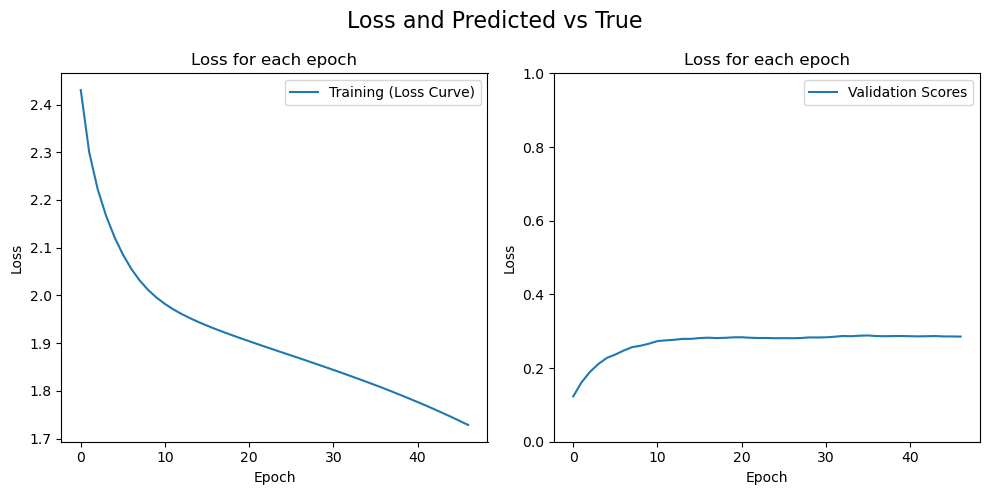

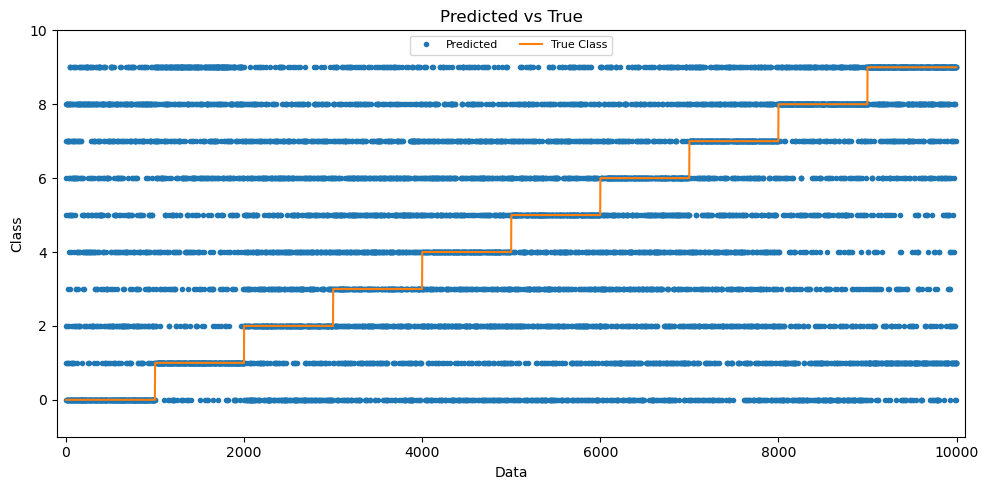

Mostrar as métricas:
Total de erros: 7177 | % Erros: 0.7177 | Accuracy: 0.28
Recall: 0.28 | F1: 0.28 | Precision: 0.28
Relatório de classificação (Validacao):
|    | Classes      |   precision |   recall |   f1-score |   support |   Erros(classe) |   % acc (classe) | Confundida com   |
|---:|:-------------|------------:|---------:|-----------:|----------:|----------------:|-----------------:|:-----------------|
|  0 | 0 airplane   |       0.31  |    0.311 |      0.31  |      1000 |             689 |             31.1 | 8 ship           |
|  1 | 1 automobile |       0.327 |    0.347 |      0.337 |      1000 |             653 |             34.7 | 9 truck          |
|  2 | 2 bird       |       0.23  |    0.222 |      0.226 |      1000 |             778 |             22.2 | 0 airplane       |
|  3 | 3 cat        |       0.211 |    0.157 |      0.18  |      1000 |             843 |             15.7 | 5 dog            |
|  4 | 4 deer       |       0.24  |    0.222 |      0.231 |      1000 |  

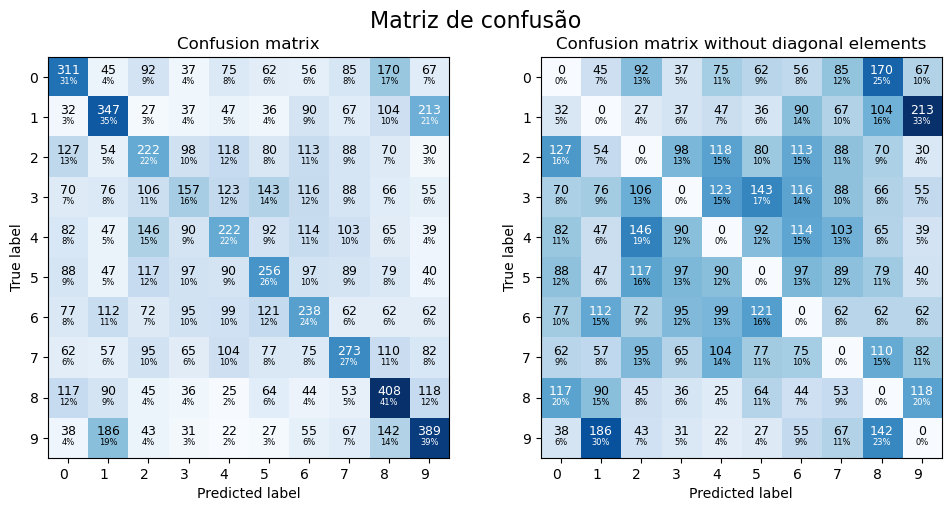

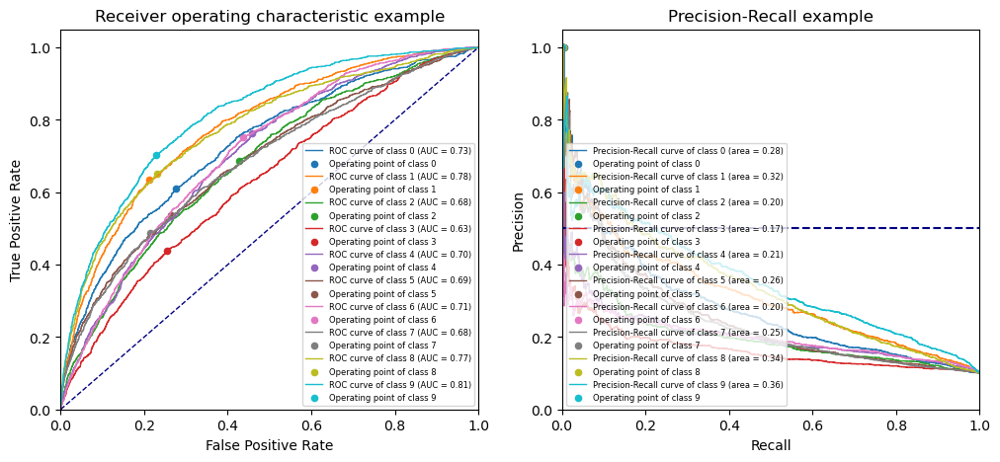

In [43]:
# X1np, y1, X2np, y2
name = 'MLPNormalizedPCA'
classifier_metricsMulticlasse[name] = multiclass_process(MLP, X2np, y2)


Aqui, A accuracy é de 0.28, o que significa que cerca de 72% das previsões estão incorretas. A precisão para cada classe varia de 0,211 para gatos até 0,353 para trucks. As classes de avião, trucks e navio foram confundidas entre si em algumas previsões, como evidenciado pelos valores em "Confundida com" na tabela.

Em comparação com os resultados anteriores, estes resultados mostram uma precisão geral menor do que as outras tabelas, indicando que a abordagem usada não foi tão eficaz para este conjunto de dados. Além disso, as classes de avião, caminhão e navio continuam a ser confundidas entre si em algumas previsões.

# Conclusion

In [45]:
print_summary(classifier_metricsMulticlasse)

|                         |   num_erros |   perc_num_erros |    acc |   recall |       f1 |   precision |
|:------------------------|------------:|-----------------:|-------:|---------:|---------:|------------:|
| MLP                     |        5897 |           0.5897 | 0.4103 |   0.4103 | 0.405595 |    0.413194 |
| Random Forest           |        5669 |           0.5669 | 0.4331 |   0.4331 | 0.429715 |    0.431261 |
| Random ForestNormalized |        8312 |           0.8312 | 0.1688 |   0.1688 | 0.093073 |    0.294273 |
| Random ForestPCA        |        6151 |           0.6151 | 0.3849 |   0.3849 | 0.379292 |    0.378984 |
| Random ForestNorPCA     |        6223 |           0.6223 | 0.3777 |   0.3777 | 0.371834 |    0.372045 |
|:------------------------|
| MLP                     |
| Random Forest           |
| Random ForestNormalized |
| Random ForestPCA        |
| Random ForestNorPCA     |


#### Classificação Binaria
Considerando as tabelas apresentadas, é possível perceber que os modelos de classificação binária, RandomForest e KNN Classifier, apresentaram resultados semelhantes em termos de desempenho, sendo que o modelo RandomForest obteve uma precisão um pouco maior em relação ao modelo KNN. Além disso, os resultados obtidos com a normalização dos dados foram muito próximos aos resultados obtidos sem normalização.

A utilização do PCA para redução de dimensionalidade não apresentou uma melhora significativa no desempenho do modelo RandomForest em relação às outras tabelas que não utilizaram PCA. Entretanto, o PCA reduziu o tempo de processamento, o que pode ser útil em casos onde a quantidade de dados é muito grande.

#### Classificação multiclasse
Já a classificação multiclasse apresentou uma complexidade maior em relação à classificação binária, tendo em vista a presença de mais de duas classes. O modelo utilizado Multi-layer Perceptron (MLP) mostrou uma boa performance na tarefa de classificação multiclasse. Os resultados obtidos na matriz de confusão e no relatório de classificação indicaram que o modelo foi capaz de classificar corretamente a maioria das amostras.

De forma geral, os resultados apresentados indicam que a escolha do modelo e dos parâmetros pode influenciar significativamente o desempenho da classificação. Além disso, a normalização dos dados e a redução de dimensionalidade (com PCA) podem ser úteis em alguns casos para melhorar o desempenho e reduzir o tempo de processamento.

Assim sendo os classificadores que tiveram melhor performace foram MLP, MLPNormalized, MPLPCA e MLPNormalizedPCA, por ordem de performace.